# The Impact of Traffic Management on Air Quality in Sheffield

This is the final notebook for all the conducted work. You'll find five different sections:
1. AQ Data Preparation
2. AQ Changes
3. DiD Analysis
4. Traffic Data Preparation and Changes
5. Traffic Correlation

This notebook will perform the majority of the process. Data is stored in pickles in the associated files to save on loading time (would take a few hours), but these raw files were downloaded straight from SUFO and their processing is all done in here.

You will need the Sheffield University FortiClient VPN activated to access data from SUFO, this is required for *04 Traffic Data Preparation*

Place the folder somewhere on your system and specify the path below. Ensure this is somewhere VS Code (or any other editor) can access.




In [ ]:
folder_path = "G:/My Drive/03 Semester 3" #Enter your path here

# 00 Libraries

Load in the libraries we need for analysis. Ensure that SUFO_AQ.py and SUFO_Traffic.py are on the same path as the notebook to allow these libraries to be loaded.

In [ ]:
# SUFO Retrieval tools
import SUFO_AQ
import SUFO_Traffic

# Data manipulation
import pandas as pd
import numpy as np
import datetime
import os

# Plotting
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from matplotlib.font_manager import FontProperties

#For the DiD model
import statsmodels.api as sm
import scipy.stats as stats

#For Maps
import osmnx as ox
import geopandas as gpd
from shapely.geometry import Point

#For R and weather normalisation
from IPython import get_ipython


# 01 AQ Data Preparation

First we'll find AQ monitoring sites, handle missing values, weather-normalise the data and calcualte the daily means.

## Data Availability

We identified a number of site names from SUFO's online map. We can load the data for these and plot the availability for each site for both NO2 and PM25

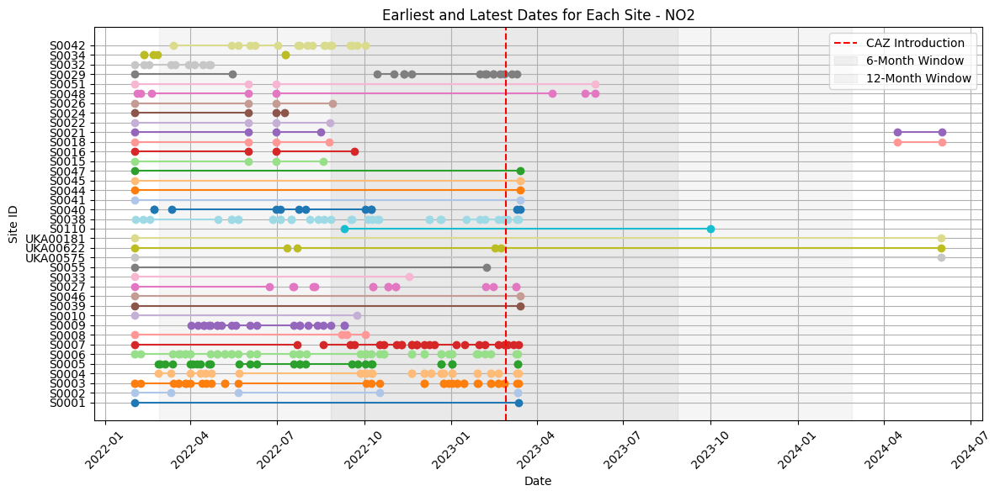

In [ ]:
date_start = "2022-02-01T01:00:00"
date_end = "2024-06-01T01:00:00"
path = folder_path + "/Data/Raw/SUFO AQ/"
pollutant = "NO2"


#List of sites reporting NO
NO_sites_list = ["S0001","S0002","S0003","S0004","S0005","S0006","S0007","S0008","S0009","S0010","S0039","S0046","S0027","S0033","S0055",
                 "UKA00575","UKA00622","UKA00181","S0110","S0038","S0040","S0041","S0044","S0045","S0047","S0015","S0016","S0018","S0021",
                 "S0022","S0024","S0026","S0048","S0051","S0029","S0032","S0034","S0042"]

def get_merged_segments(data):
    data['non_zero'] = (data['n_points'] > 0).astype(int)
    data['segment'] = (data['non_zero'].diff().ne(0).cumsum() * data['non_zero'])
    merged_segments = []
    current_start = None
    current_end = None

    for _, row in data.iterrows():
        if row['n_points'] > 0:
            if current_start is None:
                current_start = row['date']
            current_end = row['date']
        else:
            if current_end is not None and (row['date'] - current_end).days > 3:
                merged_segments.append((current_start, current_end))
                current_start = None
                current_end = None

    if current_start is not None:
        merged_segments.append((current_start, current_end))

    return merged_segments

fig, ax = plt.subplots(figsize=(12, 6))
colors = plt.cm.tab20.colors  # Use tab20 colormap for distinct colors
color_map = {sensor: colors[i % len(colors)] for i, sensor in enumerate(NO_sites_list)}

for sensor in NO_sites_list:
    fname = sensor + "_" + date_start[:10].replace('-', '') + "_" + date_end[:10].replace('-', '') + "_" + pollutant
    try:
        #Try and read
        qual_eval = pd.read_pickle(path + fname)
    except Exception as e:
        #Else get the data to a pickle and read that
        SUFO_AQ.parse_sensor(sensor,date_start, date_end,"time",pollutant,path)
        qual_eval = pd.read_pickle(path + fname)

    #Remove big negative values (these are QC flags)
    qual_eval = qual_eval[qual_eval[pollutant] > -1000]
    #Make sure in datetime
    qual_eval['ISO_time'] = pd.to_datetime(qual_eval['ISO_time'])

    #Group by day and count
    points_per_day = qual_eval.groupby(qual_eval['ISO_time'].dt.date).size()
    # Create a date range that covers the entire period of the data
    date_range = pd.date_range(start = datetime.datetime.strptime("2022-02-01", "%Y-%m-%d"), end=datetime.datetime.strptime("2024-06-01", "%Y-%m-%d"), freq='D')
    # Reindex to include missing dates, filling missing values with 0
    points_per_day = points_per_day.reindex(date_range, fill_value=0)

    df = pd.DataFrame(points_per_day)
    df = df.reset_index()
    df.columns = ["date","n_points"]

    df['date'] = pd.to_datetime(df['date'])
    all_dates = pd.date_range(start=df['date'].min(), end=df['date'].max())
    df = df.set_index('date').reindex(all_dates, fill_value=0).reset_index()
    df.rename(columns={'index': 'date'}, inplace=True)

    merged_segments = get_merged_segments(df)
    for start_date, end_date in merged_segments:
        ax.plot([start_date, end_date], [sensor, sensor], marker='o', color=color_map[sensor])

ax.set_xlabel('Date')
ax.set_ylabel('Site ID')
ax.set_title('Earliest and Latest Dates for Each Site - NO2')

#Now add a vertical line and shading
caz_vdate = pd.Timestamp('2023-02-27')
ax.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

Now for PM25

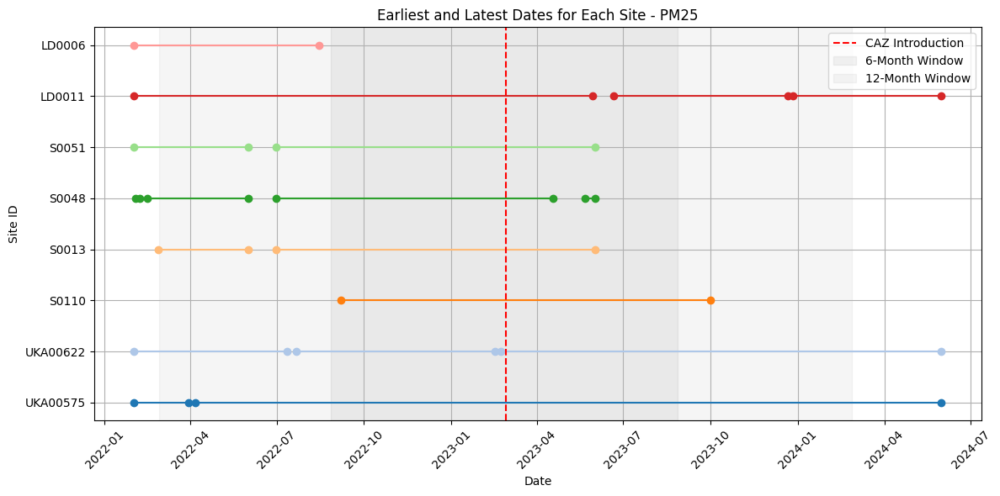

In [ ]:
path = folder_path + "/Data/Raw/SUFO AQ/"
pollutant = "PM25"

#List of sites reporting PM25
PM25_sites_list = ["UKA00575","UKA00622","S0110","S0013","S0048","S0051","LD0011","LD0006"]

def get_merged_segments(data):
    data['non_zero'] = (data['n_points'] > 0).astype(int)
    data['segment'] = (data['non_zero'].diff().ne(0).cumsum() * data['non_zero'])
    merged_segments = []
    current_start = None
    current_end = None

    for _, row in data.iterrows():
        if row['n_points'] > 0:
            if current_start is None:
                current_start = row['date']
            current_end = row['date']
        else:
            if current_end is not None and (row['date'] - current_end).days > 3:
                merged_segments.append((current_start, current_end))
                current_start = None
                current_end = None

    if current_start is not None:
        merged_segments.append((current_start, current_end))

    return merged_segments

fig, ax = plt.subplots(figsize=(12, 6))
colors = plt.cm.tab20.colors  # Use tab20 colormap for distinct colors
color_map = {sensor: colors[i % len(colors)] for i, sensor in enumerate(PM25_sites_list)}

for sensor in PM25_sites_list:
    fname = sensor + "_" + date_start[:10].replace('-', '') + "_" + date_end[:10].replace('-', '') + "_" + pollutant
    try:
        #Try and read
        qual_eval = pd.read_pickle(path + fname)
    except Exception as e:
        #Else get the data to a pickle and read that
        SUFO_AQ.parse_sensor(site_id,date_start, date_end,"time",pollutant,path)
        qual_eval = pd.read_pickle(path + fname)

    #Remove big negative values (these are QC flags)
    qual_eval = qual_eval[qual_eval[pollutant] > -1000]
    #Make sure in datetime
    qual_eval['ISO_time'] = pd.to_datetime(qual_eval['ISO_time'])

    #Group by day and count
    points_per_day = qual_eval.groupby(qual_eval['ISO_time'].dt.date).size()
    # Create a date range that covers the entire period of the data
    date_range = pd.date_range(start = datetime.datetime.strptime("2022-02-01", "%Y-%m-%d"), end=datetime.datetime.strptime("2024-06-01", "%Y-%m-%d"), freq='D')
    # Reindex to include missing dates, filling missing values with 0
    points_per_day = points_per_day.reindex(date_range, fill_value=0)

    df = pd.DataFrame(points_per_day)
    df = df.reset_index()
    df.columns = ["date","n_points"]

    df['date'] = pd.to_datetime(df['date'])
    all_dates = pd.date_range(start=df['date'].min(), end=df['date'].max())
    df = df.set_index('date').reindex(all_dates, fill_value=0).reset_index()
    df.rename(columns={'index': 'date'}, inplace=True)

    merged_segments = get_merged_segments(df)
    for start_date, end_date in merged_segments:
        ax.plot([start_date, end_date], [sensor, sensor], marker='o', color=color_map[sensor])

ax.set_xlabel('Date')
ax.set_ylabel('Site ID')
ax.set_title('Earliest and Latest Dates for Each Site - PM25')

#Now add a vertical line and shading
caz_vdate = pd.Timestamp('2023-02-27')
ax.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

plt.legend(loc = "upper right")

plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()

### Map of Sensors

In [ ]:
all_sites = SUFO_AQ.locate_AQ_sites("2022-02-25T01:00:00","2022-02-26T01:00:00","53.38053145527386","-1.4695918832784804","1")
all_sites_df = pd.DataFrame(all_sites, columns = ["site","coords","cols"])

#Now take a few slices from another point, make sure we get them all
add_sites = SUFO_AQ.locate_AQ_sites("2023-02-25T01:00:00","2023-02-26T01:00:00","53.38053145527386","-1.4695918832784804","1")

#Check if we have any new
for x in range(0,len(add_sites)):
    if add_sites[x][0] not in list(all_sites_df["site"]):
        all_sites.append(add_sites[x])

#Now make it a DF
all_sites_df = pd.DataFrame(all_sites, columns = ["site","coords","cols"])
#Remove the weather-only ones
all_sites_df = all_sites_df[~all_sites_df['site'].str[:2].apply(lambda x: x == 'PP')]


Now we will plot as a map, first denote what the marker should be, NO2, PM25 or both

In [ ]:
all_sites_df['PM25_exists'] = all_sites_df['cols'].apply(lambda x: 'PM25' in x)*1
all_sites_df['NO2_exists'] = all_sites_df['cols'].apply(lambda x: 'NO2' in x)*1
all_sites_df["both"] = all_sites_df['PM25_exists'] * all_sites_df['NO2_exists']

no2_sites = all_sites_df[(all_sites_df["NO2_exists"] == 1) & (all_sites_df["both"] == 0)]
pm25_sites = all_sites_df[(all_sites_df["PM25_exists"] == 1) & (all_sites_df["both"] == 0)]
both_sites = all_sites_df[(all_sites_df["both"] == 1)]


Now the map

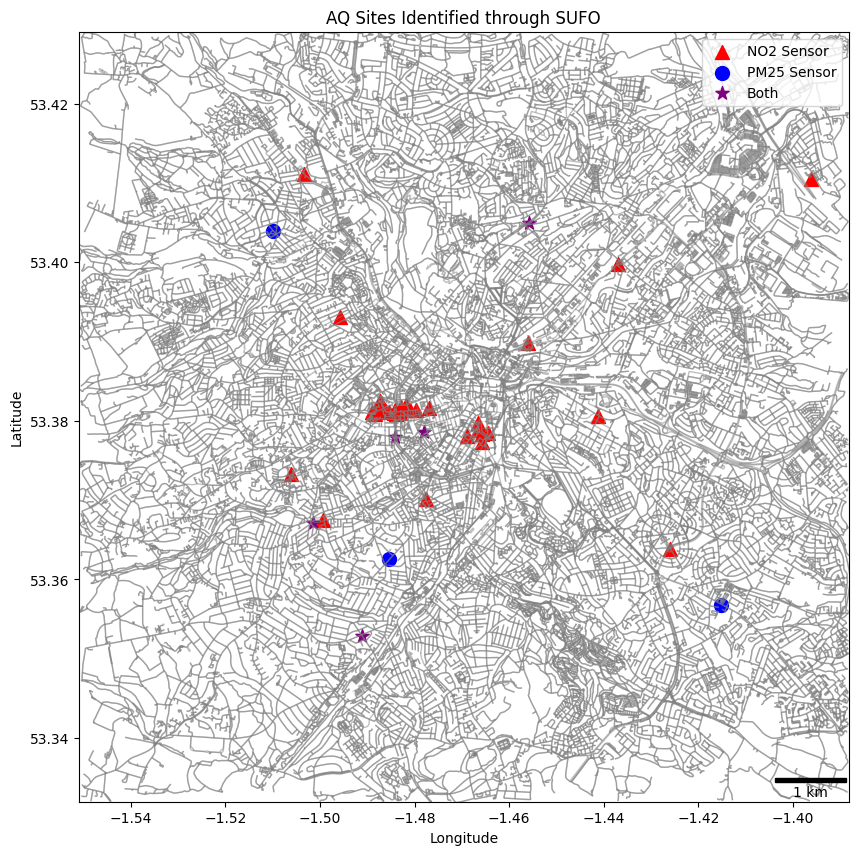

In [ ]:

lat  = "53.38053145527386"
long = "-1.4695918832784804"

# Define the bounding box coordinates (in this example, a small area in Sheffield)
north, east, south, west = SUFO_Traffic.calculate_bounding_box(lat, long, "4.5")

#Maps are saved as GraphML, load the correct one
filename = f"sheffield_{south}_{west}_{north}_{east}.graphml"
path = folder_path + "/Maps/"

#Now load
file_path = path + filename

# Check if the file exists
if os.path.exists(file_path):
    # Load the graph from the file
    graph = ox.load_graphml(filepath=file_path)
else:
    # If the file doesn't exist, download and save the graph as before
    graph = ox.graph_from_bbox(north, south, east, west, network_type='all')
    ox.save_graphml(graph, filepath=file_path)

# Convert the graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(graph)

#Now plot
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='gray', alpha = 0.5)

#Now plot the markers
no2_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in list(no2_sites["coords"])],
    crs="EPSG:4326"
)
no2_markers = no2_markers.to_crs(edges.crs)
no2_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='NO2 Sensor', alpha = 1)

pm25_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in list(pm25_sites["coords"])],
    crs="EPSG:4326"
)
pm25_markers = pm25_markers.to_crs(edges.crs)
pm25_markers.plot(ax=ax, color='blue', marker='o', markersize=100, label='PM25 Sensor', alpha = 1)


both_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in list(both_sites["coords"])],
    crs="EPSG:4326"
)
both_markers = both_markers.to_crs(edges.crs)
both_markers.plot(ax=ax, color='purple', marker='*', markersize=100, label='Both', alpha = 1)

#Add a scale bar
scale_bar_length = 0.015 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f'1 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0005,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"AQ Sites Identified through SUFO")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

From this we can see there are very few sites that have data for the entire period. Three of those are DEFRA sites. These will be used for Primary analysis, with S0021, S0018, S0110 and LD0011 used for secondary analysis. Below is an updated map of the sites we'll use.

In [ ]:
tar_pm_sites = ["UKA00575","UKA00622","UKA00181","S0110","LD0011"]
tar_no_sites = ["UKA00575","UKA00622","UKA00181","S0110","S0021","S0018"]

no2_sites_filt = all_sites_df[all_sites_df['site'].isin(tar_no_sites)]
no2_sites_filt = no2_sites_filt[(no2_sites_filt["both"] == 0) & (no2_sites_filt["site"] != "UKA00181")]

pm25_sites_filt = all_sites_df[all_sites_df['site'].isin(tar_pm_sites)]
pm25_sites_filt = pm25_sites_filt[(pm25_sites_filt["both"] == 0) & (pm25_sites_filt["site"] != "UKA00181")]

both_sites_filt = all_sites_df[(all_sites_df['site'].isin(tar_no_sites)) & (all_sites_df['site'].isin(tar_pm_sites))]


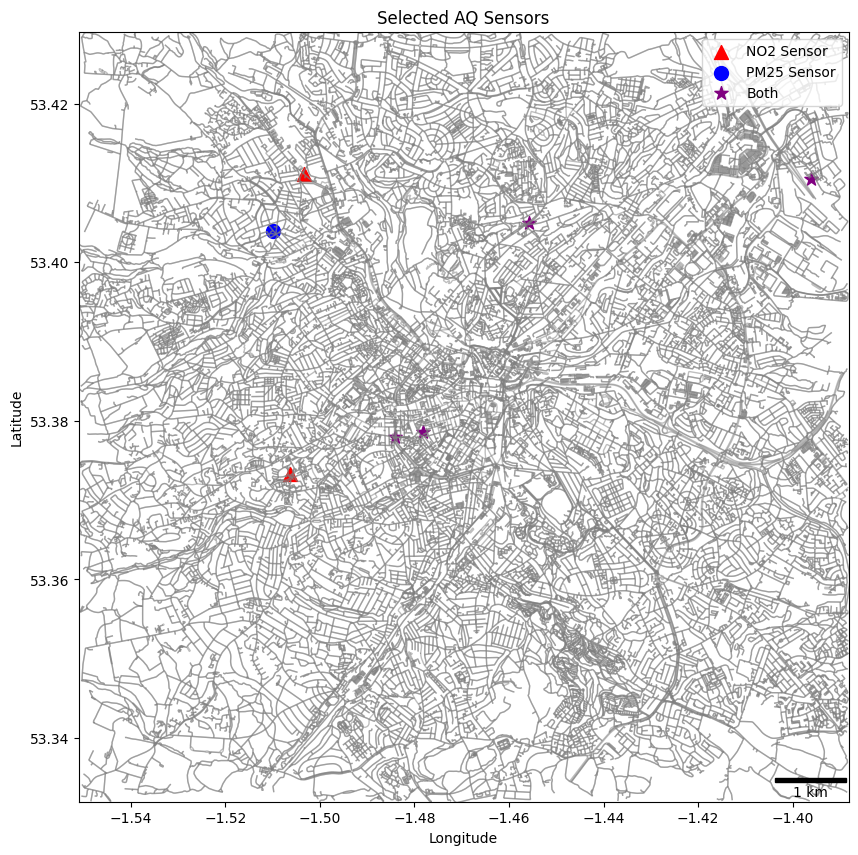

In [ ]:

#Create the plot
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='gray', alpha = 0.5)


no2_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in list(no2_sites_filt["coords"])],
    crs="EPSG:4326"
)
no2_markers = no2_markers.to_crs(edges.crs)
no2_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='NO2 Sensor', alpha = 1)

pm25_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in list(pm25_sites_filt["coords"])],
    crs="EPSG:4326"
)
pm25_markers = pm25_markers.to_crs(edges.crs)
pm25_markers.plot(ax=ax, color='blue', marker='o', markersize=100, label='PM25 Sensor', alpha = 1)


both_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in list(both_sites_filt["coords"])],
    crs="EPSG:4326"
)
both_markers = both_markers.to_crs(edges.crs)
both_markers.plot(ax=ax, color='purple', marker='*', markersize=100, label='Both', alpha = 1)

#Add a scale bar
scale_bar_length = 0.015 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f'1 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0005,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"Selected AQ Sensors")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

## DEFRA Site Data

For the primary sites we'll also be performing weather normalisation. Weather conditions surrounding each site was avaialble directly through DEFRA. We previously downloaded the CSVs and converted them into pickles. We'll load this data in and plot them.

### UKA00575 Devonshire Green

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1388348444.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKA00575_PM25['date'] = pd.to_datetime(UKA00575_PM25['date']) #Make sure in datetime


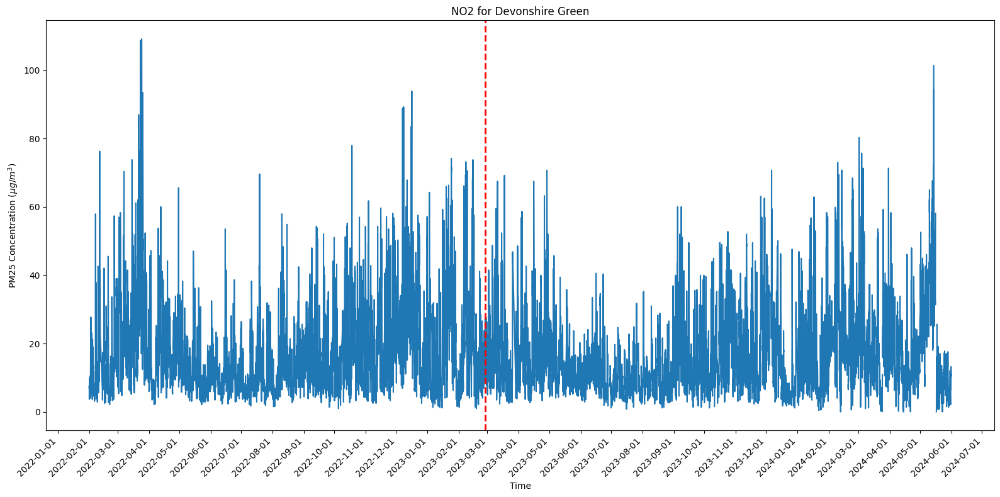

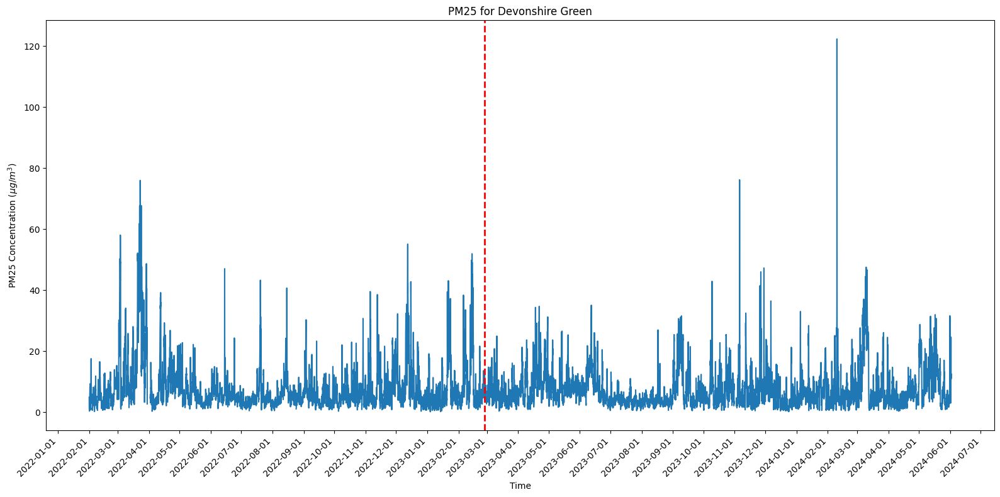

In [ ]:
read_path = folder_path + "/Data/Raw/DEFRA/"

UKA00575_All = pd.read_pickle(read_path + "UKA00575_All")

UKA00575_PM25 = UKA00575_All[["Datetime","PM25"]]
UKA00575_PM25.columns = ["date","PM25"]
UKA00575_PM25['date'] = pd.to_datetime(UKA00575_PM25['date']) #Make sure in datetime

UKA00575_NO2 = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/UKA00575_20220201_20240601_NO2")
UKA00575_NO2["NO2"] = UKA00575_NO2["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
UKA00575_NO2 = UKA00575_NO2[["ISO_time","NO2"]]
UKA00575_NO2.columns = ["date","NO2"]
UKA00575_NO2['date'] = pd.to_datetime(UKA00575_NO2['date']) #Make sure in datetime

#Plot the NO2
fig, axes = plt.subplots(figsize=(16, 8))

plt.plot(UKA00575_NO2["date"],UKA00575_NO2["NO2"])

axes.axvline(pd.Timestamp('2023-02-27'), color='red', linestyle='--', linewidth=2)

# Set the date format on the x-axis
axes.xaxis.set_major_locator(mdates.MonthLocator())
axes.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Rotate and align the tick labels so they look better
plt.setp(axes.xaxis.get_majorticklabels(), rotation=45, ha="right")

# Set plot title and labels
axes.set_title("NO2 for Devonshire Green")
axes.set_xlabel("Time")
axes.set_ylabel("PM25 Concentration ($µg/m^3$)")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

#Plot the PM25
fig, axes = plt.subplots(figsize=(16, 8))

plt.plot(UKA00575_PM25["date"],UKA00575_PM25["PM25"])

axes.axvline(pd.Timestamp('2023-02-27'), color='red', linestyle='--', linewidth=2)

# Set the date format on the x-axis
axes.xaxis.set_major_locator(mdates.MonthLocator())
axes.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Rotate and align the tick labels so they look better
plt.setp(axes.xaxis.get_majorticklabels(), rotation=45, ha="right")

# Set plot title and labels
axes.set_title("PM25 for Devonshire Green")
axes.set_xlabel("Time")
axes.set_ylabel("PM25 Concentration ($µg/m^3$)")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

### UKA00622 Barnsley Road

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1968770350.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKA00622_PM25['date'] = pd.to_datetime(UKA00622_PM25['date']) #Make sure in datetime
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1968770350.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKA00622_NO2['date'] = pd.to_datetime(UKA00622_NO2['date']) #Make sure in datetime


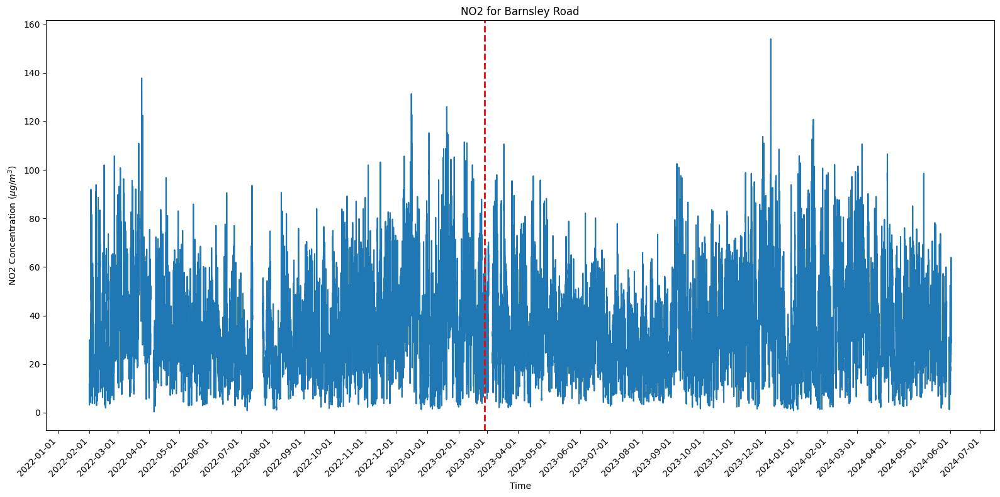

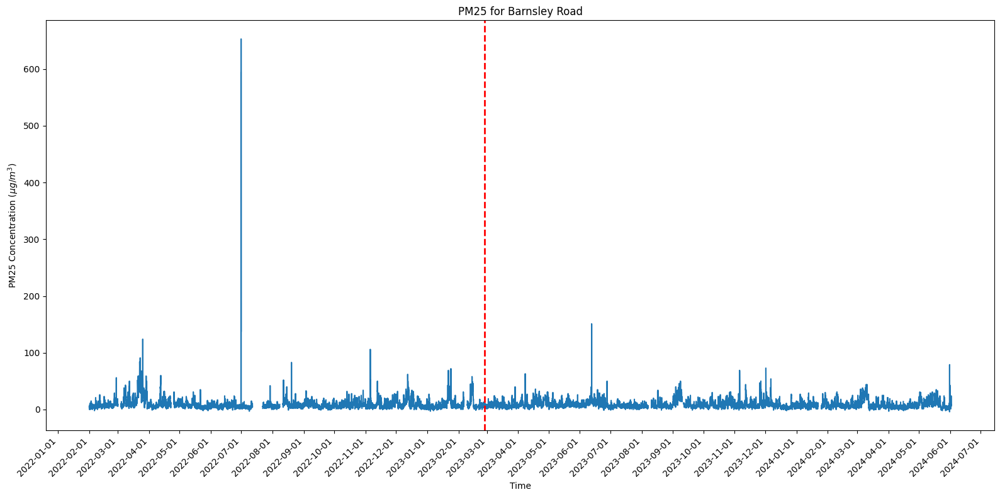

In [ ]:
UKA00622_All = pd.read_pickle(read_path + "UKA00622_All")

UKA00622_PM25 = UKA00622_All[["Datetime","PM25"]]
UKA00622_PM25.columns = ["date","PM25"]
UKA00622_PM25['date'] = pd.to_datetime(UKA00622_PM25['date']) #Make sure in datetime

UKA00622_NO2 = UKA00622_All[["Datetime","NO2"]]
UKA00622_NO2.columns = ["date","NO2"]
UKA00622_NO2['date'] = pd.to_datetime(UKA00622_NO2['date']) #Make sure in datetime

# Plot NO2
fig, axes = plt.subplots(figsize=(16, 8))

plt.plot(UKA00622_NO2["date"],UKA00622_NO2["NO2"])

axes.axvline(pd.Timestamp('2023-02-27'), color='red', linestyle='--', linewidth=2)

# Set the date format on the x-axis
axes.xaxis.set_major_locator(mdates.MonthLocator())
axes.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Rotate and align the tick labels so they look better
plt.setp(axes.xaxis.get_majorticklabels(), rotation=45, ha="right")

# Set plot title and labels
axes.set_title("NO2 for Barnsley Road")
axes.set_xlabel("Time")
axes.set_ylabel("NO2 Concentration ($µg/m^3$)")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

# Plot PM25
fig, axes = plt.subplots(figsize=(16, 8))

plt.plot(UKA00622_PM25["date"],UKA00622_PM25["PM25"])

axes.axvline(pd.Timestamp('2023-02-27'), color='red', linestyle='--', linewidth=2)

# Set the date format on the x-axis
axes.xaxis.set_major_locator(mdates.MonthLocator())
axes.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Rotate and align the tick labels so they look better
plt.setp(axes.xaxis.get_majorticklabels(), rotation=45, ha="right")

# Set plot title and labels
axes.set_title("PM25 for Barnsley Road")
axes.set_xlabel("Time")
axes.set_ylabel("PM25 Concentration ($µg/m^3$)")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()



### UKA00181 Tinsley

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\756707822.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKA00181_PM25['date'] = pd.to_datetime(UKA00622_PM25['date']) #Make sure in datetime


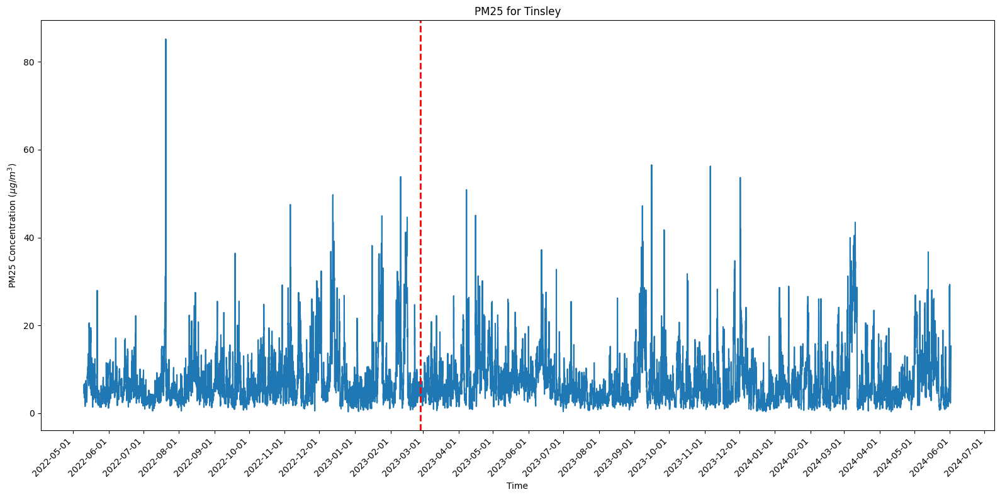

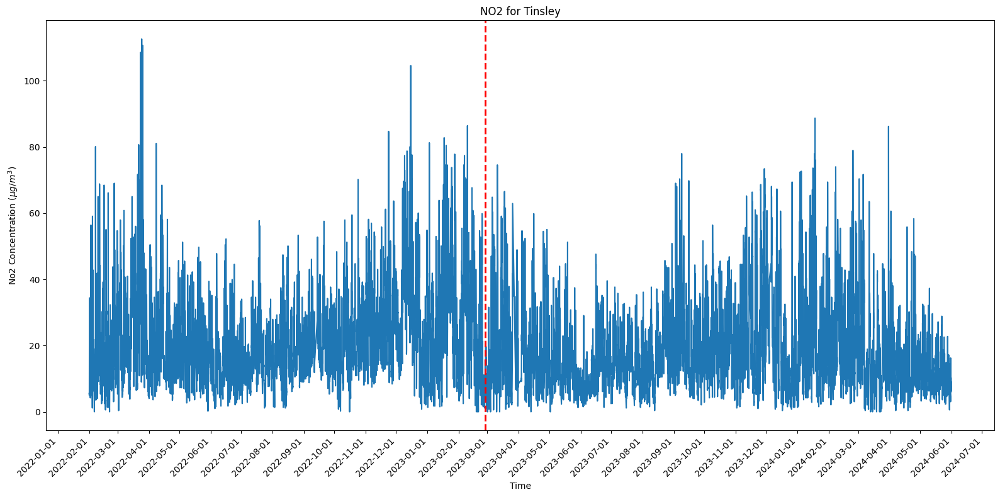

In [ ]:
UKA00181_All = pd.read_pickle(read_path + "UKA00181_All")

UKA00181_PM25 = UKA00181_All[["Datetime","PM25"]]
UKA00181_PM25.columns = ["date","PM25"]
UKA00181_PM25['date'] = pd.to_datetime(UKA00622_PM25['date']) #Make sure in datetime

UKA00181_NO2 = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/UKA00181_20220201_20240601_NO2")
UKA00181_NO2["NO2"] = UKA00181_NO2["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
UKA00181_NO2 = UKA00181_NO2[["ISO_time","NO2"]]
UKA00181_NO2.columns = ["date","NO2"]
UKA00181_NO2['date'] = pd.to_datetime(UKA00181_NO2['date']) #Make sure in datetime


fig, axes = plt.subplots(figsize=(16, 8))

plt.plot(UKA00181_PM25["date"],UKA00181_PM25["PM25"])

axes.axvline(pd.Timestamp('2023-02-27'), color='red', linestyle='--', linewidth=2)

# Set the date format on the x-axis
axes.xaxis.set_major_locator(mdates.MonthLocator())
axes.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Rotate and align the tick labels so they look better
plt.setp(axes.xaxis.get_majorticklabels(), rotation=45, ha="right")

# Set plot title and labels
axes.set_title("PM25 for Tinsley")
axes.set_xlabel("Time")
axes.set_ylabel("PM25 Concentration ($µg/m^3$)")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(figsize=(16, 8))

plt.plot(UKA00181_NO2["date"],UKA00181_NO2["NO2"])

axes.axvline(pd.Timestamp('2023-02-27'), color='red', linestyle='--', linewidth=2)

# Set the date format on the x-axis
axes.xaxis.set_major_locator(mdates.MonthLocator())
axes.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Rotate and align the tick labels so they look better
plt.setp(axes.xaxis.get_majorticklabels(), rotation=45, ha="right")

# Set plot title and labels
axes.set_title("NO2 for Tinsley")
axes.set_xlabel("Time")
axes.set_ylabel("No2 Concentration ($µg/m^3$)")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

## Primary Site Histograms

Plot some histograms of the primary sites

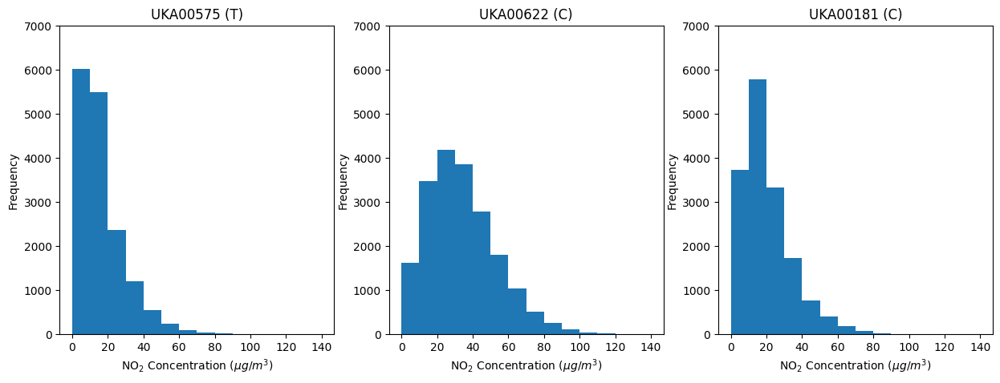

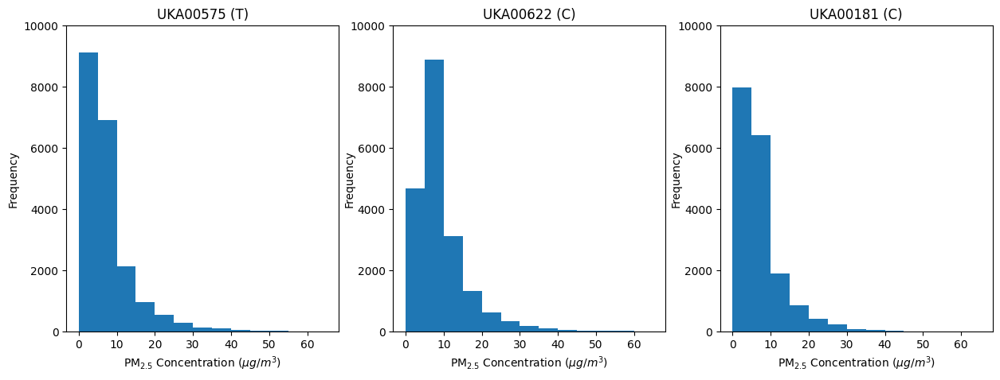

In [ ]:
#NO2
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  #1/3 for each histogram

x_min = 0
x_max = 150
step = 10
ax1 = plt.subplot(gs[0])
ax1.hist(UKA00575_NO2["NO2"],bins = np.arange(x_min,x_max,step))
ax1.set_ylim([0,7000])
ax1.set_title("UKA00575 (T)")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")


ax2 = plt.subplot(gs[1])
ax2.hist(UKA00622_NO2["NO2"],bins = np.arange(x_min,x_max,step))
ax2.set_ylim([0,7000])
ax2.set_title("UKA00622 (C)")
ax2.set_ylabel("Frequency")
ax2.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")

ax3 = plt.subplot(gs[2])
ax3.hist(UKA00181_NO2["NO2"],bins = np.arange(x_min,x_max,step))
ax3.set_ylim([0,7000])
ax3.set_title("UKA00181 (C)")
ax3.set_ylabel("Frequency")
ax3.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")

plt.show()

#PM25
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  # 2/3 for the line plot, 1/3 for the histogram

x_min = 0
x_max = 70
step = 5
ax1 = plt.subplot(gs[0])
ax1.hist(UKA00575_PM25["PM25"],bins = np.arange(x_min,x_max,step))
ax1.set_ylim([0,10000])
ax1.set_title("UKA00575 (T)")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")


ax2 = plt.subplot(gs[1])
ax2.hist(UKA00622_PM25["PM25"],bins = np.arange(x_min,x_max,step))
ax2.set_ylim([0,10000])
ax2.set_title("UKA00622 (C)")
ax2.set_ylabel("Frequency")
ax2.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.yaxis.set_label_coords(-0.14, 0.5)

ax3 = plt.subplot(gs[2])
ax3.hist(UKA00181_PM25["PM25"],bins = np.arange(x_min,x_max,step))
ax3.set_ylim([0,10000])
ax3.set_title("UKA00181 (C)")
ax3.set_ylabel("Frequency")
ax3.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax3.yaxis.set_label_coords(-0.14, 0.5)


plt.show()

## Missing Values

We'll deal with missing values in our data using median imputation as this is less susceptible to outliers and skewed data.

In [ ]:
UKA00575_NO2["NO2"] = UKA00575_NO2["NO2"].fillna(UKA00575_NO2["NO2"].median())
UKA00575_All["NO2"] = UKA00575_All["NO2"].fillna(UKA00575_All["NO2"].median())

UKA00575_PM25["PM25"] = UKA00575_PM25["PM25"].fillna(UKA00575_PM25["PM25"].median())
UKA00575_All["PM25"] = UKA00575_All["PM25"].fillna(UKA00575_All["PM25"].median())

UKA00622_NO2["NO2"] = UKA00622_NO2["NO2"].fillna(UKA00622_NO2["NO2"].median())
UKA00622_All["NO2"] = UKA00622_All["NO2"].fillna(UKA00622_All["NO2"].median())


UKA00622_PM25["PM25"] = UKA00622_PM25["PM25"].fillna(UKA00622_PM25["PM25"].median())
UKA00622_All["PM25"] = UKA00622_All["PM25"].fillna(UKA00622_All["PM25"].median())

UKA00181_NO2["NO2"] = UKA00181_NO2["NO2"].fillna(UKA00181_NO2["NO2"].median())
UKA00181_All["NO2"] = UKA00181_All["NO2"].fillna(UKA00181_All["NO2"].median())

UKA00181_PM25["PM25"] = UKA00181_PM25["PM25"].fillna(UKA00181_PM25["PM25"].median())
UKA00181_All["PM25"] = UKA00181_All["PM25"].fillna(UKA00181_All["PM25"].median())

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\57547571.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKA00575_PM25["PM25"] = UKA00575_PM25["PM25"].fillna(UKA00575_PM25["PM25"].median())
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\57547571.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKA00622_NO2["NO2"] = UKA00622_NO2["NO2"].fillna(UKA00622_NO2["NO2"].median())
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\57547571.py:11: SettingWithCopyWarning: 
A value is trying to be set on a co

## Weather Normalisation

First we'll split up our all data into data ready to be normalised

In [ ]:
#Create variables that will be stored and loaded.
UKA00575_PM25_pre_norm = UKA00575_All[["Datetime","PM25","w_dir","w_vel","temp"]].copy()
UKA00575_PM25_pre_norm.columns = ["date","PM25","w_dir","w_vel","temp"]
UKA00622_PM25_pre_norm = UKA00622_All[["Datetime","PM25","w_dir","w_vel","temp"]].copy()
UKA00622_PM25_pre_norm.columns = ["date","PM25","w_dir","w_vel","temp"]
UKA00181_PM25_pre_norm = UKA00181_All[["Datetime","PM25","w_dir","w_vel","temp"]].copy()
UKA00181_PM25_pre_norm.columns = ["date","PM25","w_dir","w_vel","temp"]

UKA00622_NO2_pre_norm = UKA00622_All[["Datetime","NO2","w_dir","w_vel","temp"]].copy()
UKA00622_NO2_pre_norm.columns = ["date","NO2","w_dir","w_vel","temp"]

#Now we can merge the others
# UKA00575
left_df = UKA00575_All[["Datetime","w_vel","w_dir","temp"]].copy()
left_df.columns = ["date","w_vel","w_dir","temp"]
left_df["date"] = pd.to_datetime(left_df["date"])

UKA00575_NO2_pre_norm = pd.merge(left_df,UKA00575_NO2,on = "date")

#UKA00181
left_df = UKA00181_All[["Datetime","w_vel","w_dir","temp"]].copy()
left_df.columns = ["date","w_vel","w_dir","temp"]
left_df["date"] = pd.to_datetime(left_df["date"])

UKA00181_NO2_pre_norm = pd.merge(left_df,UKA00181_NO2,on = "date")


Now before we normalise we'll also create variables with the pre normalisation data.

In [ ]:
#PM25
test_df = UKA00575_PM25_pre_norm[["date","PM25"]]
test_df["date"] = pd.to_datetime(test_df["date"])
UKA00575_PM25_pre_norm_daily = test_df.set_index("date").resample('D').mean().reset_index()
UKA00575_PM25_pre_norm_daily["PM25"] = UKA00575_PM25_pre_norm_daily["PM25"].fillna(UKA00575_PM25_pre_norm_daily["PM25"].median())

test_df = UKA00622_PM25_pre_norm[["date","PM25"]]
test_df["date"] = pd.to_datetime(test_df["date"])
UKA00622_PM25_pre_norm_daily = test_df.set_index("date").resample('D').mean().reset_index()
UKA00622_PM25_pre_norm_daily["PM25"] = UKA00622_PM25_pre_norm_daily["PM25"].fillna(UKA00622_PM25_pre_norm_daily["PM25"].median())

test_df = UKA00181_PM25_pre_norm[["date","PM25"]]
test_df["date"] = pd.to_datetime(test_df["date"])
UKA00181_PM25_pre_norm_daily = test_df.set_index("date").resample('D').mean().reset_index()
UKA00181_PM25_pre_norm_daily["PM25"] = UKA00181_PM25_pre_norm_daily["PM25"].fillna(UKA00181_PM25_pre_norm_daily["PM25"].median())

#NO2
test_df = UKA00575_NO2_pre_norm[["date","NO2"]]
test_df["date"] = pd.to_datetime(test_df["date"])
UKA00575_NO2_pre_norm_daily = test_df.set_index("date").resample('D').mean().reset_index()
UKA00575_NO2_pre_norm_daily["NO2"] = UKA00575_NO2_pre_norm_daily["NO2"].fillna(UKA00575_NO2_pre_norm_daily["NO2"].median())

test_df = UKA00622_NO2_pre_norm[["date","NO2"]]
test_df["date"] = pd.to_datetime(test_df["date"])
UKA00622_NO2_pre_norm_daily = test_df.set_index("date").resample('D').mean().reset_index()
UKA00622_NO2_pre_norm_daily["NO2"] = UKA00622_NO2_pre_norm_daily["NO2"].fillna(UKA00622_NO2_pre_norm_daily["NO2"].median())


test_df = UKA00181_NO2_pre_norm[["date","NO2"]]
test_df["date"] = pd.to_datetime(test_df["date"])
UKA00181_NO2_pre_norm_daily = test_df.set_index("date").resample('D').mean().reset_index()
UKA00181_NO2_pre_norm_daily["NO2"] = UKA00181_NO2_pre_norm_daily["NO2"].fillna(UKA00181_NO2_pre_norm_daily["NO2"].median())

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3488947135.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df["date"] = pd.to_datetime(test_df["date"])
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3488947135.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df["date"] = pd.to_datetime(test_df["date"])
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3488947135.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

### Using R

Weather normalisation has to be done using R and *rmweather* so we must first get R working in this notebook.

**Set norm_flag below to 0 to prevent R from loading and skip weather normalisation**


In [ ]:
norm_flag = 0

After that, we can start a chunk in R using the magic keys **%%R**

In [ ]:
if norm_flag == 1:
    #To get the R conversion working
    import os
    os.environ["R_HOME"] = r"C:\Program Files\R\R-4.3.1"
    os.environ["PATH"]   = r"C:\Program Files\R\R-4.3.1\bin\x64" + ";" + os.environ["PATH"]

    %load_ext rpy2.ipython
    import rpy2.robjects as robjects
    from rpy2.robjects import pandas2ri, packages
    pandas2ri.activate()

Now create R objects from our pandas DFs

In [ ]:
if norm_flag == 1:
    # Convert DFs to R objects
    #First make sure the dates are as strings (needed for R conversion)
    UKA00575_NO2_pre_norm['date'] = UKA00575_NO2_pre_norm['date'].astype(str)
    UKA00622_NO2_pre_norm['date'] = UKA00622_NO2_pre_norm['date'].astype(str)
    UKA00181_NO2_pre_norm['date'] = UKA00181_NO2_pre_norm['date'].astype(str)
    UKA00575_PM25_pre_norm['date'] = UKA00575_PM25_pre_norm['date'].astype(str)
    UKA00622_PM25_pre_norm['date'] = UKA00622_PM25_pre_norm['date'].astype(str)
    UKA00181_PM25_pre_norm['date'] = UKA00181_PM25_pre_norm['date'].astype(str)

    #NO2
    robjects.globalenv['UKA00575_NO2_pre_norm'] = UKA00575_NO2_pre_norm
    robjects.globalenv['UKA00622_NO2_pre_norm'] = UKA00622_NO2_pre_norm
    robjects.globalenv['UKA00181_NO2_pre_norm'] = UKA00181_NO2_pre_norm

    #PM25
    robjects.globalenv['UKA00575_PM25_pre_norm'] = UKA00575_PM25_pre_norm
    robjects.globalenv['UKA00622_PM25_pre_norm'] = UKA00622_PM25_pre_norm
    robjects.globalenv['UKA00181_PM25_pre_norm'] = UKA00181_PM25_pre_norm

    #Convert the norm flag to R
    robjects.globalenv['norm_flag'] = norm_flag


### Performing Weather Normalisation

Weather normalisation is quite resource intensive so below is a flag to determine if it will be run or not. Set to 0 to not run and 1 to run. Setting this to 0 will also skip a lot of the writing commands, but if the data has previously been extracted this will remain unaffected.

#### NO2

Now we'll normalise the NO2 data

In [ ]:
# Check the value of norm_flag
if norm_flag == 1:
    # Run the R code using the %%R cell magic
    get_ipython().run_cell_magic('R', '', '''
    # Your R code goes here
    library(rmweather)
    library(dplyr)

    sites_list = c("UKA00575","UKA00622","UKA00181")

    #NO2
    for(s_name in sites_list){
        norm_df = get(paste(s_name,"NO2","pre_norm",sep = "_"))
        #Make sure datetime is correct
        norm_df$date = as.POSIXct(norm_df$date)
        norm_df <- norm_df[!is.na(norm_df$date), ]
        #Prepare the data
        r_df_prep = norm_df %>% select("date","NO2","w_dir","w_vel","temp") %>% rmw_prepare_data(value = "NO2")
        #Now normalise
        r_df_norm = rmw_do_all(df = r_df_prep,variables = c("w_dir","w_vel","temp","date_unix", "day_julian", "weekday", "hour"),n_trees = 300, n_samples = 300)
        #  Convert tibble to a data frame
        out_df <- as.data.frame(r_df_norm$normalised)
        df_name = paste(s_name,"NO2","post_norm",sep = "_")
        assign(df_name,out_df)
    }
    ''')
else:
    print("norm_flag is 0, skipping R code execution.")



norm_flag is 0, skipping R code execution.


We'll retrieve those into Python and do quick plot

In [ ]:
if norm_flag == 1:
  # Retrieve the R data frame 'df' into Python
  r_df = robjects.r['UKA00575_NO2_post_norm']

  with (robjects.default_converter + pandas2ri.converter).context():
    UKA00575_NO2_post_norm = robjects.conversion.get_conversion().rpy2py(r_df)

  #UKA00622
  r_df = robjects.r['UKA00622_NO2_post_norm']

  with (robjects.default_converter + pandas2ri.converter).context():
    UKA00622_NO2_post_norm = robjects.conversion.get_conversion().rpy2py(r_df)

  #UKA00181
  r_df = robjects.r['UKA00181_NO2_post_norm']

  with (robjects.default_converter + pandas2ri.converter).context():
    UKA00181_NO2_post_norm = robjects.conversion.get_conversion().rpy2py(r_df)


  #Now Plot
  plt.scatter(UKA00575_NO2_post_norm["date"],UKA00575_NO2_post_norm["value_predict"])
  plt.title("NO2 Concentration - Weather Normalised - Devonshire Green")
  plt.show()


  plt.scatter(UKA00622_NO2_post_norm["date"],UKA00622_NO2_post_norm["value_predict"])
  plt.title("NO2 Concentration - Weather Normalised - Barnsley Road")
  plt.show()


  plt.scatter(UKA00181_NO2_post_norm["date"],UKA00181_NO2_post_norm["value_predict"])
  plt.title("NO2 Concentration - Weather Normalised - Tinsley")
  plt.show()
else:
  print("Normalisation Flag set to 0, extracting and plotting skipped.")


Normalisation Flag set to 0, extracting and plotting skipped.


#### PM25

Now the same for PM25

In [ ]:
# Check the value of norm_flag
if norm_flag == 1:
    # Run the R code using the %%R cell magic
    get_ipython().run_cell_magic('R', '', '''
    # Your R code goes here
    library(rmweather)
    library(dplyr)

    sites_list = c("UKA00575","UKA00622","UKA00181")

    #NO2
    for(s_name in sites_list){
        norm_df = get(paste(s_name,"PM25","pre_norm",sep = "_")) #Get the correct DF
        #Make sure datetime is correct
        norm_df$date = as.POSIXct(norm_df$date)
        norm_df <- norm_df[!is.na(norm_df$date), ]

        #Prepare the data
        r_df_prep = norm_df %>% select("date","PM25","w_dir","w_vel","temp") %>% rmw_prepare_data(value = "PM25")

        #Now normalise
        r_df_norm = rmw_do_all(df = r_df_prep,variables = c("w_dir","w_vel","temp","date_unix", "day_julian", "weekday", "hour"),n_trees = 300, n_samples = 300)

        #  Convert tibble to a data frame
        out_df <- as.data.frame(r_df_norm$normalised)
        df_name = paste(s_name,"PM25","post_norm",sep = "_")
        assign(df_name,out_df)
    }
    ''')
else:
    print("norm_flag is 0, skipping R code execution.")



norm_flag is 0, skipping R code execution.


And same again, retrieve and plot

In [ ]:
if norm_flag == 1:
  # Retrieve the R data frame 'df' into Python
  r_df = robjects.r['UKA00575_PM25_post_norm']

  with (robjects.default_converter + pandas2ri.converter).context():
    UKA00575_PM25_post_norm = robjects.conversion.get_conversion().rpy2py(r_df)

  #UKA00622
  r_df = robjects.r['UKA00622_PM25_post_norm']

  with (robjects.default_converter + pandas2ri.converter).context():
    UKA00622_PM25_post_norm = robjects.conversion.get_conversion().rpy2py(r_df)

  #UKA00181
  r_df = robjects.r['UKA00181_PM25_post_norm']

  with (robjects.default_converter + pandas2ri.converter).context():
    UKA00181_PM25_post_norm = robjects.conversion.get_conversion().rpy2py(r_df)


  #Now Plot
  plt.scatter(UKA00575_PM25_post_norm["date"],UKA00575_PM25_post_norm["value_predict"])
  plt.title("PM25 Concentration - Weather Normalised - Devonshire Green")
  plt.show()


  plt.scatter(UKA00622_PM25_post_norm["date"],UKA00622_PM25_post_norm["value_predict"])
  plt.title("PM25 Concentration - Weather Normalised - Barnsley Road")
  plt.show()


  plt.scatter(UKA00181_PM25_post_norm["date"],UKA00181_PM25_post_norm["value_predict"])
  plt.title("PM25 Concentration - Weather Normalised - Tinsley")
  plt.show()
else:
  print("Normalisation Flag set to 0, extracting and plotting skipped.")


Normalisation Flag set to 0, extracting and plotting skipped.


## Saving Normalised Data

Now we have normalised the data, we can also save these to be used in further work. Before saving we'll remove the timezone as that just causes more pain than good.


In [ ]:
path = folder_path + "/Data/Cleaned/AQ/"
if norm_flag == 1:
    #PM25
    UKA00575_PM25_post_norm['date'] = UKA00575_PM25_post_norm['date'].dt.tz_localize(None)
    UKA00575_PM25_post_norm.columns = ["date","PM25"]
    UKA00575_PM25_post_norm.to_pickle(path + "/UKA00575_PM25_post_norm")

    UKA00622_PM25_post_norm['date'] = UKA00622_PM25_post_norm['date'].dt.tz_localize(None)
    UKA00622_PM25_post_norm.columns = ["date","PM25"]
    UKA00622_PM25_post_norm.to_pickle(path + "/UKA00622_PM25_post_norm")

    UKA00181_PM25_post_norm['date'] = UKA00181_PM25_post_norm['date'].dt.tz_localize(None)
    UKA00181_PM25_post_norm.columns = ["date","PM25"]
    UKA00181_PM25_post_norm.to_pickle(path + "/UKA00181_PM25_post_norm")

    #NO2
    UKA00575_NO2_post_norm['date'] = UKA00575_NO2_post_norm['date'].dt.tz_localize(None)
    UKA00575_NO2_post_norm.columns = ["date","NO2"]
    UKA00575_NO2_post_norm.to_pickle(path + "/UKA00575_NO2_post_norm")

    UKA00622_NO2_post_norm['date'] = UKA00622_NO2_post_norm['date'].dt.tz_localize(None)
    UKA00622_NO2_post_norm.columns = ["date","NO2"]
    UKA00622_NO2_post_norm.to_pickle(path + "/UKA00622_NO2_post_norm")

    UKA00181_NO2_post_norm['date'] = UKA00181_NO2_post_norm['date'].dt.tz_localize(None)
    UKA00181_NO2_post_norm.columns = ["date","NO2"]
    UKA00181_NO2_post_norm.to_pickle(path + "/UKA00181_NO2_post_norm")
else:
  print("Normalisation Flag set to 0, overwriting saves skipped.")

Normalisation Flag set to 0, overwriting saves skipped.


If the normalisation flag is set to 0 we still need to retreive the data

In [ ]:
if norm_flag == 0:
    path = folder_path + "/Data/Cleaned/AQ/"

    UKA00575_NO2_post_norm = pd.read_pickle(path + "/UKA00575_NO2_post_norm")
    UKA00622_NO2_post_norm = pd.read_pickle(path + "/UKA00622_NO2_post_norm")
    UKA00181_NO2_post_norm = pd.read_pickle(path + "/UKA00181_NO2_post_norm")

    UKA00575_PM25_post_norm = pd.read_pickle(path + "/UKA00575_PM25_post_norm")
    UKA00622_PM25_post_norm = pd.read_pickle(path + "/UKA00622_PM25_post_norm")
    UKA00181_PM25_post_norm = pd.read_pickle(path + "/UKA00181_PM25_post_norm")



## Secondary Site Data

We'll also load in and clean the data for the secondary sites. These are:
- S0018
- S0021
- S0110
- LD0011

### S0018

This is a site outside the CAZ, it only has dat aoverlapping in April-July 2022 and 2024

In [ ]:
dates_pre = pd.DataFrame(pd.date_range(pd.Timestamp(2022,4,15),pd.Timestamp(2022,6,2)),columns=["date"])
dates_post = pd.DataFrame(pd.date_range(pd.Timestamp(2024,4,15),pd.Timestamp(2024,6,2)),columns=["date"])

#S0018 2022
S0018_pre = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/S0018_20220401_20220701_NO2")
S0018_pre["NO2"] = S0018_pre["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0018_pre["NO2"] = S0018_pre["NO2"].fillna(S0018_pre["NO2"].median())
S0018_pre["date"] = pd.to_datetime(S0018_pre["ISO_time"])

#Now we can see which days have no data and fill those with the median
S0018_pre_daily = S0018_pre[["date","NO2"]].set_index("date").resample('D').mean().reset_index()
S0018_pre_daily_filt = pd.merge(dates_pre,S0018_pre_daily, on = "date")
print(f"S0018 Pre, N Missing: {len(S0018_pre_daily_filt[S0018_pre_daily_filt['NO2'].isna()])}")
S0018_pre_daily_filt["NO2"] = S0018_pre_daily_filt["NO2"].fillna(S0018_pre_daily_filt["NO2"].median())

#S0018 2024
S0018_post = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/S0018_20240401_20240701_NO2")
S0018_post["NO2"] = S0018_post["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0018_post["NO2"] = S0018_post["NO2"].fillna(S0018_post["NO2"].median())
S0018_post["date"] = pd.to_datetime(S0018_post["ISO_time"])

#Same again, count the days missing and fill
S0018_post_daily = S0018_post[["date","NO2"]].set_index("date").resample('D').mean().reset_index()
S0018_post_daily_filt = pd.merge(dates_post,S0018_post_daily, on = "date")
print(f"S0018 Post, N Missing: {len(S0018_post_daily_filt[S0018_post_daily_filt['NO2'].isna()])}")
S0018_post_daily_filt["NO2"] = S0018_post_daily_filt["NO2"].fillna(S0018_post_daily_filt["NO2"].median())

S0018 Pre, N Missing: 1
S0018 Post, N Missing: 1


### S0021

In [ ]:

#S0021 2022
S0021_pre = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/S0021_20220401_20220701_NO2")
S0021_pre["NO2"] = S0021_pre["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0021_pre["NO2"] = S0021_pre["NO2"].fillna(S0021_pre["NO2"].median())
S0021_pre["date"] = pd.to_datetime(S0021_pre["ISO_time"])

#Now we can see which days have no data and fill those with the median
S0021_pre_daily = S0021_pre[["date","NO2"]].set_index("date").resample('D').mean().reset_index()
S0021_pre_daily_filt = pd.merge(dates_pre,S0021_pre_daily, on = "date")
print(f"S0021 Pre, N Missing: {len(S0021_pre_daily_filt[S0021_pre_daily_filt['NO2'].isna()])}")
S0021_pre_daily_filt["NO2"] = S0021_pre_daily_filt["NO2"].fillna(S0021_pre_daily_filt["NO2"].median())


#S0021 2024
S0021_post =  pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/S0021_20240401_20240701_NO2")
S0021_post["NO2"] = S0021_post["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0021_post["NO2"] = S0021_post["NO2"].fillna(S0021_post["NO2"].median())
S0021_post["date"] = pd.to_datetime(S0021_post["ISO_time"])

#Same again, count the days missing and fill
S0021_post_daily = S0021_post[["date","NO2"]].set_index("date").resample('D').mean().reset_index()
S0021_post_daily_filt = pd.merge(dates_post,S0021_post_daily, on = "date")
print(f"S0021 Post, N Missing: {len(S0021_post_daily_filt[S0021_post_daily_filt['NO2'].isna()])}")
S0021_post_daily_filt["NO2"] = S0021_post_daily_filt["NO2"].fillna(S0021_post_daily_filt["NO2"].median())


S0021 Pre, N Missing: 1
S0021 Post, N Missing: 1


### S0110

In [ ]:
date_end = datetime.datetime(2023,2,27) + pd.DateOffset(months = 6)
date_start = datetime.datetime(2023,2,27) - pd.DateOffset(months = 6)

S0110_PM25 = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/S0110_20220201_20240601_PM25")
S0110_PM25["date"] = pd.to_datetime(S0110_PM25["ISO_time"])
S0110_PM25["PM25"] = S0110_PM25["PM25"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0110_PM25["PM25"] = S0110_PM25["PM25"].apply(lambda x: np.where(x < 20,np.nan,x))
S0110_PM25["PM25"] = S0110_PM25["PM25"].fillna(S0110_PM25["PM25"].median())

#Now filter for our date range
S0110_PM25_filt = S0110_PM25[(S0110_PM25["date"] >= date_start) & (S0110_PM25["date"] <= date_end)]
S0110_PM25_daily = S0110_PM25_filt[["date","PM25"]].set_index("date").resample('D').mean().reset_index()

S0110_NO2 = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/S0110_20220201_20240601_NO2")
S0110_NO2["date"] = pd.to_datetime(S0110_NO2["ISO_time"])
S0110_NO2["NO2"] = S0110_NO2["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0110_NO2["NO2"] = S0110_NO2["NO2"].fillna(S0110_NO2["NO2"].median())

#Now filter for our date range
S0110_NO2_filt = S0110_NO2[(S0110_NO2["date"] >= date_start) & (S0110_NO2["date"] <= date_end)]
S0110_NO2_daily = S0110_NO2_filt[["date","NO2"]].set_index("date").resample('D').mean().reset_index()


### LD0011

In [ ]:
#Load
LD0011_PM25 = pd.read_pickle(folder_path + "/Data/Raw/SUFO AQ/LD0011_20220201_20240601_PM25")

#Filter large negatives and fill with the median
LD0011_PM25["PM25"] = LD0011_PM25["PM25"].apply(lambda x: np.where(x < -1000,np.nan,x))
LD0011_PM25["PM25"] = LD0011_PM25["PM25"].fillna(LD0011_PM25["PM25"].median())
LD0011_PM25["date"] = pd.to_datetime(LD0011_PM25["ISO_time"])

#Daily concentration
LD0011_PM25_daily = LD0011_PM25[["date","PM25"]].set_index("date").resample('D').mean().reset_index()
print(f"LD011 N Missing: {len(LD0011_PM25_daily[LD0011_PM25_daily['PM25'].isna()])} ({round(100*len(LD0011_PM25_daily[LD0011_PM25_daily['PM25'].isna()])/(LD0011_PM25['date'].iloc[-1] - LD0011_PM25['date'].iloc[0]).days,2)}%)")
#Fill in missing days
LD0011_PM25_daily["PM25"] = LD0011_PM25_daily["PM25"].fillna(LD0011_PM25_daily["PM25"].median())


LD011 N Missing: 33 (3.88%)


### Histograms for Secondary Sites

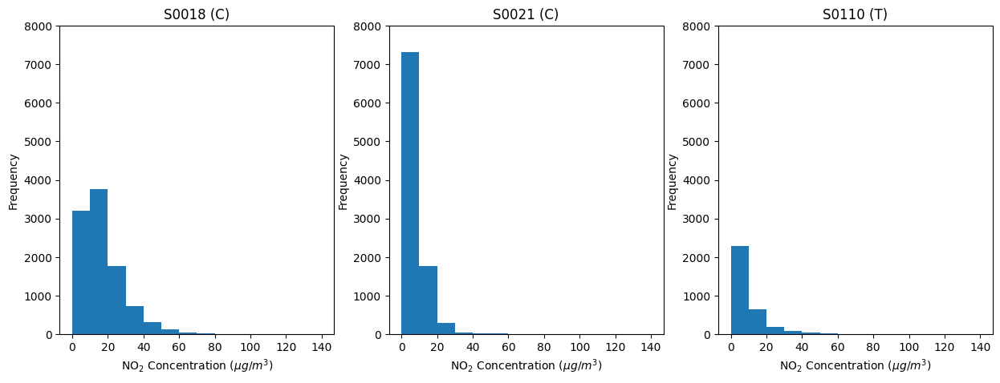

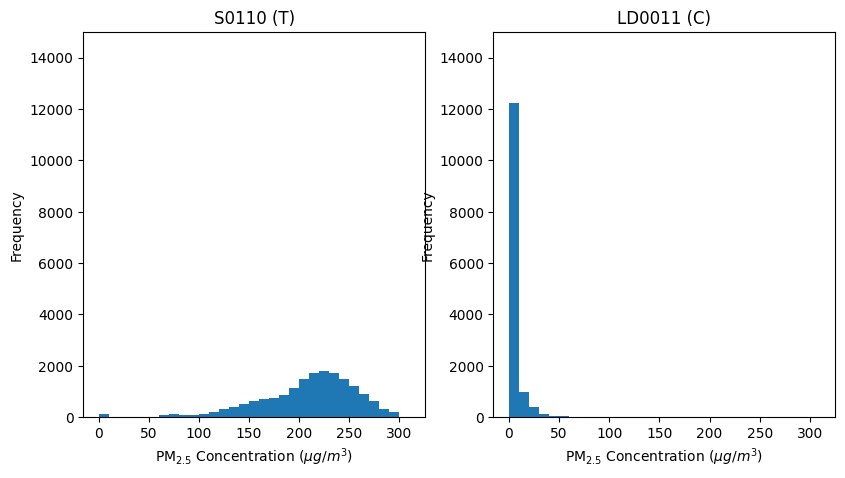

In [ ]:
#NO2
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  #1/3 for each histogram

plot_df = pd.read_pickle("G:/My Drive/03 Semester 3/SUFO Data/Pickles/" + "S0018" + "_20220201_20240601_NO2")
plot_df["NO2"] = plot_df["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
x_min = 0
x_max = 150
step = 10
ax1 = plt.subplot(gs[0])
ax1.hist(plot_df["NO2"],bins = np.arange(x_min,x_max,step))
ax1.set_ylim([0,8000])
ax1.set_title("S0018 (C)")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")

plot_df = pd.read_pickle("G:/My Drive/03 Semester 3/SUFO Data/Pickles/" + "S0021" + "_20220201_20240601_NO2")
plot_df["NO2"] = plot_df["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
ax2 = plt.subplot(gs[1])
ax2.hist(plot_df["NO2"],bins = np.arange(x_min,x_max,step))
ax2.set_ylim([0,8000])
ax2.set_title("S0021 (C)")
ax2.set_ylabel("Frequency")
ax2.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")

plot_df = pd.read_pickle("G:/My Drive/03 Semester 3/SUFO Data/Pickles/" + "S0110" + "_20220201_20240601_NO2")
plot_df["NO2"] = plot_df["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
ax3 = plt.subplot(gs[2])
ax3.hist(plot_df["NO2"],bins = np.arange(x_min,x_max,step))
ax3.set_ylim([0,8000])
ax3.set_title("S0110 (T)")
ax3.set_ylabel("Frequency")
ax3.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")

plt.show()

#PM25
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  #1/3 for each histogram

plot_df = pd.read_pickle("G:/My Drive/03 Semester 3/SUFO Data/Pickles/" + "S0110" + "_20220201_20240601_PM25")
plot_df["PM25"] = plot_df["PM25"].apply(lambda x: np.where(x < -1000,np.nan,x))

x_min = 0
x_max = 320
step = 10
ax1 = plt.subplot(gs[0])
ax1.hist(plot_df["PM25"],bins = np.arange(x_min,x_max,step))
ax1.set_ylim([0,15000])
ax1.set_title("S0110 (T)")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")

plot_df = pd.read_pickle("G:/My Drive/03 Semester 3/SUFO Data/Pickles/" + "LD0011" + "_20220201_20240601_PM25")
plot_df["PM25"] = plot_df["PM25"].apply(lambda x: np.where(x < -1000,np.nan,x))
ax2 = plt.subplot(gs[1])
ax2.hist(plot_df["PM25"],bins = np.arange(x_min,x_max,step))
ax2.set_ylim([0,15000])
ax2.set_title("LD0011 (C)")
ax2.set_ylabel("Frequency")
ax2.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")


plt.show()

## Mean Daily Concentration Plots

To be used in the report, plots of the concentrations.

### Non-Normalised

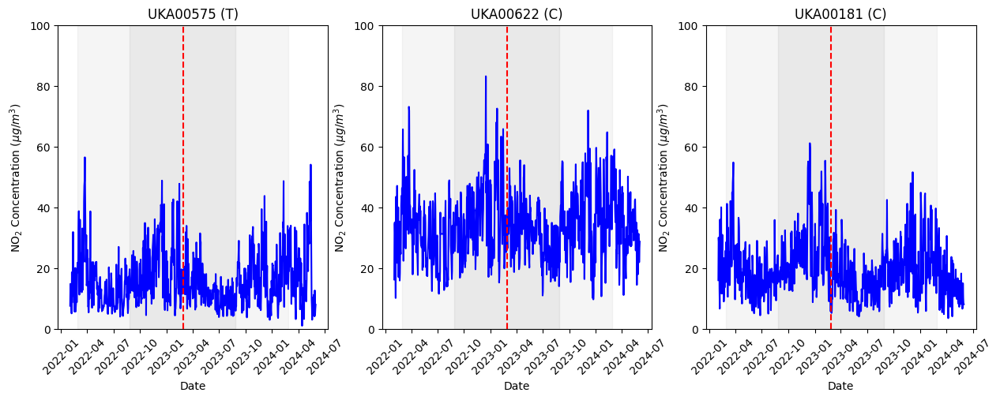

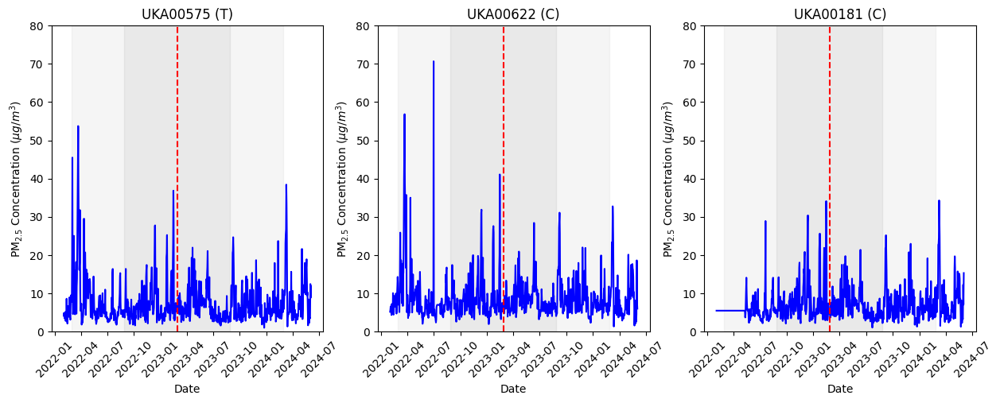

In [ ]:
#NO2
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  # 2/3 for the line plot, 1/3 for the histogram

# NO2 plot
ax1 = plt.subplot(gs[0])
ax1.plot(UKA00575_NO2_pre_norm_daily["date"],UKA00575_NO2_pre_norm_daily["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

ymax = 100

#Now add a vertical line and shading
ax1.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax1.set_title("UKA00575 (T)")
ax1.set_xlabel("Date")
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,ymax])

#Next site
ax2 = plt.subplot(gs[1])
ax2.plot(UKA00622_NO2_pre_norm_daily["date"],UKA00622_NO2_pre_norm_daily["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)


#Now add a vertical line and shading
ax2.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax2.set_title("UKA00622 (C)")
ax2.set_xlabel("Date")
ax2.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,ymax])

#Next site
ax3 = plt.subplot(gs[2])
ax3.plot(UKA00181_NO2_pre_norm_daily["date"],UKA00181_NO2_pre_norm_daily["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax3.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax3.set_title("UKA00181 (C)")
ax3.set_xlabel("Date")
ax3.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,ymax])
plt.show()

#PM25
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1,1])  # 2/3 for the line plot, 1/3 for the histogram
ymax = 80

ax1 = plt.subplot(gs[0])
ax1.plot(UKA00575_PM25_pre_norm_daily["date"],UKA00575_PM25_pre_norm_daily["PM25"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax1.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax1.set_title("UKA00575 (T)")
ax1.set_xlabel("Date")
ax1.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,ymax])
#PM25 PLot
ax2 = plt.subplot(gs[1])
ax2.plot(UKA00622_PM25_pre_norm_daily["date"],UKA00622_PM25_pre_norm_daily["PM25"], color = "blue")

# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax2.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax2.set_title("UKA00622 (C)")
ax2.set_xlabel("Date")
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,ymax])

#Tinsley
#PM25 PLot
ax3 = plt.subplot(gs[2])
ax3.plot(UKA00181_PM25_pre_norm_daily["date"],UKA00181_PM25_pre_norm_daily["PM25"], color = "blue")

# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax3.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax3.set_title("UKA00181 (C)")
ax3.set_xlabel("Date")
ax3.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,ymax])
plt.show()

Now for the secondary sites

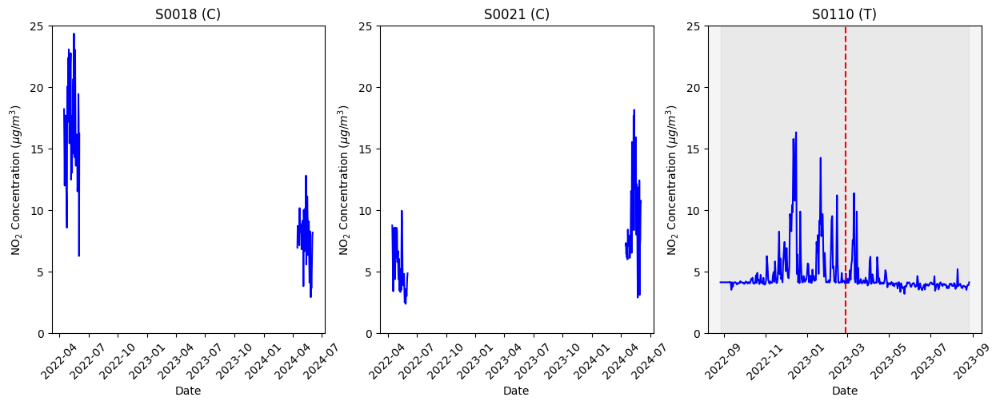

(0.0, 300.0)

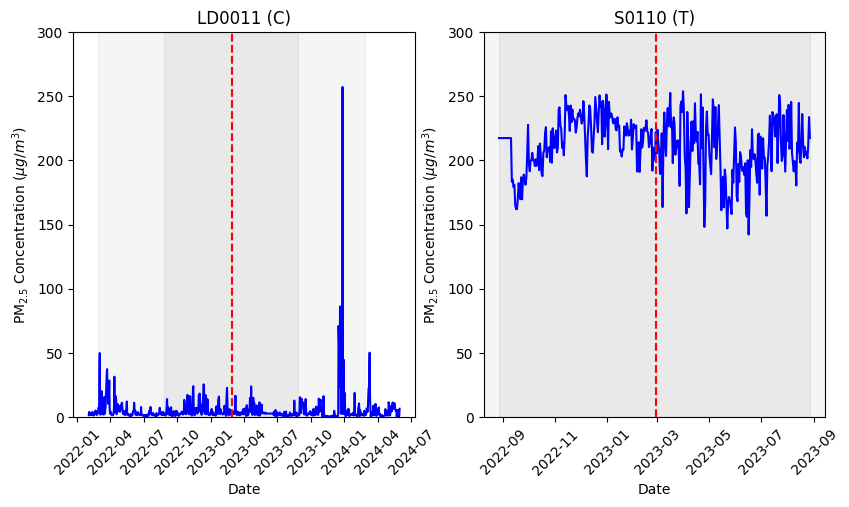

In [ ]:


#NO2
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  # 2/3 for the line plot, 1/3 for the histogram
ymax = 25

# NO2 plot
ax1 = plt.subplot(gs[0])
ax1.plot(S0018_pre_daily_filt["date"],S0018_pre_daily_filt["NO2"], color = "blue")
ax1.plot(S0018_post_daily_filt["date"],S0018_post_daily_filt["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)



# Adding titles and labels for the line plot
ax1.set_title("S0018 (C)")
ax1.set_xlabel("Date")
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,ymax])

#Next site
ax2 = plt.subplot(gs[1])
ax2.plot(S0021_pre_daily_filt["date"],S0021_pre_daily_filt["NO2"], color = "blue")
ax2.plot(S0021_post_daily_filt["date"],S0021_post_daily_filt["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

# Adding titles and labels for the line plot
ax2.set_title("S0021 (C)")
ax2.set_xlabel("Date")
ax2.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,ymax])

#Next site
ax3 = plt.subplot(gs[2])
ax3.plot(S0110_NO2_daily["date"],S0110_NO2_daily["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax3.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax3.set_title("S0110 (T)")
ax3.set_xlabel("Date")
ax3.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,ymax])
plt.show()

#PM25
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  # 2/3 for the line plot, 1/3 for the histogram
ymax = 300

ax1 = plt.subplot(gs[0])
ax1.plot(LD0011_PM25_daily["date"],LD0011_PM25_daily["PM25"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax1.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax1.set_title("LD0011 (C)")
ax1.set_xlabel("Date")
ax1.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,ymax])

#Next site
ax2 = plt.subplot(gs[1])
ax2.plot(S0110_PM25_daily["date"],S0110_PM25_daily["PM25"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax2.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax2.set_title("S0110 (T)")
ax2.set_xlabel("Date")
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,ymax])




### Normalised

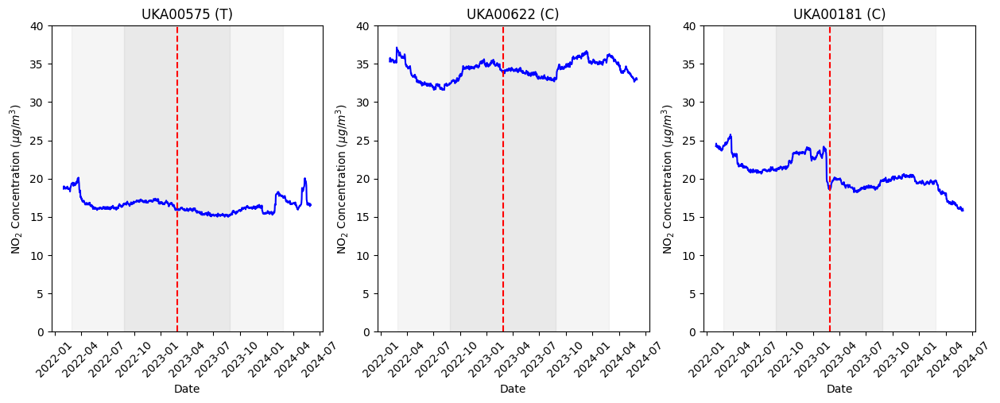

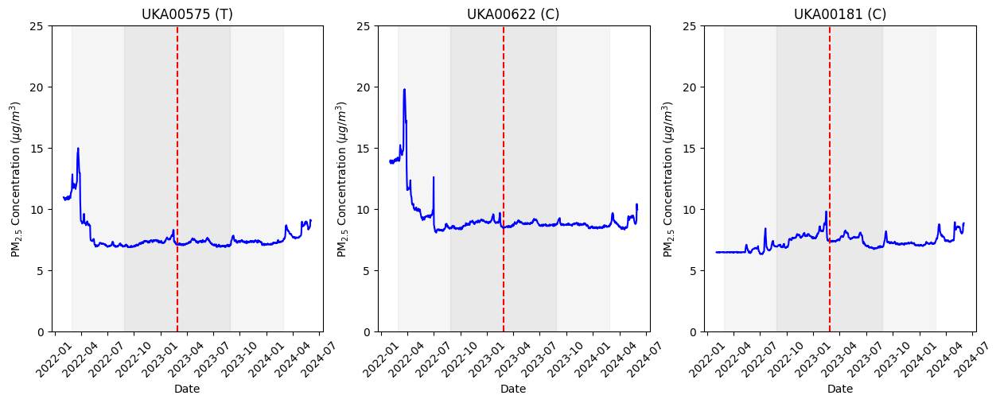

In [ ]:
#NO2
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])  # 2/3 for the line plot, 1/3 for the histogram
ymax = 40

# NO2 plot
ax1 = plt.subplot(gs[0])
ax1.plot(UKA00575_NO2_post_norm["date"],UKA00575_NO2_post_norm["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax1.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax1.set_title("UKA00575 (T)")
ax1.set_xlabel("Date")
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,ymax])

#Next site
ax2 = plt.subplot(gs[1])
ax2.plot(UKA00622_NO2_post_norm["date"],UKA00622_NO2_post_norm["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax2.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax2.set_title("UKA00622 (C)")
ax2.set_xlabel("Date")
ax2.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,ymax])

#Next site
ax3 = plt.subplot(gs[2])
ax3.plot(UKA00181_NO2_post_norm["date"],UKA00181_NO2_post_norm["NO2"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax3.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax3.set_title("UKA00181 (C)")
ax3.set_xlabel("Date")
ax3.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,ymax])
plt.show()

#PM25
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1,1])  # 2/3 for the line plot, 1/3 for the histogram
ymax = 25

ax1 = plt.subplot(gs[0])
ax1.plot(UKA00575_PM25_post_norm["date"],UKA00575_PM25_post_norm["PM25"], color = "blue")
# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax1.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax1.set_title("UKA00575 (T)")
ax1.set_xlabel("Date")
ax1.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,ymax])
#PM25 PLot
ax2 = plt.subplot(gs[1])
ax2.plot(UKA00622_PM25_post_norm["date"],UKA00622_PM25_post_norm["PM25"], color = "blue")

# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax2.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax2.set_title("UKA00622 (C)")
ax2.set_xlabel("Date")
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,ymax])

#Tinsley
#PM25 PLot
ax3 = plt.subplot(gs[2])
ax3.plot(UKA00181_PM25_post_norm["date"],UKA00181_PM25_post_norm["PM25"], color = "blue")

# Rotate the date labels for better readability
plt.xticks(rotation=45)

#Now add a vertical line and shading
ax3.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')

# Adding titles and labels for the line plot
ax3.set_title("UKA00181 (C)")
ax3.set_xlabel("Date")
ax3.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,ymax])
plt.show()

# 02 AQ Changes

In this section we'll develop the descriptive statistics for the AQ and calculate the changes in air pollution.

## Descriptive Statistics

### Primary Sites

First up is the three DEFRA sites, let's do descriptives for both normalised and non-normalised data.

In [ ]:
CAZ_date = datetime.datetime(2023,2,27)
DEFRA_sites = ["UKA00575","UKA00622","UKA00181"]
DEFRA_names = ["UKA00575_PM25_pre_norm_daily","UKA00622_PM25_pre_norm_daily","UKA00181_PM25_pre_norm_daily","UKA00575_NO2_pre_norm_daily","UKA00622_NO2_pre_norm_daily","UKA00181_NO2_pre_norm_daily",
               "UKA00575_PM25_post_norm","UKA00622_PM25_post_norm","UKA00181_PM25_post_norm","UKA00575_NO2_post_norm","UKA00622_NO2_post_norm","UKA00181_NO2_post_norm"]

descriptive_stats = {}

def calc_desc(df_name,pollutant):
    df = globals()[df_name]

    df_pre = df[(df["date"]>=CAZ_date - pd.DateOffset(years =1)) & (df["date"]< CAZ_date)]
    df_post = df[(df["date"]>=CAZ_date) & (df["date"]< CAZ_date + pd.DateOffset(years =1)) ]

    pre_stats = df_pre[pollutant].describe()
    pre_stats['variance'] = df_pre[pollutant].var()
    pre_stats['skewness'] = df_pre[pollutant].skew()
    pre_stats['kurtosis'] = df_pre[pollutant].kurt()
    pre_stats['range'] = df_pre[pollutant].max() - df_pre[pollutant].min()
    pre_stats['iqr'] = df_pre[pollutant].quantile(0.75) - df_pre[pollutant].quantile(0.25)

    post_stats = df_post[pollutant].describe()
    post_stats['variance'] = df_post[pollutant].var()
    post_stats['skewness'] = df_post[pollutant].skew()
    post_stats['kurtosis'] = df_post[pollutant].kurt()
    post_stats['range'] = df_post[pollutant].max() - df_post[pollutant].min()
    post_stats['iqr'] = df_post[pollutant].quantile(0.75) - df_post[pollutant].quantile(0.25)

    stats_df = pd.DataFrame(list(pre_stats.items()), columns=['Statistic', 'Pre'])
    stats_df["Post"] = list(post_stats.values)
    return stats_df

for s_name in DEFRA_names:
    descriptive_stats[s_name] = calc_desc(s_name,s_name.split("_")[1])


Now we will make boxplots for these descriptives

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3280836255.py:14: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax1.boxplot(no2_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3280836255.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax2.boxplot(pm25_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],


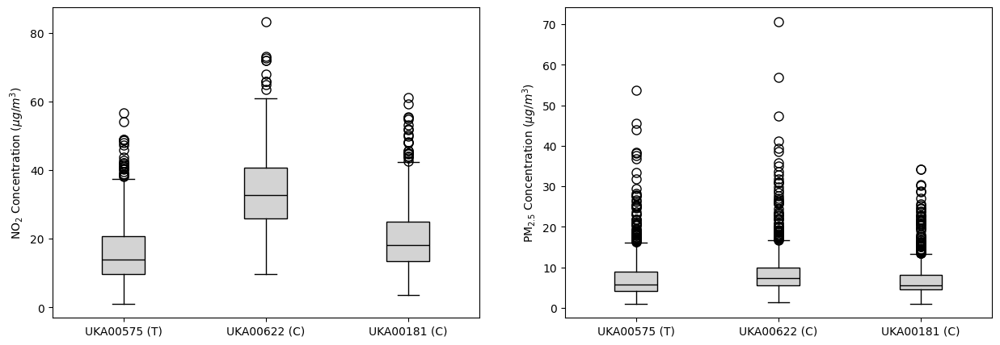

In [ ]:
# Extract NO2 values
DEFRA_NO2 = [UKA00575_NO2_pre_norm_daily,UKA00622_NO2_pre_norm_daily,UKA00181_NO2_pre_norm_daily]
DEFRA_PM25 = [UKA00575_PM25_pre_norm_daily,UKA00622_PM25_pre_norm_daily,UKA00181_PM25_pre_norm_daily]
no2_values = [df['NO2'] for df in DEFRA_NO2]
pm25_values = [df['PM25'] for df in DEFRA_PM25]


# Plotting
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,2, width_ratios=[1, 1])

#NO2
ax1 = plt.subplot(gs[0])
box = ax1.boxplot(no2_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],
                  flierprops=dict(marker='o', color='red', markersize=8))

# Customize the boxplot
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(box[element], color='black')

for box_patch in box['boxes']:
    box_patch.set(facecolor='#D3D3D3')

# Set the y-label
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")

#PM25
ax2 = plt.subplot(gs[1])
box = ax2.boxplot(pm25_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],
                  flierprops=dict(marker='o', color='red', markersize=8))

# Customize the boxplot
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(box[element], color='black')

for box_patch in box['boxes']:
    box_patch.set(facecolor='#D3D3D3')

# Set the y-label
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")

plt.show()

That was all the non-normalised next is the normalised

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\576242917.py:14: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax1.boxplot(no2_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\576242917.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax2.boxplot(pm25_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],


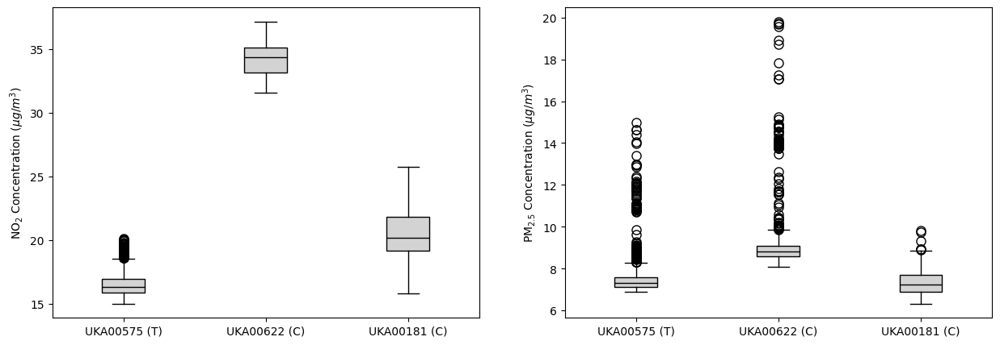

In [ ]:
# Extract NO2 values
DEFRA_NO2 = [UKA00575_NO2_post_norm,UKA00622_NO2_post_norm,UKA00181_NO2_post_norm]
DEFRA_PM25 = [UKA00575_PM25_post_norm,UKA00622_PM25_post_norm,UKA00181_PM25_post_norm]
no2_values = [df['NO2'] for df in DEFRA_NO2]
pm25_values = [df['PM25'] for df in DEFRA_PM25]


# Plotting
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,2, width_ratios=[1, 1])

#NO2
ax1 = plt.subplot(gs[0])
box = ax1.boxplot(no2_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],
                  flierprops=dict(marker='o', color='red', markersize=8))

# Customize the boxplot
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(box[element], color='black')

for box_patch in box['boxes']:
    box_patch.set(facecolor='#D3D3D3')

# Set the y-label
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")

#PM25
ax2 = plt.subplot(gs[1])
box = ax2.boxplot(pm25_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],
                  flierprops=dict(marker='o', color='red', markersize=8))

# Customize the boxplot
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(box[element], color='black')

for box_patch in box['boxes']:
    box_patch.set(facecolor='#D3D3D3')

# Set the y-label
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")

plt.show()

A little later we'll save the descriptive statistics to an Excel file, makes it easier to import into the report.

### Secondary Sites

In [ ]:
def calc_desc_sep(df_pre,df_post,pollutant):

    pre_stats = df_pre[pollutant].describe()
    pre_stats['variance'] = df_pre[pollutant].var()
    pre_stats['skewness'] = df_pre[pollutant].skew()
    pre_stats['kurtosis'] = df_pre[pollutant].kurt()
    pre_stats['range'] = df_pre[pollutant].max() - df_pre[pollutant].min()
    pre_stats['iqr'] = df_pre[pollutant].quantile(0.75) - df_pre[pollutant].quantile(0.25)

    post_stats = df_post[pollutant].describe()
    post_stats['variance'] = df_post[pollutant].var()
    post_stats['skewness'] = df_post[pollutant].skew()
    post_stats['kurtosis'] = df_post[pollutant].kurt()
    post_stats['range'] = df_post[pollutant].max() - df_post[pollutant].min()
    post_stats['iqr'] = df_post[pollutant].quantile(0.75) - df_post[pollutant].quantile(0.25)

    stats_df = pd.DataFrame(list(pre_stats.items()), columns=['Statistic', 'Pre'])
    stats_df["Post"] = list(post_stats.values)
    return stats_df

#S0021 NO2
descriptive_stats["S0021_NO2"] = calc_desc_sep(S0021_pre_daily_filt,S0021_post_daily_filt,"NO2")

#S0018 NO2
descriptive_stats["S0018_NO2"] = calc_desc_sep(S0018_pre_daily_filt,S0018_post_daily_filt,"NO2")

#LD0011 PM25
descriptive_stats["LD0011_PM25"] = calc_desc("LD0011_PM25_daily","PM25")

#S0110 NO2
descriptive_stats["S0110_NO2"] = calc_desc("S0110_NO2_daily","NO2")

#S0110 PM25
descriptive_stats["S0110_PM25"] = calc_desc("S0110_PM25_daily","PM25")


Now for the boxplots for these, first NO2

Now PM25

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1170340249.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax1.boxplot(no2_values, patch_artist=True, labels=["S0018 (C)", "S0021 (C)", "S0110 (T)"],
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1170340249.py:32: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax2.boxplot(pm25_values, patch_artist=True, labels=["LD0011 (C)", "S0110 (T)"],


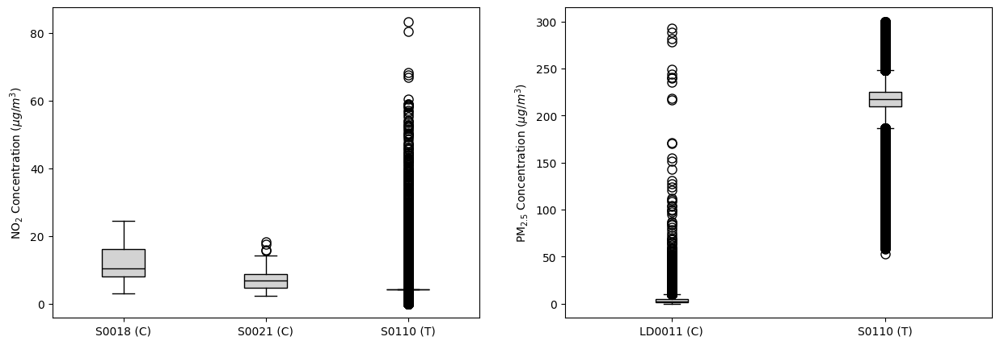

In [ ]:
# Extract NO2 values
S0018_NO2 = pd.concat([S0018_pre_daily_filt,S0018_post_daily_filt])
S0021_NO2 = pd.concat([S0021_pre_daily_filt,S0021_post_daily_filt])

sec_NO2 = [S0018_NO2,S0021_NO2,S0110_NO2]
sec_PM25 = [LD0011_PM25,S0110_PM25]
no2_values = [df['NO2'] for df in sec_NO2]
pm25_values = [df['PM25'] for df in sec_PM25]


# Plotting
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,2, width_ratios=[1, 1])

#NO2
ax1 = plt.subplot(gs[0])
box = ax1.boxplot(no2_values, patch_artist=True, labels=["S0018 (C)", "S0021 (C)", "S0110 (T)"],
                  flierprops=dict(marker='o', color='red', markersize=8))

# Customize the boxplot
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(box[element], color='black')

for box_patch in box['boxes']:
    box_patch.set(facecolor='#D3D3D3')

# Set the y-label
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")

#PM25
ax2 = plt.subplot(gs[1])
box = ax2.boxplot(pm25_values, patch_artist=True, labels=["LD0011 (C)", "S0110 (T)"],
                  flierprops=dict(marker='o', color='red', markersize=8))

# Customize the boxplot
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(box[element], color='black')

for box_patch in box['boxes']:
    box_patch.set(facecolor='#D3D3D3')

# Set the y-label
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")

plt.show()

### Saving Files

We'll give each DF its own sheet in an Excel file and save to Excel. This will make copying stats into Word a lot easier.

In [ ]:
#  Now save these stats to an excel file to make it easier to get them into word
file_path = folder_path + "/Data/AQ_Descriptives.xlsx"

# Create a new Excel writer object
with pd.ExcelWriter(file_path) as writer:
    # Iterate over the dictionary
    for sheet_name, df in descriptive_stats.items():
        # Write each DataFrame to a separate sheet named after the key
        df.to_excel(writer, sheet_name=sheet_name, index=False)


## Histograms

We'll plot some histograms showing the change in AQ before and after. When we filter and create new DFs

In [ ]:
for s_name in DEFRA_names:
    globals()[s_name]["caz_time"] = globals()[s_name]["date"].apply(lambda x: "post" if x >= CAZ_date else "pre")

    #Create a new pre DF
    df_name = s_name + "_pre"
    pre_df = globals()[s_name][globals()[s_name]["caz_time"] == "pre"]
    globals()[df_name] = pre_df

    #And a Post
    df_name = s_name + "_post"
    post_df = globals()[s_name][globals()[s_name]["caz_time"] == "post"]
    globals()[df_name] = post_df

### Primary Non-Normalised

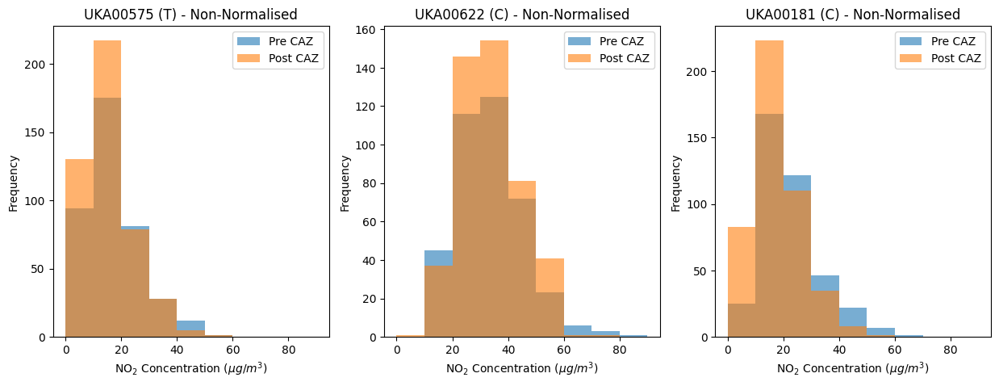

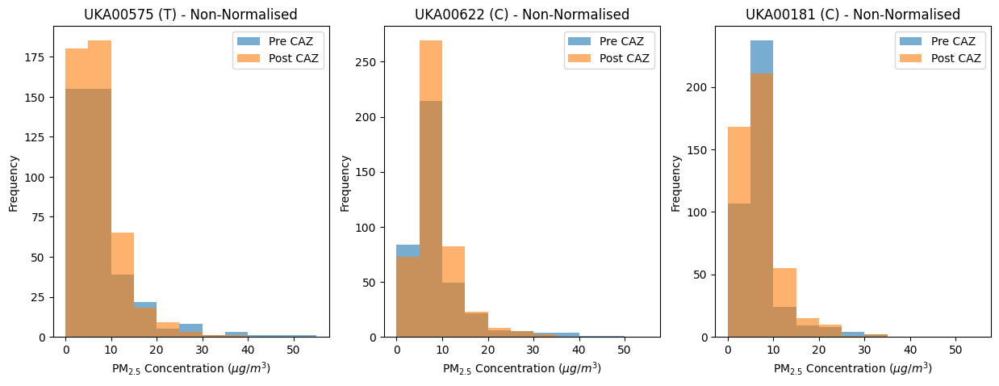

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

DEFRA_names_pre = [s + "_pre" for s in DEFRA_names]
DEFRA_names_post = [s + "_post" for s in DEFRA_names]


fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])

xmax = 100
xmin = 0
step = 10

ax1 = plt.subplot(gs[0])
ax1.hist(UKA00575_NO2_pre_norm_daily_pre["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.hist(UKA00575_NO2_pre_norm_daily_post["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.legend(labels = ["Pre CAZ","Post CAZ"])
ax1.set_ylabel("Frequency")
ax1.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_title("UKA00575 (T) - Non-Normalised")

ax2 = plt.subplot(gs[1])
ax2.hist(UKA00622_NO2_pre_norm_daily_pre["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.hist(UKA00622_NO2_pre_norm_daily_post["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.legend(labels = ["Pre CAZ","Post CAZ"])
ax2.set_ylabel("Frequency")
ax2.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_title("UKA00622 (C) - Non-Normalised")

ax3 = plt.subplot(gs[2])
ax3.hist(UKA00181_NO2_pre_norm_daily_pre["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.hist(UKA00181_NO2_pre_norm_daily_post["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.legend(labels = ["Pre CAZ","Post CAZ"])
ax3.set_ylabel("Frequency")
ax3.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_title("UKA00181 (C) - Non-Normalised")

plt.show()

#Pm25

fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])

xmax = 60
xmin = 0
step = 5

ax1 = plt.subplot(gs[0])
ax1.hist(UKA00575_PM25_pre_norm_daily_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.hist(UKA00575_PM25_pre_norm_daily_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.legend(labels = ["Pre CAZ","Post CAZ"])
ax1.set_ylabel("Frequency")
ax1.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_title("UKA00575 (T) - Non-Normalised")

ax2 = plt.subplot(gs[1])
ax2.hist(UKA00622_PM25_pre_norm_daily_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.hist(UKA00622_PM25_pre_norm_daily_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.legend(labels = ["Pre CAZ","Post CAZ"])
ax2.set_ylabel("Frequency")
ax2.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_title("UKA00622 (C) - Non-Normalised")

ax3 = plt.subplot(gs[2])
ax3.hist(UKA00181_PM25_pre_norm_daily_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.hist(UKA00181_PM25_pre_norm_daily_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.legend(labels = ["Pre CAZ","Post CAZ"])
ax3.set_ylabel("Frequency")
ax3.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax3.set_title("UKA00181 (C) - Non-Normalised")

plt.show()

### Primary Normalised


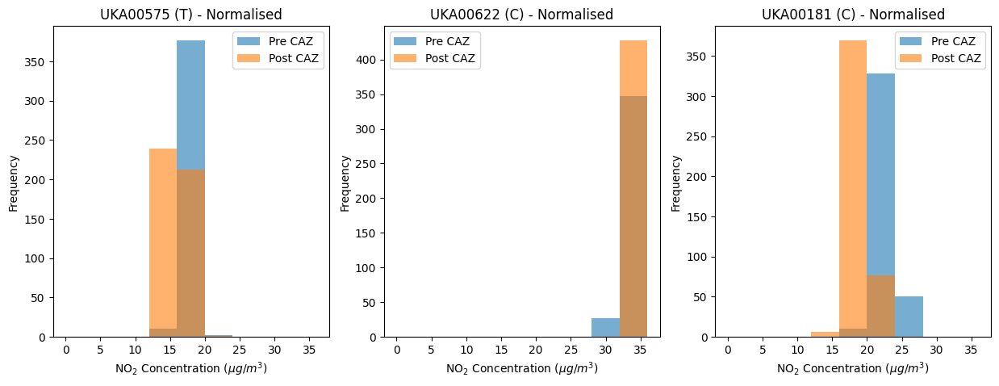

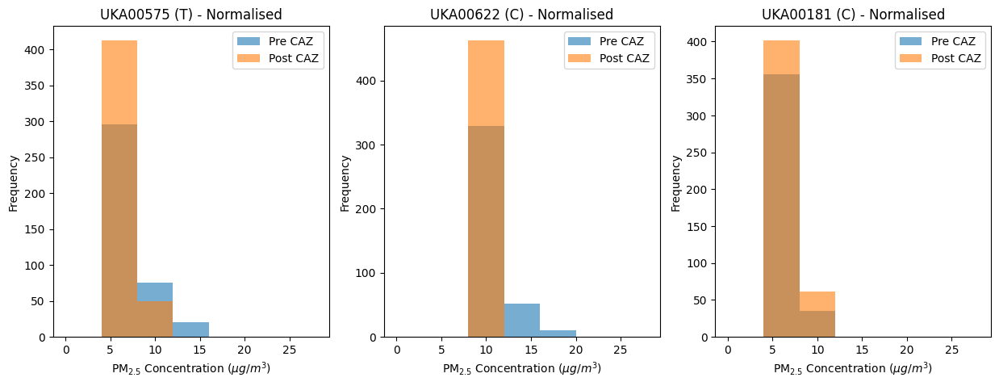

In [ ]:
DEFRA_names_pre = [s + "_pre" for s in DEFRA_names]
DEFRA_names_post = [s + "_post" for s in DEFRA_names]


fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])

xmax = 40
xmin = 0
step = 4

ax1 = plt.subplot(gs[0])
ax1.hist(UKA00575_NO2_post_norm_pre["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.hist(UKA00575_NO2_post_norm_post["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.legend(labels = ["Pre CAZ","Post CAZ"])
ax1.set_ylabel("Frequency")
ax1.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_title("UKA00575 (T) - Normalised")

ax2 = plt.subplot(gs[1])
ax2.hist(UKA00622_NO2_post_norm_pre["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.hist(UKA00622_NO2_post_norm_post["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.legend(labels = ["Pre CAZ","Post CAZ"])
ax2.set_ylabel("Frequency")
ax2.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_title("UKA00622 (C) - Normalised")

ax3 = plt.subplot(gs[2])
ax3.hist(UKA00181_NO2_post_norm_pre["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.hist(UKA00181_NO2_post_norm_post["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.legend(labels = ["Pre CAZ","Post CAZ"])
ax3.set_ylabel("Frequency")
ax3.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_title("UKA00181 (C) - Normalised")

plt.show()

#Pm25

fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])

xmax = 30
xmin = 0
step = 4

ax1 = plt.subplot(gs[0])
ax1.hist(UKA00575_PM25_post_norm_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.hist(UKA00575_PM25_post_norm_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.legend(labels = ["Pre CAZ","Post CAZ"])
ax1.set_ylabel("Frequency")
ax1.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_title("UKA00575 (T) - Normalised")

ax2 = plt.subplot(gs[1])
ax2.hist(UKA00622_PM25_post_norm_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.hist(UKA00622_PM25_post_norm_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.legend(labels = ["Pre CAZ","Post CAZ"])
ax2.set_ylabel("Frequency")
ax2.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_title("UKA00622 (C) - Normalised")

ax3 = plt.subplot(gs[2])
ax3.hist(UKA00181_PM25_post_norm_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.hist(UKA00181_PM25_post_norm_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.legend(labels = ["Pre CAZ","Post CAZ"])
ax3.set_ylabel("Frequency")
ax3.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax3.set_title("UKA00181 (C) - Normalised")

plt.show()


### Secondary Sites

#### NO2

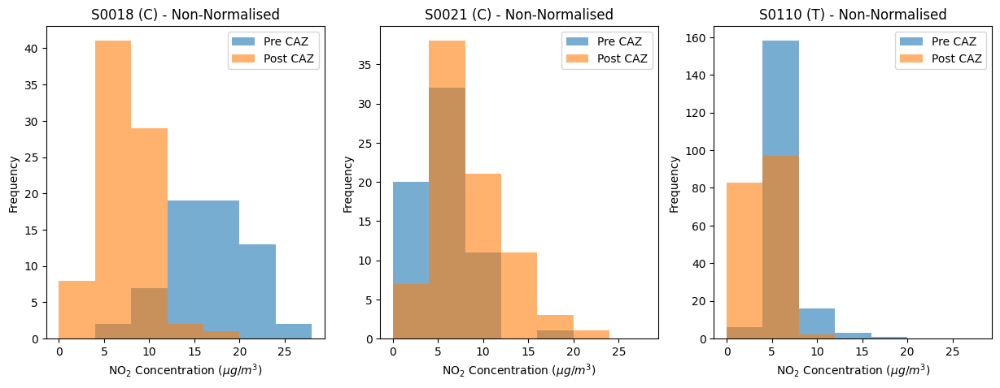

In [ ]:
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])

#Add caz label
S0110_NO2_daily["caz_time"] = S0110_NO2_daily["date"].apply(lambda x: "post" if x >= CAZ_date else "pre")

S0110_NO2_pre = S0110_NO2_daily[S0110_NO2_daily["caz_time"] == "pre"]
S0110_NO2_post = S0110_NO2_daily[S0110_NO2_daily["caz_time"] == "post"]

xmax = 30
xmin = 0
step = 4

ax1 = plt.subplot(gs[0])
ax1.hist(S0018_pre_daily["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.hist(S0018_post_daily["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.legend(labels = ["Pre CAZ","Post CAZ"])
ax1.set_ylabel("Frequency")
ax1.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_title("S0018 (C) - Non-Normalised")

ax2 = plt.subplot(gs[1])
ax2.hist(S0021_pre_daily["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.hist(S0021_post_daily["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.legend(labels = ["Pre CAZ","Post CAZ"])
ax2.set_ylabel("Frequency")
ax2.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_title("S0021 (C) - Non-Normalised")

ax3 = plt.subplot(gs[2])
ax3.hist(S0110_NO2_pre["NO2"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.hist(S0110_NO2_post["NO2"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax3.legend(labels = ["Pre CAZ","Post CAZ"])
ax3.set_ylabel("Frequency")
ax3.set_xlabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_title("S0110 (T) - Non-Normalised")


plt.show()


#### PM25

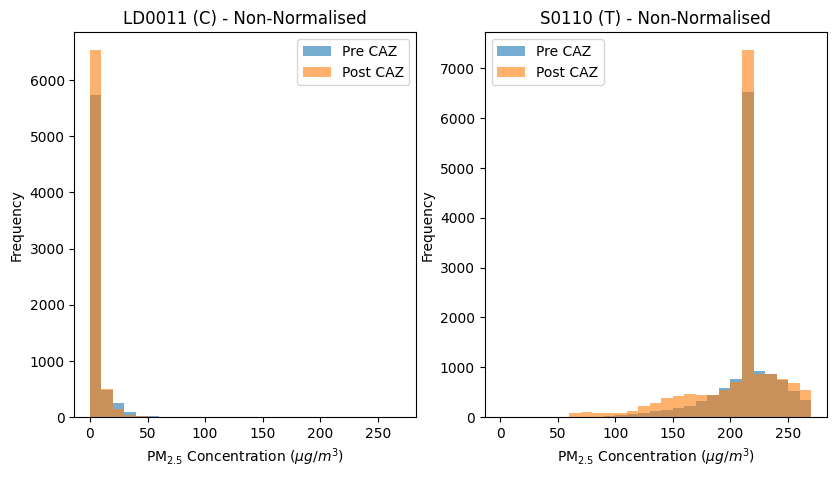

In [ ]:
#LD0011
LD0011_PM25["caz_time"] = LD0011_PM25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre")

#Filter them
LD0011_PM25_pre = LD0011_PM25[LD0011_PM25["caz_time"] == "pre"]
LD0011_PM25_post = LD0011_PM25[LD0011_PM25["caz_time"] == "post"]


#S0110

S0110_PM25["caz_time"] = S0110_PM25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre")

#Filter them
S0110_PM25_pre = S0110_PM25[S0110_PM25["caz_time"] == "pre"]
S0110_PM25_post = S0110_PM25[S0110_PM25["caz_time"] == "post"]

#Now plot a histogram
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,3, width_ratios=[1, 1,1])


xmax = 280
xmin = 0
step = 10

ax1 = plt.subplot(gs[0])
ax1.hist(LD0011_PM25_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.hist(LD0011_PM25_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax1.legend(labels = ["Pre CAZ","Post CAZ"])
ax1.set_ylabel("Frequency")
ax1.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_title("LD0011 (C) - Non-Normalised")

ax2 = plt.subplot(gs[1])
ax2.hist(S0110_PM25_pre["PM25"], bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.hist(S0110_PM25_post["PM25"],bins = np.arange(xmin,xmax,step), alpha  = 0.6)
ax2.legend(labels = ["Pre CAZ","Post CAZ"])
ax2.set_ylabel("Frequency")
ax2.set_xlabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_title("S0110 (T) - Non-Normalised")

plt.show()

## Changes in Daily Mean

The evaluation criteria is the annual mean daily pollutant concentration. We'll use this to compare the AQ before and after the CAZ. The mean was actually calcualted in the descriptives so we can load that.

### Primary Sites

In [ ]:

AQ_changes_list = []

for s_name in DEFRA_names:

    name_list = s_name.split("_")
    temp_df = descriptive_stats[s_name][descriptive_stats[s_name]["Statistic"] == "mean"]
    pre_value = temp_df["Pre"].values[0]
    post_value = temp_df["Post"].values[0]

    temp_list = [name_list[0],name_list[1],name_list[2],pre_value,post_value, (100*(post_value-pre_value)/pre_value)]
    AQ_changes_list.append(temp_list)

AQ_changes_df = pd.DataFrame(AQ_changes_list, columns = ["Site","Pollutant","Normalisation","Pre","Post","pct_change"])
AQ_changes_NO2 = AQ_changes_df[AQ_changes_df["Pollutant"] == "NO2"]
print(AQ_changes_NO2)

AQ_changes_PM25 = AQ_changes_df[AQ_changes_df["Pollutant"] == "PM25"]
print(AQ_changes_PM25)

        Site Pollutant Normalisation        Pre       Post  pct_change
3   UKA00575       NO2           pre  17.256212  14.871823  -13.817572
4   UKA00622       NO2           pre  34.202886  33.749864   -1.324512
5   UKA00181       NO2           pre  22.603842  18.881549  -16.467525
9   UKA00575       NO2          post  16.873251  15.853439   -6.043958
10  UKA00622       NO2          post  33.764903  34.485599    2.134454
11  UKA00181       NO2          post  22.277397  19.455051  -12.669102
       Site Pollutant Normalisation       Pre      Post  pct_change
0  UKA00575      PM25           pre  8.017452  6.874220  -14.259304
1  UKA00622      PM25           pre  9.328653  8.519635   -8.672402
2  UKA00181      PM25           pre  6.946463  6.912448   -0.489680
6  UKA00575      PM25          post  7.848377  7.261509   -7.477573
7  UKA00622      PM25          post  9.684710  8.730152   -9.856342
8  UKA00181      PM25          post  7.186033  7.304889    1.653989


Next we can visualise the mean

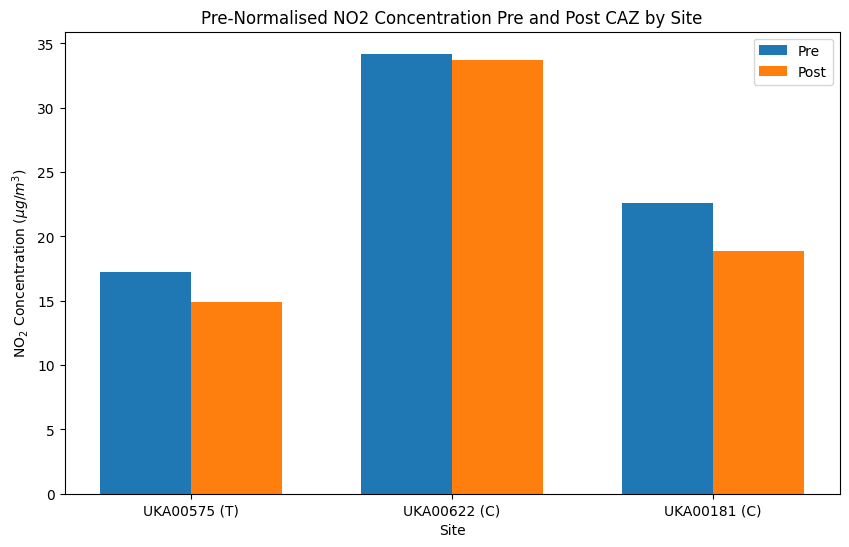

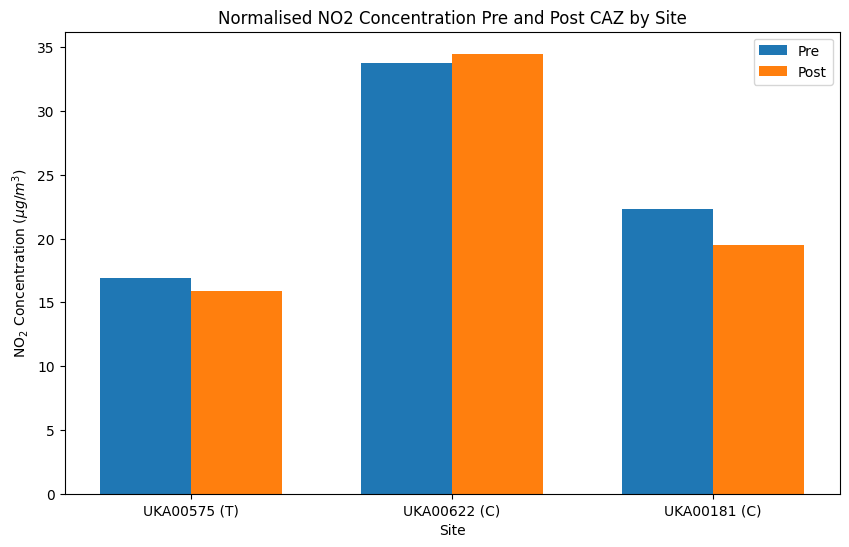

In [ ]:
#Do non-normalised first
plot_df = AQ_changes_NO2[AQ_changes_NO2["Normalisation"] == "pre"]
# Set the sites as index to ease plotting
plot_df.set_index('Site', inplace=True)

# Create a clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# The x locations for the groups
ind = np.arange(len(plot_df))
# The width of the bars
width = 0.35

#custom labels
custom_labels = ["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"]

# Plotting the bars
pre_bars = ax.bar(ind - width/2, plot_df['Pre'], width, label='Pre')
post_bars = ax.bar(ind + width/2, plot_df['Post'], width, label='Post')

# Adding labels, title and legend
ax.set_xlabel('Site')
ax.set_ylabel('NO$_2$ Concentration ($µg/m^3$)')
ax.set_title('Pre-Normalised NO2 Concentration Pre and Post CAZ by Site')
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)
ax.legend()

# Display the plot
plt.show()

#Now the normalised
plot_df = AQ_changes_NO2[AQ_changes_NO2["Normalisation"] == "post"]

# Set the sites as index to ease plotting
plot_df.set_index('Site', inplace=True)

# Create a clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# The x locations for the groups
ind = np.arange(len(plot_df))
# The width of the bars
width = 0.35

# Plotting the bars
pre_bars = ax.bar(ind - width/2, plot_df['Pre'], width, label='Pre')
post_bars = ax.bar(ind + width/2, plot_df['Post'], width, label='Post')

# Adding labels, title and legend
ax.set_xlabel('Site')
ax.set_ylabel('NO$_2$ Concentration ($µg/m^3$)')
ax.set_title('Normalised NO2 Concentration Pre and Post CAZ by Site')
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)
ax.legend()

# Display the plot
plt.show()

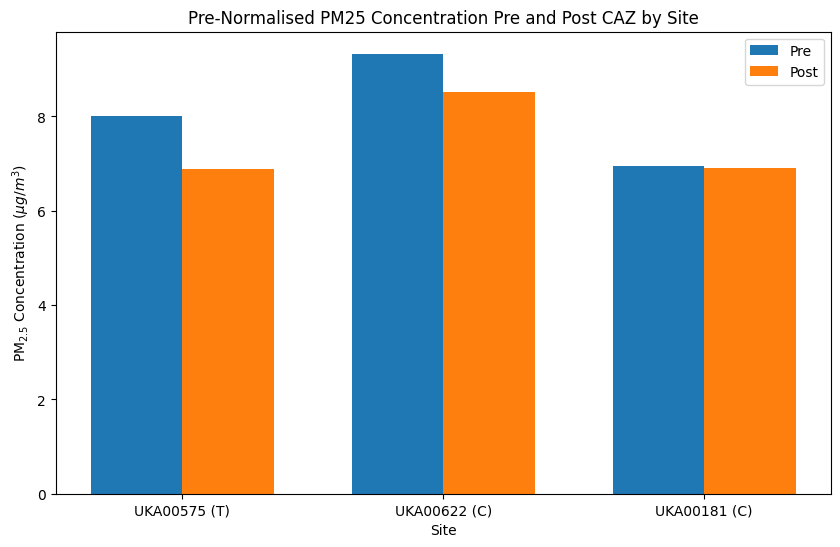

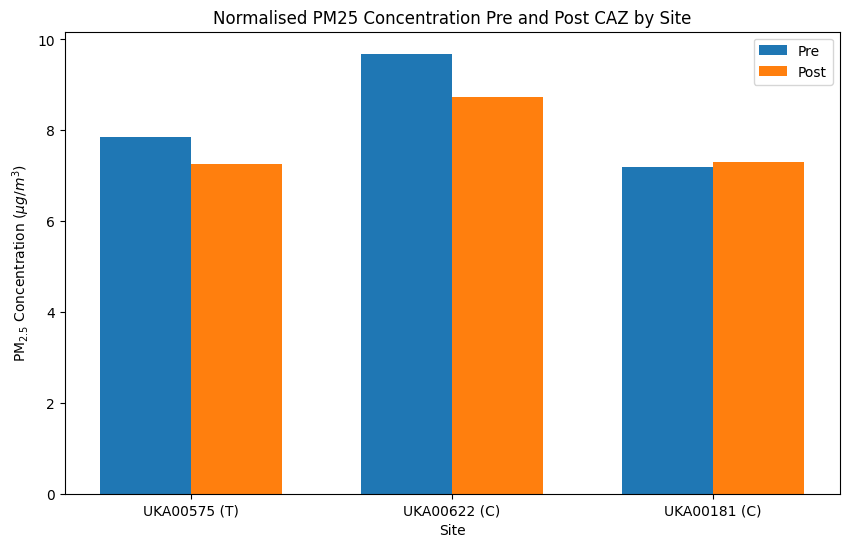

In [ ]:
plot_df = AQ_changes_PM25[AQ_changes_PM25["Normalisation"] == "pre"]

# Set the sites as index to ease plotting
plot_df.set_index('Site', inplace=True)

# Create a clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# The x locations for the groups
ind = np.arange(len(plot_df))
# The width of the bars
width = 0.35

# Plotting the bars
pre_bars = ax.bar(ind - width/2, plot_df['Pre'], width, label='Pre')
post_bars = ax.bar(ind + width/2, plot_df['Post'], width, label='Post')

# Adding labels, title and legend
ax.set_xlabel('Site')
ax.set_ylabel('PM$_{2.5}$ Concentration ($µg/m^3$)')
ax.set_title('Pre-Normalised PM25 Concentration Pre and Post CAZ by Site')
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)
ax.legend()

# Display the plot
plt.show()


#Now the normalised
plot_df = AQ_changes_PM25[AQ_changes_PM25["Normalisation"] == "post"]

# Set the sites as index to ease plotting
plot_df.set_index('Site', inplace=True)

# Create a clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# The x locations for the groups
ind = np.arange(len(plot_df))
# The width of the bars
width = 0.35

# Plotting the bars
pre_bars = ax.bar(ind - width/2, plot_df['Pre'], width, label='Pre')
post_bars = ax.bar(ind + width/2, plot_df['Post'], width, label='Post')

# Adding labels, title and legend
ax.set_xlabel('Site')
ax.set_ylabel('PM$_{2.5}$ Concentration ($µg/m^3$)')
ax.set_title('Normalised PM25 Concentration Pre and Post CAZ by Site')
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)
ax.legend()

# Display the plot
plt.show()



### Secondary Sites

We'll do the same calculation to the secondary sites


In [ ]:
#S0021
temp_df = descriptive_stats["S0021_NO2"][descriptive_stats["S0021_NO2"]["Statistic"] == "mean"]
pre_value = temp_df["Pre"].values[0]
post_value = temp_df["Post"].values[0]

temp_list = ["S0021","NO2","pre",pre_value,post_value, (100*(post_value-pre_value)/pre_value)]
AQ_changes_list.append(temp_list)

#S0018
temp_df = descriptive_stats["S0018_NO2"][descriptive_stats["S0018_NO2"]["Statistic"] == "mean"]
pre_value = temp_df["Pre"].values[0]
post_value = temp_df["Post"].values[0]

temp_list = ["S0018","NO2","pre",pre_value,post_value, (100*(post_value-pre_value)/pre_value)]
AQ_changes_list.append(temp_list)

#LD0011
temp_df = descriptive_stats["LD0011_PM25"][descriptive_stats["LD0011_PM25"]["Statistic"] == "mean"]
pre_value = temp_df["Pre"].values[0]
post_value = temp_df["Post"].values[0]

temp_list = ["LD0011","PM25","pre",pre_value,post_value, (100*(post_value-pre_value)/pre_value)]
AQ_changes_list.append(temp_list)

#S0110
temp_df = descriptive_stats["S0110_NO2"][descriptive_stats["S0110_NO2"]["Statistic"] == "mean"]
pre_value = temp_df["Pre"].values[0]
post_value = temp_df["Post"].values[0]

temp_list = ["S0110","NO2","pre",pre_value,post_value, (100*(post_value-pre_value)/pre_value)]
AQ_changes_list.append(temp_list)

temp_df = descriptive_stats["S0110_PM25"][descriptive_stats["S0110_PM25"]["Statistic"] == "mean"]
pre_value = temp_df["Pre"].values[0]
post_value = temp_df["Post"].values[0]

temp_list = ["S0110","PM25","pre",pre_value,post_value, (100*(post_value-pre_value)/pre_value)]
AQ_changes_list.append(temp_list)



AQ_changes_df = pd.DataFrame(AQ_changes_list, columns = ["Site","Pollutant","Normalisation","Pre","Post","pct_change"])


Now plot the changes in NO2

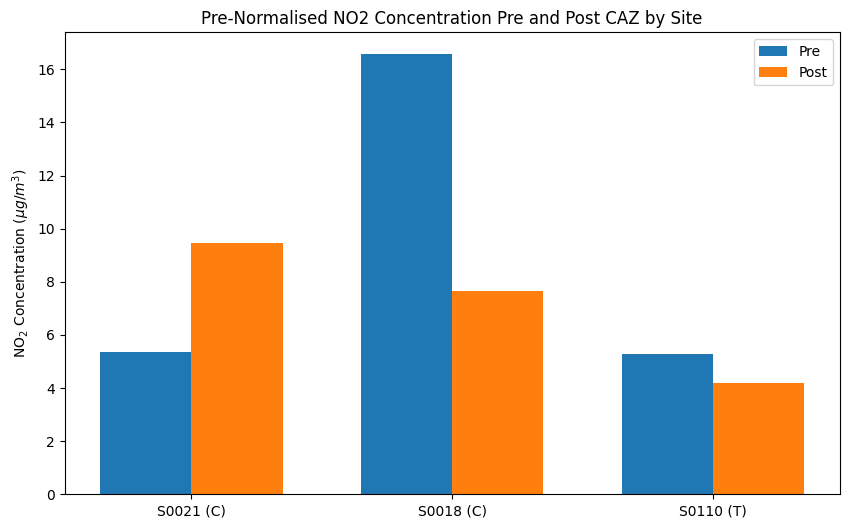

In [ ]:
plot_df = AQ_changes_df[(AQ_changes_df["Site"] == "S0021") | (AQ_changes_df["Site"] == "S0018") |(AQ_changes_df["Site"] == "S0110") & (AQ_changes_df["Pollutant"] == "NO2")]

# Set the sites as index to ease plotting
plot_df.set_index('Site', inplace=True)

# Create a clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# The x locations for the groups
ind = np.arange(len(plot_df))
# The width of the bars
width = 0.35

#Custom Labels
custom_labels = ["S0021 (C)", "S0018 (C)","S0110 (T)"]

# Plotting the bars
pre_bars = ax.bar(ind - width/2, plot_df['Pre'], width, label='Pre')
post_bars = ax.bar(ind + width/2, plot_df['Post'], width, label='Post')

# Adding labels, title and legend
ax.set_ylabel('NO$_2$ Concentration ($µg/m^3$)')
ax.set_title('Pre-Normalised NO2 Concentration Pre and Post CAZ by Site')
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)

ax.legend()

# Display the plot
plt.show()

And the changes in PM25

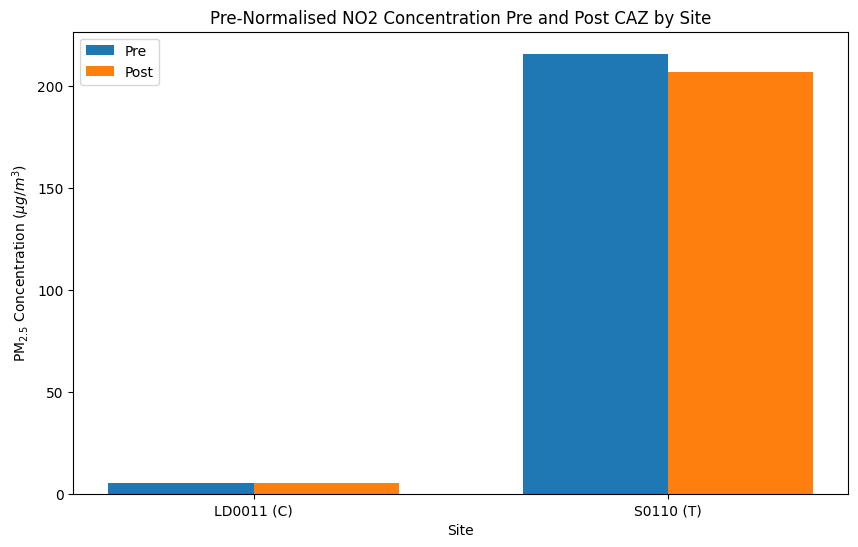

In [ ]:
plot_df = AQ_changes_df[(AQ_changes_df["Site"] == "LD0011") | (AQ_changes_df["Site"] == "S0110") & ((AQ_changes_df["Pollutant"] == "PM25"))]

# Set the sites as index to ease plotting
plot_df.set_index('Site', inplace=True)

# Create a clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# The x locations for the groaups
ind = np.arange(len(plot_df))
# The width of the bars
width = 0.35

#Custom labels
custom_labels = ["LD0011 (C)", "S0110 (T)"]

# Plotting the bars
pre_bars = ax.bar(ind - width/2, plot_df['Pre'], width, label='Pre')
post_bars = ax.bar(ind + width/2, plot_df['Post'], width, label='Post')

# Adding labels, title and legend
ax.set_xlabel('Site')
ax.set_ylabel('PM$_{2.5}$ Concentration ($µg/m^3$)')
ax.set_title('Pre-Normalised NO2 Concentration Pre and Post CAZ by Site')
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)
ax.legend()

# Display the plot
plt.show()

In [ ]:
AQ_changes_df[12:]

,Site,Pollutant,Normalisation,Pre,Post,pct_change
12,S0021,NO2,pre,5.360702,9.475902,76.766055
13,S0018,NO2,pre,16.563350,7.657243,-53.769965
14,LD0011,PM25,pre,5.308833,5.318658,0.185069
15,S0110,NO2,pre,5.265033,4.184911,-20.515010
16,S0110,PM25,pre,215.954688,207.181729,-4.062407


In [ ]:

S0021_pre_daily_filt["date"].max()

UKA00622_test_pre = UKA00622_NO2_pre_norm_daily[(UKA00622_NO2_pre_norm_daily["date"] >= S0021_pre_daily_filt["date"].min()) & (UKA00622_NO2_pre_norm_daily["date"] <= S0021_pre_daily_filt["date"].max())]["NO2"].mean()
UKA00622_test_post = UKA00622_NO2_pre_norm_daily[(UKA00622_NO2_pre_norm_daily["date"] >= S0021_post_daily_filt["date"].min()) & (UKA00622_NO2_pre_norm_daily["date"] <= S0021_post_daily_filt["date"].max())]["NO2"].mean()

UKA00622_test_pre, UKA00622_test_post, (100*(UKA00622_test_post - UKA00622_test_pre)/UKA00622_test_pre)

(30.487504642857143, 32.39809275510204, 6.266790721727783)

## Compliance to Requirements

This is another evaluation criteria, analysing the compliance of sites to legal requirements. The requirements are:

|Pollutant|Limit(s)                                                                |
|---------|------------------------------------------------------------------------|
| PM25    | - Mean annual concentration below 20 µg/m3                             |
| NO2     | - 200 µg/m3 not to be exceeded more than 18 times a year (1 hour mean) |
|         | - Mean annual concentration below 40 µg/m3                             |

### Mean Annual Daily Concentration

We've already calcualted the mean annual daily concentration so can assess that for all sites:


In [ ]:
NO2_exceed_df = AQ_changes_df[(AQ_changes_df["Pollutant"] == "NO2") & ((AQ_changes_df["Pre"] >= 40) | (AQ_changes_df["Post"] >= 40))]
PM25_exceed_df = AQ_changes_df[(AQ_changes_df["Pollutant"] == "PM25") & ((AQ_changes_df["Pre"] >= 20) | (AQ_changes_df["Post"] >= 20))]

print(f"Sites Exceeding 40 µg/m\u00b3 NO2: {len(NO2_exceed_df)}".format())
print(f"Sites Exceeding 20 µg/m\u00b3 PM25: {len(PM25_exceed_df)}".format())

Sites Exceeding 40 µg/m³ NO2: 0
Sites Exceeding 20 µg/m³ PM25: 1


The one exceeding is S0110 (see Figure above). This one was well below the max before and after the CAZ. We'll investigate this sensor a little later.

### NO2 Exceeding 200 µg/m3
Now we'll assess the second NO2 requirement, not to exceed 200 ug/m3 more than 18 times. This is based on a 1-hour mean so we access our original data and resample that to be hourly

In [ ]:
#Ensure in Datetime
UKA00575_NO2["date"] = pd.to_datetime(UKA00575_NO2["date"])
UKA00622_NO2["date"] = pd.to_datetime(UKA00622_NO2["date"])
UKA00181_NO2["date"] = pd.to_datetime(UKA00181_NO2["date"])

UKA00575_NO2_hourly = UKA00575_NO2[["date","NO2"]].set_index("date").resample('h').mean().reset_index()
UKA00622_NO2_hourly = UKA00622_NO2[["date","NO2"]].set_index("date").resample('h').mean().reset_index()
UKA00181_NO2_hourly = UKA00181_NO2[["date","NO2"]].set_index("date").resample('h').mean().reset_index()

#Now assess times over 200
print(f"UKA00575 Times Over 200 µg/m\u00b3: {len(UKA00575_NO2_hourly[UKA00575_NO2_hourly['NO2'] > 200])}".format())
print(f"UKA00622 Times Over 200 µg/m\u00b3: {len(UKA00622_NO2_hourly[UKA00622_NO2_hourly['NO2'] > 200])}".format())
print(f"UKA00181 Times Over 200 µg/m\u00b3: {len(UKA00181_NO2_hourly[UKA00181_NO2_hourly['NO2'] > 200])}".format())

UKA00575 Times Over 200 µg/m³: 0
UKA00622 Times Over 200 µg/m³: 0
UKA00181 Times Over 200 µg/m³: 0


C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\2471809264.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UKA00622_NO2["date"] = pd.to_datetime(UKA00622_NO2["date"])


So no exceeding of the values there, we'll now do the secondary sites

In [ ]:
#Other sensors
#S0021
S0021_pre["NO2"] = S0021_pre["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0021_pre["NO2"] = S0021_pre["NO2"].fillna(S0021_pre["NO2"].median())
S0021_pre["date"] = pd.to_datetime(S0021_pre["ISO_time"])

S0021_pre_hourly = S0021_pre[["date","NO2"]].set_index("date").resample('h').mean().reset_index()
S0021_NO2_pre_exceed_df = S0021_pre_hourly[S0021_pre_hourly["NO2"] >= 40]

S0021_post["NO2"] = S0021_post["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0021_post["NO2"] = S0021_post["NO2"].fillna(S0021_post["NO2"].median())
S0021_post["date"] = pd.to_datetime(S0021_post["ISO_time"])

S0021_post_hourly = S0021_post[["date","NO2"]].set_index("date").resample('h').mean().reset_index()
S0021_NO2_post_exceed_df = S0021_post_hourly[S0021_post_hourly["NO2"] >= 40]

print(f"S0021 NO2 times over:  {len(S0021_NO2_pre_exceed_df) + len(S0021_NO2_post_exceed_df)}")

#S0018
S0018_pre["NO2"] = S0018_pre["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0018_pre["NO2"] = S0018_pre["NO2"].fillna(S0018_pre["NO2"].median())
S0018_pre["date"] = pd.to_datetime(S0018_pre["ISO_time"])

S0018_pre_hourly = S0018_pre[["date","NO2"]].set_index("date").resample('h').mean().reset_index()
S0018_NO2_pre_exceed_df = S0018_pre_hourly[S0018_pre_hourly["NO2"] >= 40]

S0018_post["NO2"] = S0018_post["NO2"].apply(lambda x: np.where(x < -1000,np.nan,x))
S0018_post["NO2"] = S0018_post["NO2"].fillna(S0018_post["NO2"].median())
S0018_post["date"] = pd.to_datetime(S0018_post["ISO_time"])

S0018_post_hourly = S0018_post[["date","NO2"]].set_index("date").resample('h').mean().reset_index()
S0018_NO2_post_exceed_df = S0018_post_hourly[S0018_post_hourly["NO2"] >= 40]

print(f"S0018 NO2 times over:  {len(S0018_NO2_pre_exceed_df) + len(S0018_NO2_post_exceed_df)}")

#S0110
S0110_NO2_hourly = S0110_NO2[["date","NO2"]].set_index("date").resample('h').mean().reset_index()
S0110_NO2_exceed_df = S0110_NO2_hourly[S0110_NO2_hourly["NO2"] >= 40]
print(f"S0110 NO2 times over:  {len(S0110_NO2_exceed_df)}")
print("")





S0021 NO2 times over:  0
S0018 NO2 times over:  42
S0110 NO2 times over:  21



Definitely some more violations here, let us have a look at when each one occurred.

In [ ]:
exceed_list = []
#S0018

exceed_list.append(["S0018","NO2",len(S0018_NO2_pre_exceed_df),len(S0018_NO2_post_exceed_df)])

#S0110
S0110_NO2_exceed_df["caz_time"] = S0110_NO2_exceed_df["date"].apply(lambda x: "post" if x >= CAZ_date else "pre")
S0110_counts = S0110_NO2_exceed_df[["date","caz_time"]].groupby("caz_time").count()


exceed_list.append(["S0110","NO2",S0110_counts['date'].values[1],S0110_counts['date'].values[0]])



exceed_df = pd.DataFrame(exceed_list, columns = ["Site","Pollutant","Pre","Post"])
exceed_df


C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\2744369107.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S0110_NO2_exceed_df["caz_time"] = S0110_NO2_exceed_df["date"].apply(lambda x: "post" if x >= CAZ_date else "pre")


,Site,Pollutant,Pre,Post
0,S0018,NO2,42,0
1,S0110,NO2,19,2


It'll be easier to view these as bar charts

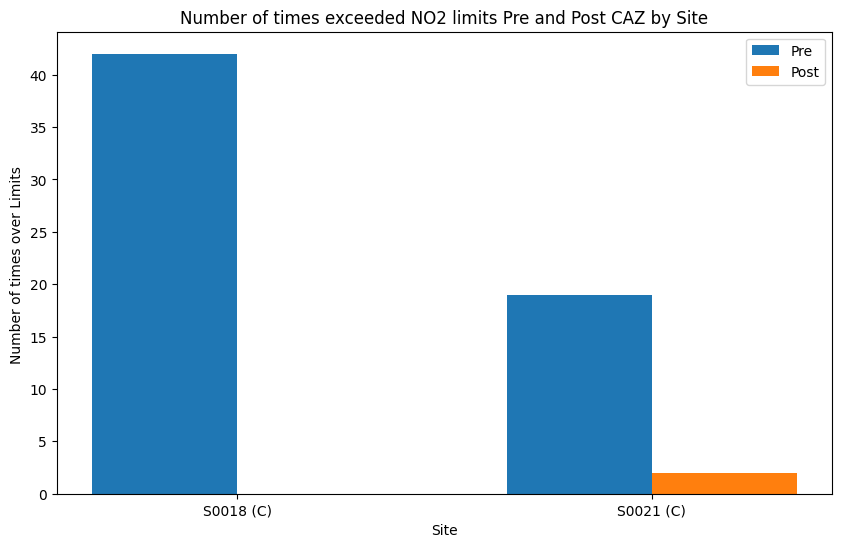

In [ ]:
plot_df = exceed_df[(exceed_df["Pollutant"] == "NO2")]

# Set the sites as index to ease plotting
plot_df.set_index('Site', inplace=True)

# Create a clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# The x locations for the groups
ind = np.arange(len(plot_df))
# The width of the bars
width = 0.35

custom_labels = ["S0018 (C)","S0021 (C)"]

# Plotting the bars
pre_bars = ax.bar(ind - width/2, plot_df['Pre'], width, label='Pre')
post_bars = ax.bar(ind + width/2, plot_df['Post'], width, label='Post')

# Adding labels, title and legend
ax.set_xlabel('Site')
ax.set_ylabel('Number of times over Limits ')
ax.set_title('Number of times exceeded NO2 limits Pre and Post CAZ by Site')
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)

ax.legend()

# Display the plot
plt.show()

From this we can say there were fewer violations post CAZ.

The next evaluation criteria is DiD which will get its own section.

# 03 Difference-in-Differences

Having processed our data we can now perform DiD to assess the signifcance of the CAZ on air quality. We'll use the DEFRA sites and compare each Barnsley and Tinsley to Devonshire Green.

## Non-Normalised DiD

First we'll do the non-weather normalised we will compare UKA00575 to UKA00622 and UKA00181 individually then to a combined 'outside' value.

### UKA00575 to UKA00622

#### NO2

In [ ]:
model_out_list_nonorm = []

outside_caz_no2 = UKA00622_NO2_pre_norm_daily.copy()
outside_caz_no2["caz_time"] = outside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_no2["group"] = "control" #1 for treatment, 0 control
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"]).dt.date

inside_caz_no2 = UKA00575_NO2_pre_norm_daily.copy()
inside_caz_no2["caz_time"] = inside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_no2["group"] = "treatment" #1 for treatment, 0 control
inside_caz_no2["date"] = pd.to_datetime(inside_caz_no2["date"]).dt.date

no2_model_df = pd.concat([inside_caz_no2, outside_caz_no2], ignore_index=True)

# Create dummy variables
no2_model_df['post'] = no2_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
no2_model_df['treatment'] = no2_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
no2_model_df['interaction'] = no2_model_df['post'] * no2_model_df['treatment']

# Define the independent variables and add a constant
X = no2_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = no2_model_df['NO2']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00622","NO2"] + list(model.params) + list(model.pvalues)
model_out_list_nonorm.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.431
Model:                            OLS   Adj. R-squared:                  0.430
Method:                 Least Squares   F-statistic:                     429.7
Date:                Tue, 27 Aug 2024   Prob (F-statistic):          1.03e-207
Time:                        11:58:23   Log-Likelihood:                -6368.1
No. Observations:                1704   AIC:                         1.274e+04
Df Residuals:                    1700   BIC:                         1.277e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          33.8554      0.514     65.828      

#### PM25

In [ ]:

outside_caz_pm25 = UKA00622_PM25_pre_norm_daily.copy()
outside_caz_pm25["caz_time"] = outside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_pm25["group"] = "control" #1 for treatment, 0 control
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"]).dt.date

inside_caz_pm25 = UKA00575_PM25_pre_norm_daily.copy()
inside_caz_pm25["caz_time"] = inside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_pm25["group"] = "treatment" #1 for treatment, 0 control
inside_caz_pm25["date"] = pd.to_datetime(inside_caz_pm25["date"]).dt.date

pm25_model_df = pd.concat([inside_caz_pm25, outside_caz_pm25], ignore_index=True)

# Create dummy variables
pm25_model_df['post'] = pm25_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
pm25_model_df['treatment'] = pm25_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
pm25_model_df['interaction'] = pm25_model_df['post'] * pm25_model_df['treatment']

# Define the independent variables and add a constant
X = pm25_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = pm25_model_df['PM25']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00622","PM25"] + list(model.params) + list(model.pvalues)
model_out_list_nonorm.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                   PM25   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     8.114
Date:                Tue, 27 Aug 2024   Prob (F-statistic):           2.29e-05
Time:                        11:58:23   Log-Likelihood:                -5457.6
No. Observations:                1706   AIC:                         1.092e+04
Df Residuals:                    1702   BIC:                         1.094e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           9.1664      0.300     30.526      

### UKA00575 to UKA00181

#### NO2

In [ ]:

outside_caz_no2 = UKA00181_NO2_pre_norm_daily.copy()
outside_caz_no2["caz_time"] = outside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_no2["group"] = "control" #1 for treatment, 0 control
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"]).dt.date

inside_caz_no2 = UKA00575_NO2_pre_norm_daily.copy()
inside_caz_no2["caz_time"] = inside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_no2["group"] = "treatment" #1 for treatment, 0 control
inside_caz_no2["date"] = pd.to_datetime(inside_caz_no2["date"]).dt.date

no2_model_df = pd.concat([inside_caz_no2, outside_caz_no2], ignore_index=True)

# Create dummy variables
no2_model_df['post'] = no2_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
no2_model_df['treatment'] = no2_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
no2_model_df['interaction'] = no2_model_df['post'] * no2_model_df['treatment']

# Define the independent variables and add a constant
X = no2_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = no2_model_df['NO2']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00181","NO2"] + list(model.params) + list(model.pvalues)
model_out_list_nonorm.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                  0.070
Method:                 Least Squares   F-statistic:                     43.66
Date:                Tue, 27 Aug 2024   Prob (F-statistic):           3.56e-27
Time:                        11:58:23   Log-Likelihood:                -6177.7
No. Observations:                1702   AIC:                         1.236e+04
Df Residuals:                    1698   BIC:                         1.239e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          22.4942      0.462     48.701      

#### PM25

In [ ]:

outside_caz_pm25 = UKA00181_PM25_pre_norm_daily.copy()
outside_caz_pm25["caz_time"] = outside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_pm25["group"] = "control" #1 for treatment, 0 control
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"]).dt.date

inside_caz_pm25 = UKA00575_PM25_pre_norm_daily.copy()
inside_caz_pm25["caz_time"] = inside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_pm25["group"] = "treatment" #1 for treatment, 0 control
inside_caz_pm25["date"] = pd.to_datetime(inside_caz_pm25["date"]).dt.date

pm25_model_df = pd.concat([inside_caz_pm25, outside_caz_pm25], ignore_index=True)

# Create dummy variables
pm25_model_df['post'] = pm25_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
pm25_model_df['treatment'] = pm25_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
pm25_model_df['interaction'] = pm25_model_df['post'] * pm25_model_df['treatment']

# Define the independent variables and add a constant
X = pm25_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = pm25_model_df['PM25']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00181","PM25"] + list(model.params) + list(model.pvalues)
model_out_list_nonorm.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                   PM25   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     2.300
Date:                Tue, 27 Aug 2024   Prob (F-statistic):             0.0755
Time:                        11:58:23   Log-Likelihood:                -5226.8
No. Observations:                1706   AIC:                         1.046e+04
Df Residuals:                    1702   BIC:                         1.048e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           6.8484      0.262     26.112      

### UKA00575 to Outside

Take the mean value between UKA00622 and UKA00181 to give a value of the outside

#### NO2

In [ ]:
overall_results_list = []
#Merge and calculate mean
outside_caz_no2 = pd.merge(UKA00181_NO2_pre_norm_daily[["date","NO2"]],UKA00622_NO2_pre_norm_daily[["date","NO2"]], on = "date")
outside_caz_no2.columns = ["date","no2_tinsley","no2_barnsley"]

outside_caz_no2["NO2"] = outside_caz_no2[["no2_tinsley","no2_barnsley"]].mean(axis=1)
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"])

#Add tags
outside_caz_no2["caz_time"] = outside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_no2["group"] = "control" #1 for treatment, 0 control
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"]).dt.date

inside_caz_no2 = UKA00575_NO2_pre_norm_daily.copy()
inside_caz_no2["caz_time"] = inside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_no2["group"] = "treatment" #1 for treatment, 0 control
inside_caz_no2["date"] = pd.to_datetime(inside_caz_no2["date"]).dt.date

no2_model_df = pd.concat([inside_caz_no2, outside_caz_no2[["date","NO2","caz_time","group"]]], ignore_index=True)

#Now create dummy variables
# Create dummy variables
no2_model_df['post'] = no2_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
no2_model_df['treatment'] = no2_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
no2_model_df['interaction'] = no2_model_df['post'] * no2_model_df['treatment']

# Define the independent variables and add a constant
X = no2_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = no2_model_df['NO2']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","Outside","NO2"] + list(model.params) + list(model.pvalues)
model_out_list_nonorm.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.256
Method:                 Least Squares   F-statistic:                     196.5
Date:                Tue, 27 Aug 2024   Prob (F-statistic):          2.26e-109
Time:                        11:58:23   Log-Likelihood:                -6203.9
No. Observations:                1702   AIC:                         1.242e+04
Df Residuals:                    1698   BIC:                         1.244e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          28.1748      0.469     60.067      

#### PM25

In [ ]:
#Merge and calculate mean
outside_caz_pm25 = pd.merge(UKA00181_PM25_pre_norm_daily[["date","PM25"]],UKA00622_PM25_pre_norm_daily[["date","PM25"]], on = "date")
outside_caz_pm25.columns = ["date","pm25_tinsley","pm25_barnsley"]

outside_caz_pm25["PM25"] = outside_caz_pm25[["pm25_tinsley","pm25_barnsley"]].mean(axis=1)
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"])

#Add tags
outside_caz_pm25["caz_time"] = outside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_pm25["group"] = "control" #1 for treatment, 0 control
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"]).dt.date

inside_caz_pm25 = UKA00575_PM25_pre_norm_daily.copy()
inside_caz_pm25["caz_time"] = inside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_pm25["group"] = "treatment" #1 for treatment, 0 control
inside_caz_pm25["date"] = pd.to_datetime(inside_caz_pm25["date"]).dt.date

pm25_model_df = pd.concat([inside_caz_pm25, outside_caz_pm25[["date","PM25","caz_time","group"]]], ignore_index=True)

# Create dummy variables
pm25_model_df['post'] = pm25_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
pm25_model_df['treatment'] = pm25_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
pm25_model_df['interaction'] = pm25_model_df['post'] * pm25_model_df['treatment']

# Define the independent variables and add a constant
X = pm25_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = pm25_model_df['PM25']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","Outside","PM25"] + list(model.params) + list(model.pvalues)
model_out_list_nonorm.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                   PM25   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.517
Date:                Tue, 27 Aug 2024   Prob (F-statistic):              0.208
Time:                        11:58:23   Log-Likelihood:                -5269.9
No. Observations:                1706   AIC:                         1.055e+04
Df Residuals:                    1702   BIC:                         1.057e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.0074      0.269     29.769      

## Normalised DiD

We'll follow the same process, but for normalised data.

### UKA00575 to UKA00622

Compare Devonshire Green to Barnsley Road, first do NO2 then PM25

#### NO2

In [ ]:
model_out_list = []

CAZ_date = datetime.datetime(2023,2,27)

outside_caz_no2 = UKA00622_NO2_post_norm.copy()
outside_caz_no2["caz_time"] = outside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_no2["group"] = "control" #1 for treatment, 0 control
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"]).dt.date

inside_caz_no2 = UKA00575_NO2_post_norm.copy()
inside_caz_no2["caz_time"] = inside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_no2["group"] = "treatment" #1 for treatment, 0 control
inside_caz_no2["date"] = pd.to_datetime(inside_caz_no2["date"]).dt.date

no2_model_df = pd.concat([inside_caz_no2, outside_caz_no2], ignore_index=True)

# Create dummy variables
no2_model_df['post'] = no2_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
no2_model_df['treatment'] = no2_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
no2_model_df['interaction'] = no2_model_df['post'] * no2_model_df['treatment']

# Define the independent variables and add a constant
X = no2_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = no2_model_df['NO2']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00622","NO2"] + list(model.params) + list(model.pvalues)
model_out_list.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                 3.861e+04
Date:                Tue, 27 Aug 2024   Prob (F-statistic):               0.00
Time:                        11:58:23   Log-Likelihood:                -2513.7
No. Observations:                1693   AIC:                             5035.
Df Residuals:                    1689   BIC:                             5057.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          33.8813      0.054    626.554      

#### PM25



In [ ]:

outside_caz_pm25 = UKA00622_PM25_post_norm.copy()
outside_caz_pm25["caz_time"] = outside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_pm25["group"] = "control" #1 for treatment, 0 control
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"]).dt.date

inside_caz_pm25 = UKA00575_PM25_post_norm.copy()
inside_caz_pm25["caz_time"] = inside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_pm25["group"] = "treatment" #1 for treatment, 0 control
inside_caz_pm25["date"] = pd.to_datetime(inside_caz_pm25["date"]).dt.date

pm25_model_df = pd.concat([inside_caz_pm25, outside_caz_pm25], ignore_index=True)

# Create dummy variables
pm25_model_df['post'] = pm25_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
pm25_model_df['treatment'] = pm25_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
pm25_model_df['interaction'] = pm25_model_df['post'] * pm25_model_df['treatment']

# Define the independent variables and add a constant
X = pm25_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = pm25_model_df['PM25']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00622","PM25"] + list(model.params) + list(model.pvalues)
model_out_list.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                   PM25   R-squared:                       0.303
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     247.0
Date:                Tue, 27 Aug 2024   Prob (F-statistic):          4.83e-133
Time:                        11:58:23   Log-Likelihood:                -2996.4
No. Observations:                1706   AIC:                             6001.
Df Residuals:                    1702   BIC:                             6023.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           9.9672      0.071    140.474      

### UKA00575 to UKA00181

#### NO2

In [ ]:

outside_caz_no2 = UKA00181_NO2_post_norm.copy()
outside_caz_no2["caz_time"] = outside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_no2["group"] = "control" #1 for treatment, 0 control
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"]).dt.date

inside_caz_no2 = UKA00575_NO2_post_norm.copy()
inside_caz_no2["caz_time"] = inside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_no2["group"] = "treatment" #1 for treatment, 0 control
inside_caz_no2["date"] = pd.to_datetime(inside_caz_no2["date"]).dt.date

no2_model_df = pd.concat([inside_caz_no2, outside_caz_no2], ignore_index=True)

# Create dummy variables
no2_model_df['post'] = no2_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
no2_model_df['treatment'] = no2_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
no2_model_df['interaction'] = no2_model_df['post'] * no2_model_df['treatment']

# Define the independent variables and add a constant
X = no2_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = no2_model_df['NO2']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00181","NO2"] + list(model.params) + list(model.pvalues)
model_out_list.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.822
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     2575.
Date:                Tue, 27 Aug 2024   Prob (F-statistic):               0.00
Time:                        11:58:23   Log-Likelihood:                -2549.0
No. Observations:                1680   AIC:                             5106.
Df Residuals:                    1676   BIC:                             5128.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          22.3956      0.056    399.344      

#### PM25

In [ ]:

outside_caz_pm25 = UKA00181_PM25_post_norm.copy()
outside_caz_pm25["caz_time"] = outside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_pm25["group"] = "control" #1 for treatment, 0 control
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"]).dt.date

inside_caz_pm25 = UKA00575_PM25_post_norm.copy()
inside_caz_pm25["caz_time"] = inside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_pm25["group"] = "treatment" #1 for treatment, 0 control
inside_caz_pm25["date"] = pd.to_datetime(inside_caz_pm25["date"]).dt.date

pm25_model_df = pd.concat([inside_caz_pm25, outside_caz_pm25], ignore_index=True)

# Create dummy variables
pm25_model_df['post'] = pm25_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
pm25_model_df['treatment'] = pm25_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
pm25_model_df['interaction'] = pm25_model_df['post'] * pm25_model_df['treatment']

# Define the independent variables and add a constant
X = pm25_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = pm25_model_df['PM25']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","UKA00181","PM25"] + list(model.params) + list(model.pvalues)
model_out_list.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                   PM25   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.101
Method:                 Least Squares   F-statistic:                     64.80
Date:                Tue, 27 Aug 2024   Prob (F-statistic):           1.13e-39
Time:                        11:58:23   Log-Likelihood:                -2320.4
No. Observations:                1706   AIC:                             4649.
Df Residuals:                    1702   BIC:                             4671.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           7.1391      0.048    149.539      

### UKA00575 to Outside

#### NO2

In [ ]:
overall_results_list = []
#Merge and calculate mean
outside_caz_no2 = pd.merge(UKA00181_NO2_post_norm[["date","NO2"]],UKA00622_NO2_post_norm[["date","NO2"]], on = "date")
outside_caz_no2.columns = ["date","no2_tinsley","no2_barnsley"]

outside_caz_no2["NO2"] = outside_caz_no2[["no2_tinsley","no2_barnsley"]].mean(axis=1)
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"])

#Add tags
outside_caz_no2["caz_time"] = outside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_no2["group"] = "control" #1 for treatment, 0 control
outside_caz_no2["date"] = pd.to_datetime(outside_caz_no2["date"]).dt.date

inside_caz_no2 = UKA00575_NO2_post_norm.copy()
inside_caz_no2["caz_time"] = inside_caz_no2["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_no2["group"] = "treatment" #1 for treatment, 0 control
inside_caz_no2["date"] = pd.to_datetime(inside_caz_no2["date"]).dt.date

no2_model_df = pd.concat([inside_caz_no2, outside_caz_no2[["date","NO2","caz_time","group"]]], ignore_index=True)

#Now create dummy variables
# Create dummy variables
no2_model_df['post'] = no2_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
no2_model_df['treatment'] = no2_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
no2_model_df['interaction'] = no2_model_df['post'] * no2_model_df['treatment']

# Define the independent variables and add a constant
X = no2_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = no2_model_df['NO2']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","Outside","NO2"] + list(model.params) + list(model.pvalues)
model_out_list.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.965
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                 1.553e+04
Date:                Tue, 27 Aug 2024   Prob (F-statistic):               0.00
Time:                        11:58:23   Log-Likelihood:                -2442.9
No. Observations:                1680   AIC:                             4894.
Df Residuals:                    1676   BIC:                             4915.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          28.1416      0.053    534.534      

#### PM25

In [ ]:
#Merge and calculate mean
outside_caz_pm25 = pd.merge(UKA00181_PM25_post_norm[["date","PM25"]],UKA00622_PM25_post_norm[["date","PM25"]], on = "date")
outside_caz_pm25.columns = ["date","pm25_tinsley","pm25_barnsley"]

outside_caz_pm25["PM25"] = outside_caz_pm25[["pm25_tinsley","pm25_barnsley"]].mean(axis=1)
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"])

#Add tags
outside_caz_pm25["caz_time"] = outside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
outside_caz_pm25["group"] = "control" #1 for treatment, 0 control
outside_caz_pm25["date"] = pd.to_datetime(outside_caz_pm25["date"]).dt.date

inside_caz_pm25 = UKA00575_PM25_post_norm.copy()
inside_caz_pm25["caz_time"] = inside_caz_pm25["date"].apply(lambda x: "post" if x >= CAZ_date else "pre") #0 pre, 1 post
inside_caz_pm25["group"] = "treatment" #1 for treatment, 0 control
inside_caz_pm25["date"] = pd.to_datetime(inside_caz_pm25["date"]).dt.date

pm25_model_df = pd.concat([inside_caz_pm25, outside_caz_pm25[["date","PM25","caz_time","group"]]], ignore_index=True)

# Create dummy variables
pm25_model_df['post'] = pm25_model_df['caz_time'].apply(lambda x: 1 if x == 'post' else 0)
pm25_model_df['treatment'] = pm25_model_df['group'].apply(lambda x: 1 if x == 'treatment' else 0)
pm25_model_df['interaction'] = pm25_model_df['post'] * pm25_model_df['treatment']

# Define the independent variables and add a constant
X = pm25_model_df[['post', 'treatment', 'interaction']]
X = sm.add_constant(X)

# Define the dependent variable
y = pm25_model_df['PM25']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

temp_list = ["UKA00575","Outside","PM25"] + list(model.params) + list(model.pvalues)
model_out_list.append(temp_list)

                            OLS Regression Results                            
Dep. Variable:                   PM25   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.131
Method:                 Least Squares   F-statistic:                     86.58
Date:                Tue, 27 Aug 2024   Prob (F-statistic):           3.90e-52
Time:                        11:58:23   Log-Likelihood:                -2429.4
No. Observations:                1706   AIC:                             4867.
Df Residuals:                    1702   BIC:                             4889.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.5531      0.051    168.068      

## DiD Results

That was a lot of DiD models so let's print out the results

### Pre-Normalisation

In [ ]:
pre_norm_did_results = pd.DataFrame(model_out_list_nonorm,columns = ["Site1","Site2","Pollutant","Const","Post","Treatment","Interaction","p(const)","p(post)","p(treatment)","p(interaction)"])
pre_norm_did_results.sort_values("Pollutant")

,Site1,Site2,Pollutant,Const,Post,Treatment,Interaction,p(const),p(post),p(treatment),p(interaction)
0,UKA00575,UKA00622,NO2,33.855405,0.060673,-16.910263,-1.396731,0.000000e+00,9.308246e-01,4.731718e-104,0.157965
2,UKA00575,UKA00181,NO2,22.494227,-4.479276,-5.549086,3.143217,0.000000e+00,1.479137e-12,4.252587e-17,0.000414
4,UKA00575,Outside,NO2,28.174816,-2.195636,-11.229674,0.859577,0.000000e+00,5.924814e-04,1.588131e-59,0.340874
1,UKA00575,UKA00622,PM25,9.166366,-0.560936,-1.348981,0.060963,1.358440e-163,1.693746e-01,1.516557e-03,0.915871
3,UKA00575,UKA00181,PM25,6.848417,0.402289,0.968968,-0.902262,1.105541e-126,2.591264e-01,9.069853e-03,0.073594
5,UKA00575,Outside,PM25,8.007391,-0.079324,-0.190007,-0.420650,4.058136e-157,8.282118e-01,6.175033e-01,0.415872


What does each of these mean? Consider the coefficient of interaction and its significance


- NO2
    - UKA00575 to UKA00622 = -1.40 (p = 0.16) => No significant change
    - UKA00575 to UKA00181 = 3.14 (p < 0.000) => Significant increase in NO2
    - UKA00575 to Outside  = 0.86 (p = 0.340) => No significant overall change

- PM25
    - UKA00575 to UKA00622 = -1.35 (p = 0.92) => No significant change
    - UKA00575 to UKA00181 = 0.97 (p = 0.07) => No significant change
    - UKA00575 to Outside  = -0.42 (p = 0.42) => No significant overall change


### Post Normalisation



In [ ]:
post_norm_did_results = pd.DataFrame(model_out_list,columns = ["Site1","Site2","Pollutant","Const","Post","Treatment","Interaction","p(const)","p(post)","p(treatment)","p(interaction)"])
post_norm_did_results.sort_values("Pollutant")

,Site1,Site2,Pollutant,Const,Post,Treatment,Interaction,p(const),p(post),p(treatment),p(interaction)
0,UKA00575,UKA00622,NO2,33.881325,0.587018,-16.892329,-1.447382,0.0,2.493919e-15,0.000000e+00,1.478125e-41
2,UKA00575,UKA00181,NO2,22.395586,-3.393419,-5.406590,2.533055,0.0,3.514962e-285,0.000000e+00,3.087559e-105
4,UKA00575,Outside,NO2,28.141557,-1.406384,-11.152561,0.546019,0.0,3.764592e-77,0.000000e+00,8.518041e-08
1,UKA00575,UKA00622,PM25,9.967198,-1.193727,-1.913443,0.593870,0.0,8.931499e-34,1.263561e-73,1.406374e-05
3,UKA00575,UKA00181,PM25,7.139098,0.298289,0.914656,-0.898146,0.0,4.574377e-06,8.760673e-40,4.683371e-22
5,UKA00575,Outside,PM25,8.553148,-0.447719,-0.499394,-0.152138,0.0,1.240468e-10,5.598477e-12,1.199631e-01


And to briefly summarise:

**Note: If you have performed weather normalisation again these values may differ**


- NO2
    - UKA00575 to UKA00622 = -1.44 (p = < 0.000) => Significant decrease in NO2
    - UKA00575 to UKA00181 = 2.53 (p < 0.000) => Significant increase in NO2
    - UKA00575 to Outside  = 0.55 (p = < 0.000) => Significant increase in NO2

- PM25
    - UKA00575 to UKA00622 = 0.59 (p = < 0.000) => Significant increase in PM25
    - UKA00575 to UKA00181 = -0.90 (p = < 0.000) => Significant decrease in PM25
    - UKA00575 to Outside  = -0.15 (p = 0.120) => No significant overall change

So while there were overall reductions in NO2 and PM25 both outside and inside, the CAZ did not lead to greater reductions in NO2 or PM25 inside the CAZ.

# 04 Traffic Data Preparation

Traffic data follows a similar pattern to AQ data. We'll get data for traffic surrounding our AQ monitoring sites (primary sites), and we'll also get a series of secondary sites outside the CAZ to assess spillover.

SUFO provides data from SCC's traffic monitoring network. The data is in flow, or cars/min. For each site we'll convert this value into total cars per day.

We've located a number of traffic sites near to our sensors and downloaded their data. We'll retrieve that data and calcualte the number of cars in each interval

## Locating Sites and Downloading Data

We've developed tools to allow us to search for traffic sites surrounding a set of coordinates. This has allowed us to identify a number of sites near each Primary AQ site

In [ ]:
#Specify the path where the traffic data is stored
traffic_path = folder_path + "/Data/Raw/SUFO Traffic/"
map_path = folder_path + "/Maps/" #Path where downloaded maps should come from

site_coords = {"UKA00575" : ("53.378622","-1.478096"),
               "UKA00622" : ("53.40495","-1.455815"),
               "UKA00181" : ("53.41058","-1.396139"),}

## Primary AQ Sites

### UKA0575

#### Site Map

In [ ]:
#Map of sensors
lat  = site_coords["UKA00575"][0]
long = site_coords["UKA00575"][1]

# Define the bounding box coordinates (in this example, a small area in Sheffield)
north, east, south, west = SUFO_Traffic.calculate_bounding_box(lat, long, "0.5")

# Download the street network data for the bounding box
graph = ox.graph_from_bbox(north, south, east, west, network_type='all')

filename = f"sheffield_{south}_{west}_{north}_{east}.graphml"
path = folder_path + "/Maps/"
ox.save_graphml(graph, filepath=path + filename)



C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\582507676.py:9: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  graph = ox.graph_from_bbox(north, south, east, west, network_type='all')


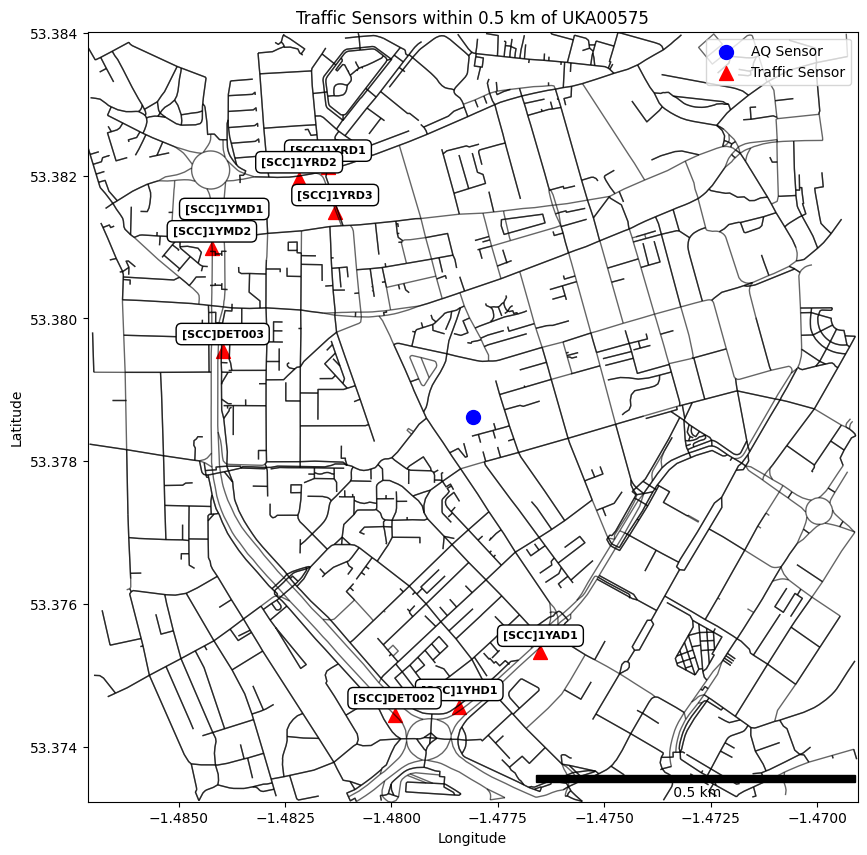

In [ ]:
#Map of sensors
lat  = site_coords["UKA00575"][0]
long = site_coords["UKA00575"][1]

#Coords of Traffic sites
UKA00575_traffic = SUFO_Traffic.locate_traffic_sites(site_coords["UKA00575"][0],site_coords["UKA00575"][1],"0.5","2023-06-25T01:00:00","2023-06-26T01:00:00")
sensor_names = list(UKA00575_traffic.keys())

# Define the bounding box coordinates (in this example, a small area in Sheffield)
north, east, south, west = SUFO_Traffic.calculate_bounding_box(lat, long, "0.5")

#Maps are saved as GraphML, load the correct one
filename = f"sheffield_{south}_{west}_{north}_{east}.graphml"
path = folder_path + "/Maps/"

#Now load
file_path = path + filename

# Check if the file exists
if os.path.exists(file_path):
    # Load the graph from the file
    graph = ox.load_graphml(filepath=file_path)
else:
    # If the file doesn't exist, download and save the graph as before
    graph = ox.graph_from_bbox(north, south, east, west, network_type='all')
    ox.save_graphml(graph, filepath=file_path)

# Convert the graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(graph)

# Create a GeoDataFrame for the main marker
main_marker = gpd.GeoDataFrame(geometry=[Point(long, lat)], crs="EPSG:4326")
main_marker = main_marker.to_crs(edges.crs)

additional_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in UKA00575_traffic.values()],
    crs="EPSG:4326"
)

additional_markers = additional_markers.to_crs(edges.crs)

#Now Plot
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='black', alpha = 0.6)

# Plot the main marker
main_marker.plot(ax=ax, color='blue', marker='o', markersize=100, label='AQ Sensor')

# Plot the additional markers
additional_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='Traffic Sensor', alpha = 1)

# Annotate each additional marker with text from sensor_names list
for idx, row in additional_markers.iterrows():
    sensor_name = sensor_names[idx] if idx < len(sensor_names) else 'Unnamed Sensor'
    ax.annotate(sensor_name, xy=(row['geometry'].x, row['geometry'].y), xytext=(0, 10),
                textcoords='offset points', ha='center', fontsize=8, color='black', fontweight = "bold",
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

#Add a scale bar
scale_bar_length = 0.0075 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f' 0.5 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0001,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"Traffic Sensors within 0.5 km of UKA00575")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

#### Data Plots

Plot the data from each sensor

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\295842272.py:15: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  UKA00575_traffic_all[s_name]["time_diff"].iloc[0] = 0
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\295842272.py:15: Setting

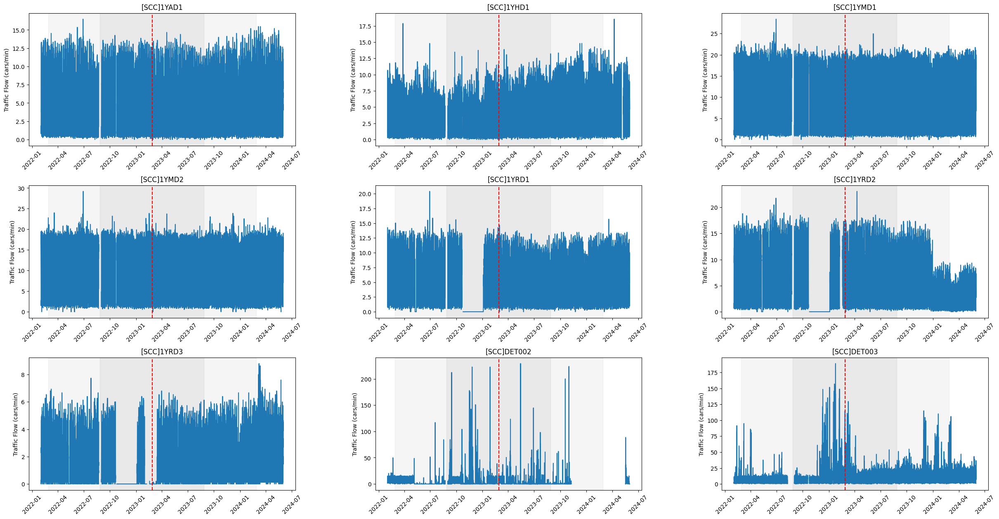

In [ ]:
n_plots = len(sensor_names)
UKA00575_missing = {}
UKA00575_traffic_all = {}

#Load data
#UKA00575
for s_name in sensor_names:
    #Load the data
    UKA00575_traffic_all[s_name] = pd.read_pickle(traffic_path + s_name + "_20220201_20240601_flow")
    UKA00575_traffic_all[s_name]["flow"] =  UKA00575_traffic_all[s_name]["flow"].apply(lambda x: np.where(x < -1000,np.nan,x))

    #Now calculate the total cars per day
    UKA00575_traffic_all[s_name]['date'] = UKA00575_traffic_all[s_name]['ISO_time'].dt.date
    UKA00575_traffic_all[s_name]["time_diff"] = UKA00575_traffic_all[s_name]["ISO_time"].diff().dt.total_seconds()/60
    UKA00575_traffic_all[s_name]["time_diff"].iloc[0] = 0
    UKA00575_traffic_all[s_name]["cars"] = UKA00575_traffic_all[s_name]["flow"] * UKA00575_traffic_all[s_name]["time_diff"]

    #Missing data numbers
    UKA00575_missing[s_name] = [UKA00575_traffic_all[s_name]["cars"].isna().sum(),len(UKA00575_traffic_all[s_name]["cars"])]

#Now plot
fig = plt.figure(figsize=(30, 15))
gs = gridspec.GridSpec(3,3, width_ratios=[1, 1,1], wspace=0.3, hspace=0.3)  # 2/3 for the line plot, 1/3 for the histogram

x = 0
for s_name in UKA00575_traffic_all.keys():
    ax = plt.subplot(gs[x])
    ax.plot(UKA00575_traffic_all[s_name]["ISO_time"],UKA00575_traffic_all[s_name]["flow"])
    ax.set_title(f'{s_name}')
    ax.set_ylabel("Traffic Flow (cars/min)")
    #Now add a vertical line and shading
    ax.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

    plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
    plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')
    plt.xticks(rotation=45)
    x += 1

plt.show()

#### Missing Values

Now calculate the number of missing values for each sensor

In [ ]:
UKA00575_missing_df = pd.DataFrame(UKA00575_missing).transpose()
UKA00575_missing_df.columns = ["n_missing","n_total"]
UKA00575_missing_df["pct_missing"] = 100*(UKA00575_missing_df["n_missing"]/UKA00575_missing_df["n_total"])
UKA00575_missing_df

,n_missing,n_total,pct_missing
[SCC]1YAD1,1046,40831,2.561779
[SCC]1YHD1,958,40831,2.346257
[SCC]1YMD1,979,40831,2.397688
[SCC]1YMD2,958,40831,2.346257
[SCC]1YRD1,958,40831,2.346257
[SCC]1YRD2,1450,40831,3.551223
[SCC]1YRD3,1450,40831,3.551223
[SCC]DET002,204837,235965,86.808213
[SCC]DET003,2007,40874,4.910212


Now for a map of the ones we kept

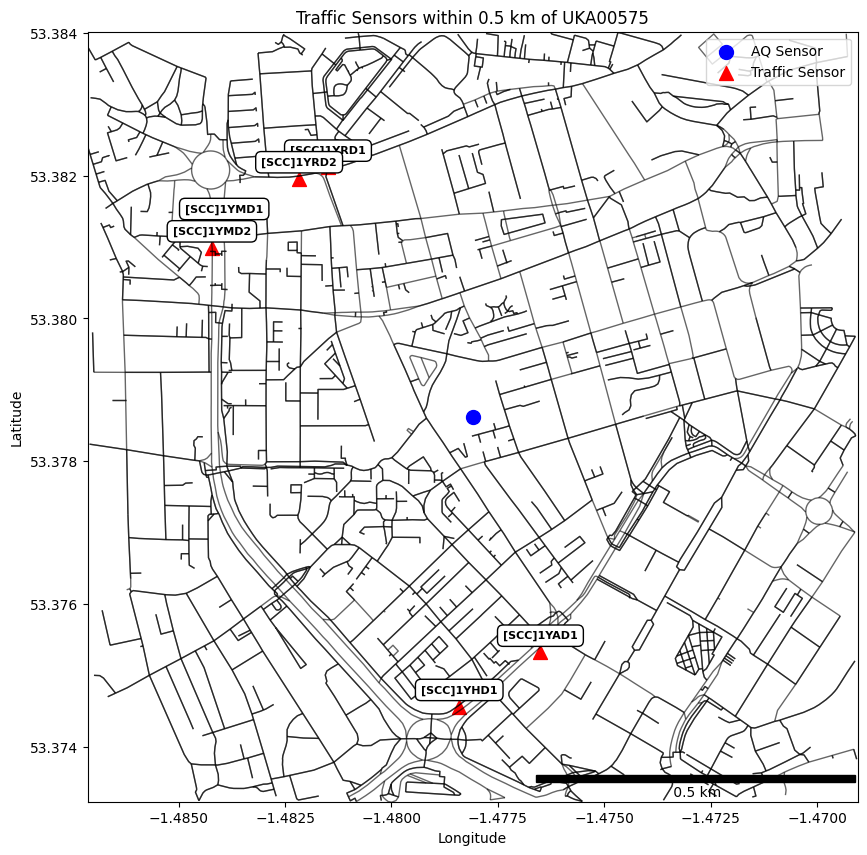

In [ ]:
#This is a dict of only the ones we want to take forward
site_names = {}
site_names["UKA00575"] = ['[SCC]1YAD1', '[SCC]1YHD1', '[SCC]1YMD1', '[SCC]1YMD2', '[SCC]1YRD1', '[SCC]1YRD2']

UKA00575_traffic_filt = {key: UKA00575_traffic[key] for key in site_names["UKA00575"]  if key in UKA00575_traffic}

#Map of sensors
lat  = site_coords["UKA00575"][0]
long = site_coords["UKA00575"][1]

#Coords of Traffic sites
sensor_names = list(UKA00575_traffic.keys())

nodes, edges = ox.graph_to_gdfs(graph)

# Create a GeoDataFrame for the main marker
main_marker = gpd.GeoDataFrame(geometry=[Point(long, lat)], crs="EPSG:4326")
main_marker = main_marker.to_crs(edges.crs)

additional_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in UKA00575_traffic_filt.values()],
    crs="EPSG:4326"
)

additional_markers = additional_markers.to_crs(edges.crs)
#ADD OTHER POINT
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='black', alpha = 0.6)

# Plot the main marker
main_marker.plot(ax=ax, color='blue', marker='o', markersize=100, label='AQ Sensor')

# Plot the additional markers
additional_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='Traffic Sensor', alpha = 1)

# Annotate each additional marker with text from sensor_names list
for idx, row in additional_markers.iterrows():
    sensor_name = sensor_names[idx] if idx < len(sensor_names) else 'Unnamed Sensor'
    ax.annotate(sensor_name, xy=(row['geometry'].x, row['geometry'].y), xytext=(0, 10),
                textcoords='offset points', ha='center', fontsize=8, color='black', fontweight = "bold",
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

#Add a scale bar
scale_bar_length = 0.0075 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f' 0.5 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0001,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"Traffic Sensors within 0.5 km of UKA00575")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

### UKA00622

#### Site Map

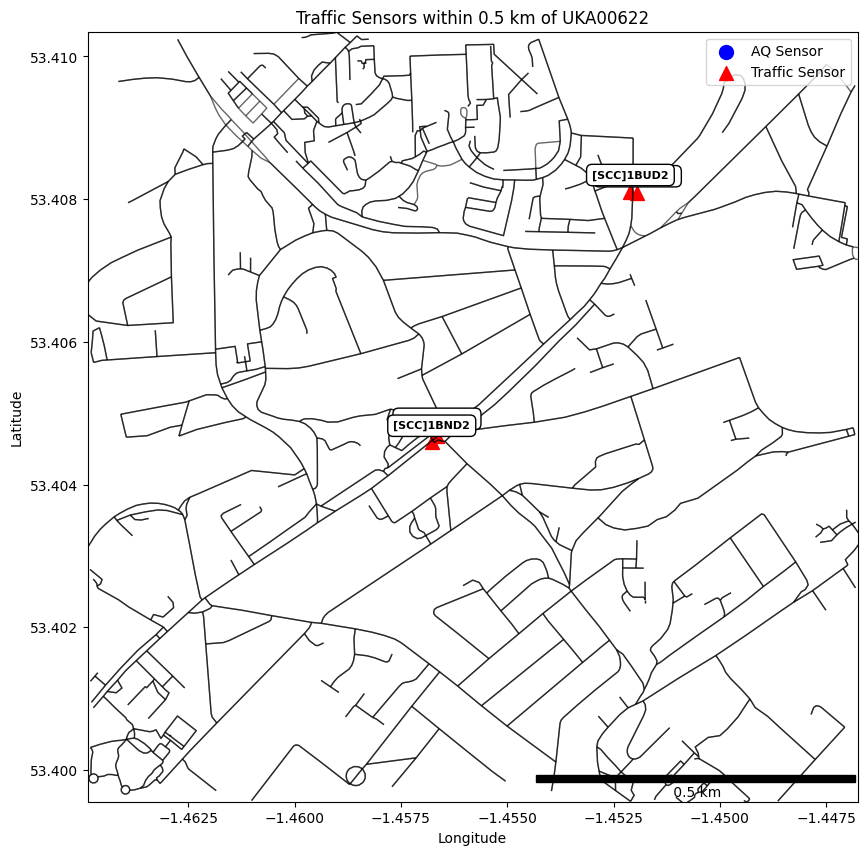

In [ ]:
#Map of sensors
lat  = site_coords["UKA00622"][0]
long = site_coords["UKA00622"][1]

#Coords of Traffic sites
UKA00622_traffic = SUFO_Traffic.locate_traffic_sites(site_coords["UKA00622"][0],site_coords["UKA00622"][1],"0.5","2023-06-25T01:00:00","2023-06-26T01:00:00")
sensor_names = list(UKA00622_traffic.keys())

# Define the bounding box coordinates (in this example, a small area in Sheffield)
north, east, south, west = SUFO_Traffic.calculate_bounding_box(lat, long, "0.5")

#Maps are saved as GraphML, load the correct one
filename = f"sheffield_{south}_{west}_{north}_{east}.graphml"
path = folder_path + "/Maps/"

#Now load
file_path = path + filename

# Check if the file exists
if os.path.exists(file_path):
    # Load the graph from the file
    graph = ox.load_graphml(filepath=file_path)
else:
    # If the file doesn't exist, download and save the graph as before
    graph = ox.graph_from_bbox(north, south, east, west, network_type='all')
    ox.save_graphml(graph, filepath=file_path)

# Convert the graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(graph)


# Create a GeoDataFrame for the main marker
main_marker = gpd.GeoDataFrame(geometry=[Point(long, lat)], crs="EPSG:4326")
main_marker = main_marker.to_crs(edges.crs)

additional_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in UKA00622_traffic.values()],
    crs="EPSG:4326"
)

additional_markers = additional_markers.to_crs(edges.crs)
#ADD OTHER POINT
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='black', alpha = 0.6)

# Plot the main marker
main_marker.plot(ax=ax, color='blue', marker='o', markersize=100, label='AQ Sensor')

# Plot the additional markers
additional_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='Traffic Sensor', alpha = 1)

# Annotate each additional marker with text from sensor_names list
for idx, row in additional_markers.iterrows():
    sensor_name = sensor_names[idx] if idx < len(sensor_names) else 'Unnamed Sensor'
    ax.annotate(sensor_name, xy=(row['geometry'].x, row['geometry'].y), xytext=(0, 10),
                textcoords='offset points', ha='center', fontsize=8, color='black', fontweight = "bold",
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

#Add a scale bar
scale_bar_length = 0.0075 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f' 0.5 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0001,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"Traffic Sensors within 0.5 km of UKA00622")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

The AQ sensor here is obscured by the two sensors 1BND1 and 1BND2

#### Data Plots

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3027130139.py:14: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  UKA00622_traffic_all[s_name]["time_diff"].iloc[0] = 0
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3027130139.py:14: Setti

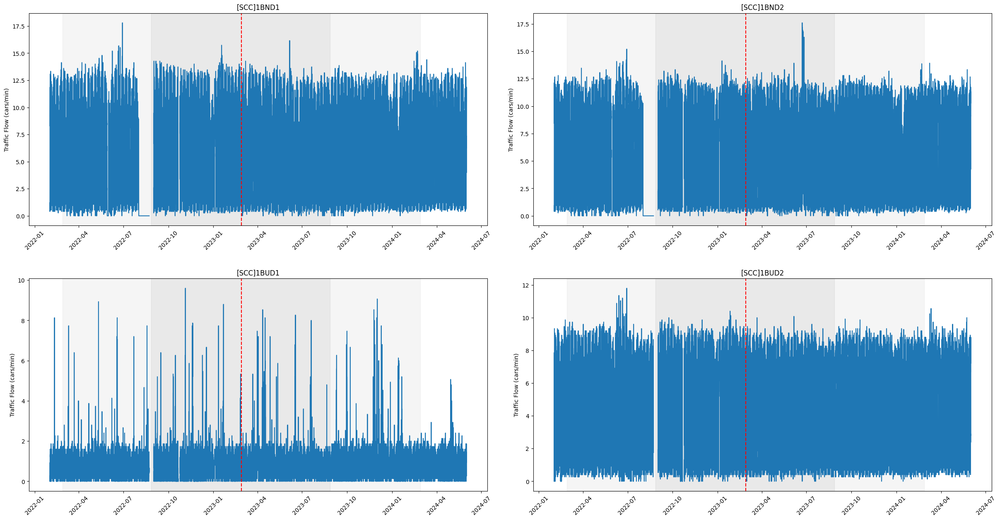

In [ ]:
n_plots = len(UKA00622_traffic.keys())
UKA00622_missing = {}
UKA00622_traffic_all = {}
#Load data
#UKA00575
#UKA00622
for s_name in UKA00622_traffic.keys():
    #Load the data
    UKA00622_traffic_all[s_name] = pd.read_pickle(traffic_path + s_name + "_20220201_20240601_flow")

    #Now calculate the total cars per day
    UKA00622_traffic_all[s_name]['date'] = UKA00622_traffic_all[s_name]['ISO_time'].dt.date
    UKA00622_traffic_all[s_name]["time_diff"] = UKA00622_traffic_all[s_name]["ISO_time"].diff().dt.total_seconds()/60
    UKA00622_traffic_all[s_name]["time_diff"].iloc[0] = 0
    UKA00622_traffic_all[s_name]["cars"] = UKA00622_traffic_all[s_name]["flow"] * UKA00622_traffic_all[s_name]["time_diff"]

    #Missing data numbers
    UKA00622_missing[s_name] = [UKA00622_traffic_all[s_name]["cars"].isna().sum(),len(UKA00622_traffic_all[s_name]["cars"])]

#Now plot
fig = plt.figure(figsize=(30, 15))
gs = gridspec.GridSpec(2,2, width_ratios=[1, 1], wspace=0.1, hspace=0.25)  # 2/3 for the line plot, 1/3 for the histogram
x = 0
for s_name in UKA00622_traffic_all.keys():
    ax = plt.subplot(gs[x])
    ax.plot(UKA00622_traffic_all[s_name]["ISO_time"],UKA00622_traffic_all[s_name]["flow"])
    ax.set_title(f'{s_name}')
    ax.set_ylabel("Traffic Flow (cars/min)")

    #Now add a vertical line and shading
    ax.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

    plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
    plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')
    plt.xticks(rotation=45)
    x += 1

plt.show()

#### Missing Values

In [ ]:
UKA00622_missing_df = pd.DataFrame(UKA00622_missing).transpose()
UKA00622_missing_df.columns = ["n_missing","n_total"]
UKA00622_missing_df["pct_missing"] = 100*(UKA00622_missing_df["n_missing"]/UKA00622_missing_df["n_total"])
UKA00622_missing_df

,n_missing,n_total,pct_missing
[SCC]1BND1,956,40831,2.341358
[SCC]1BND2,956,40831,2.341358
[SCC]1BUD1,956,40831,2.341358
[SCC]1BUD2,956,40831,2.341358


Now for a fitlered Map

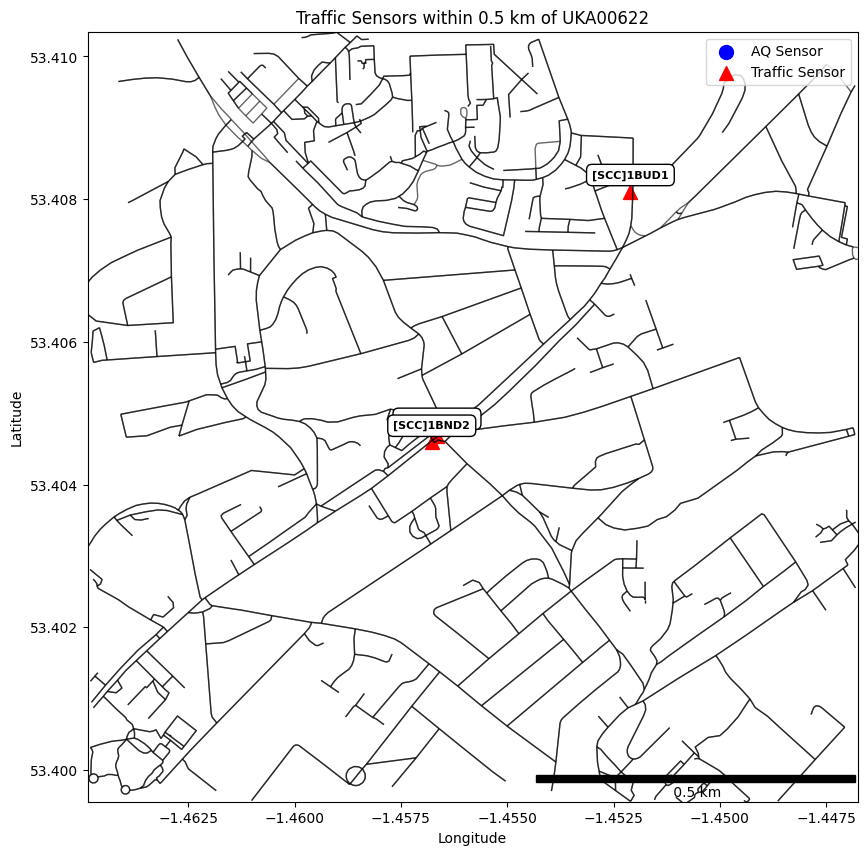

In [ ]:
#This is a dict of only the ones we want to take forward
site_names["UKA00622"] = ['[SCC]1BND1', '[SCC]1BND2', '[SCC]1BUD2']

UKA00622_traffic_filt = {key: UKA00622_traffic[key] for key in site_names["UKA00622"]  if key in UKA00622_traffic}

#Map of sensors
lat  = site_coords["UKA00622"][0]
long = site_coords["UKA00622"][1]

#Coords of Traffic sites
sensor_names = list(UKA00622_traffic.keys())

# Convert the graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(graph)

# Create a GeoDataFrame for the main marker
main_marker = gpd.GeoDataFrame(geometry=[Point(long, lat)], crs="EPSG:4326")
main_marker = main_marker.to_crs(edges.crs)

additional_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in UKA00622_traffic_filt.values()],
    crs="EPSG:4326"
)

additional_markers = additional_markers.to_crs(edges.crs)
#ADD OTHER POINT
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='black', alpha = 0.6)

# Plot the main marker
main_marker.plot(ax=ax, color='blue', marker='o', markersize=100, label='AQ Sensor')

# Plot the additional markers
additional_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='Traffic Sensor', alpha = 1)

# Annotate each additional marker with text from sensor_names list
for idx, row in additional_markers.iterrows():
    sensor_name = sensor_names[idx] if idx < len(sensor_names) else 'Unnamed Sensor'
    ax.annotate(sensor_name, xy=(row['geometry'].x, row['geometry'].y), xytext=(0, 10),
                textcoords='offset points', ha='center', fontsize=8, color='black', fontweight = "bold",
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

#Add a scale bar
scale_bar_length = 0.0075 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f' 0.5 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0001,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"Traffic Sensors within 0.5 km of UKA00622")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

### UKA00181

For this site we had to increase the radius to 1km

#### Site Map

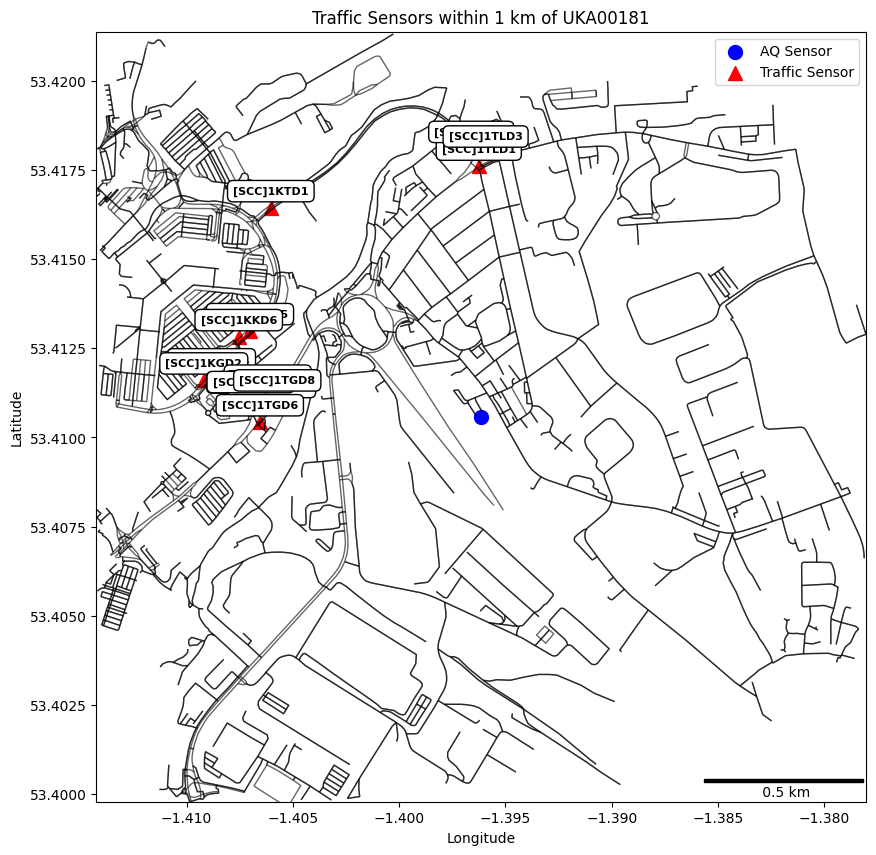

In [ ]:
#Map of sensors
lat  = site_coords["UKA00181"][0]
long = site_coords["UKA00181"][1]

#Coords of Traffic sites
UKA00181_traffic = SUFO_Traffic.locate_traffic_sites(site_coords["UKA00181"][0],site_coords["UKA00181"][1],"1","2023-06-25T01:00:00","2023-06-26T01:00:00")
sensor_names = list(UKA00181_traffic.keys())

# Define the bounding box coordinates (in this example, a small area in Sheffield)
north, east, south, west = SUFO_Traffic.calculate_bounding_box(lat, long, "1")

#Maps are saved as GraphML, load the correct one
filename = f"sheffield_{south}_{west}_{north}_{east}.graphml"
path = folder_path + "/Maps/"

#Now load
file_path = path + filename

# Check if the file exists
if os.path.exists(file_path):
    # Load the graph from the file
    graph = ox.load_graphml(filepath=file_path)
else:
    # If the file doesn't exist, download and save the graph as before
    graph = ox.graph_from_bbox(north, south, east, west, network_type='all')
    ox.save_graphml(graph, filepath=file_path)

# Convert the graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(graph)

# Create a GeoDataFrame for the main marker
main_marker = gpd.GeoDataFrame(geometry=[Point(long, lat)], crs="EPSG:4326")
main_marker = main_marker.to_crs(edges.crs)

additional_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in UKA00181_traffic.values()],
    crs="EPSG:4326"
)

additional_markers = additional_markers.to_crs(edges.crs)
#ADD OTHER POINT
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='black', alpha = 0.6)

# Plot the main marker
main_marker.plot(ax=ax, color='blue', marker='o', markersize=100, label='AQ Sensor')

# Plot the additional markers
additional_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='Traffic Sensor', alpha = 1)

# Annotate each additional marker with text from sensor_names list
for idx, row in additional_markers.iterrows():
    sensor_name = sensor_names[idx] if idx < len(sensor_names) else 'Unnamed Sensor'
    ax.annotate(sensor_name, xy=(row['geometry'].x, row['geometry'].y), xytext=(0, 10),
                textcoords='offset points', ha='center', fontsize=8, color='black', fontweight = "bold",
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

#Add a scale bar
scale_bar_length = 0.0075 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f' 0.5 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0001,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"Traffic Sensors within 1 km of UKA00181")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

#### Data Plots

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3975742124.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  UKA00181_traffic_all[s_name]["time_diff"].iloc[0] = 0
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\3975742124.py:11: Setti

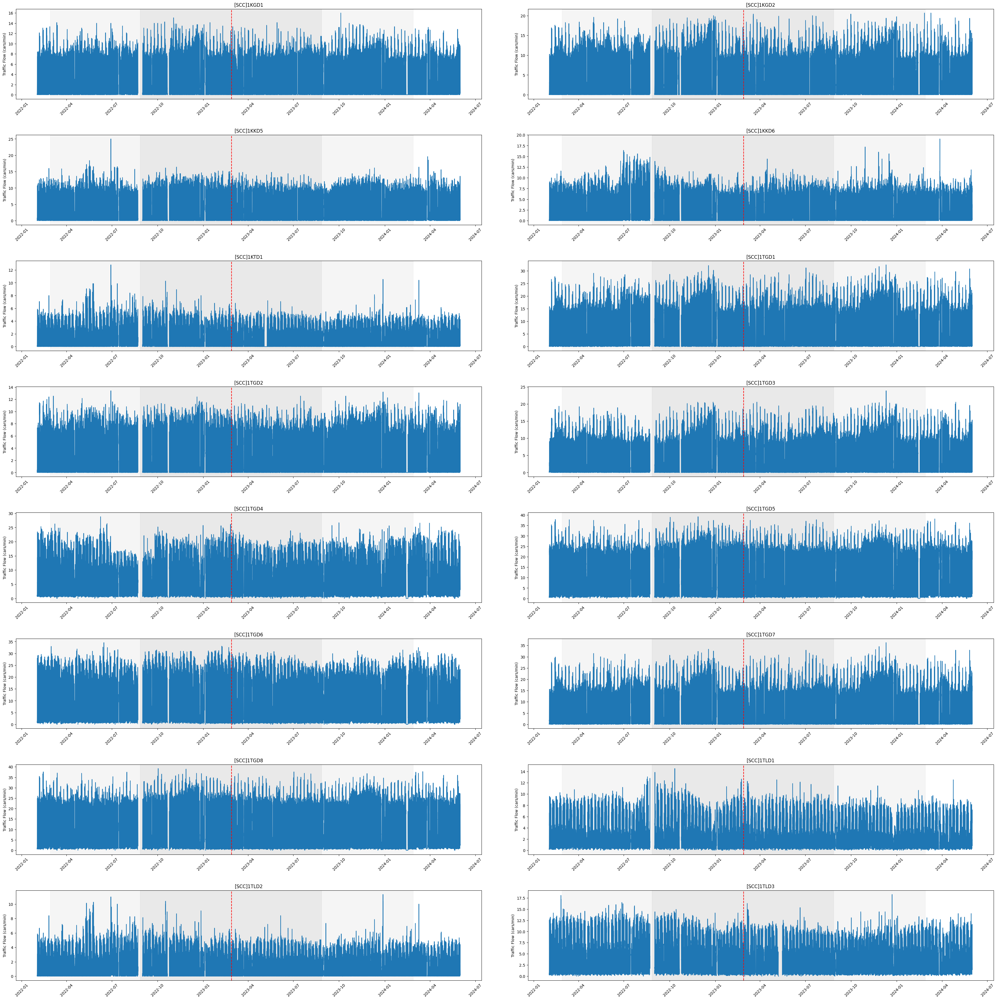

In [ ]:
UKA00181_missing = {}
UKA00181_traffic_all = {}
#UKA00181
for s_name in UKA00181_traffic.keys():
    #Load the data
    UKA00181_traffic_all[s_name] = pd.read_pickle(traffic_path + s_name + "_20220201_20240601_flow")

    #Now calculate the total cars per day
    UKA00181_traffic_all[s_name]['date'] = UKA00181_traffic_all[s_name]['ISO_time'].dt.date
    UKA00181_traffic_all[s_name]["time_diff"] = UKA00181_traffic_all[s_name]["ISO_time"].diff().dt.total_seconds()/60
    UKA00181_traffic_all[s_name]["time_diff"].iloc[0] = 0
    UKA00181_traffic_all[s_name]["cars"] = UKA00181_traffic_all[s_name]["flow"] * UKA00181_traffic_all[s_name]["time_diff"]

    #Missing data numbers
    UKA00181_missing[s_name] = [UKA00181_traffic_all[s_name]["cars"].isna().sum(),len(UKA00181_traffic_all[s_name]["cars"])]

n_plots = len(sensor_names)

#Now plot
fig = plt.figure(figsize=(45, 45))
gs = gridspec.GridSpec(8,2, width_ratios=[1,1], wspace=0.1, hspace=0.4)
x = 0
for s_name in UKA00181_traffic_all.keys():
    ax = plt.subplot(gs[x])
    ax.plot(UKA00181_traffic_all[s_name]["ISO_time"],UKA00181_traffic_all[s_name]["flow"])
    ax.set_title(f'{s_name}')
    ax.set_ylabel("Traffic Flow (cars/min)")
    #Now add a vertical line and shading
    ax.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')

    plt.axvspan(caz_vdate - pd.DateOffset(months = 6), caz_vdate + pd.DateOffset(months=6), color='gray', alpha=0.1, label='6-Month Window')
    plt.axvspan(caz_vdate - pd.DateOffset(months = 12), caz_vdate + pd.DateOffset(months=12), color='gray', alpha=0.08, label='12-Month Window')
    plt.xticks(rotation=45)
    x += 1

plt.show()

#### Missing Values

In [ ]:
UKA00181_missing_df = pd.DataFrame(UKA00181_missing).transpose()
UKA00181_missing_df.columns = ["n_missing","n_total"]
UKA00181_missing_df["pct_missing"] = 100*(UKA00181_missing_df["n_missing"]/UKA00181_missing_df["n_total"])
UKA00181_missing_df

,n_missing,n_total,pct_missing
[SCC]1KGD1,957,40831,2.343807
[SCC]1KGD2,1039,40831,2.544635
[SCC]1KKD5,957,40831,2.343807
[SCC]1KKD6,957,40831,2.343807
[SCC]1KTD1,957,40831,2.343807
[SCC]1TGD1,958,40831,2.346257
[SCC]1TGD2,958,40831,2.346257
[SCC]1TGD3,958,40831,2.346257
[SCC]1TGD4,958,40831,2.346257
[SCC]1TGD5,958,40831,2.346257


### Missing Value Handling

From the above data we've chosen a few to carry forward, we've already done UKA00575 and 622, now for 181


In [ ]:
#This is a dict of only the ones we want to take forward
site_names["UKA00181"] = ['[SCC]1KGD1', '[SCC]1KGD2', '[SCC]1KKD5', '[SCC]1KKD6', '[SCC]1KTD1', '[SCC]1TGD1', '[SCC]1TGD2', '[SCC]1TGD3', '[SCC]1TGD4', '[SCC]1TGD5', '[SCC]1TGD6', '[SCC]1TGD7', '[SCC]1TGD8', '[SCC]1TLD1', '[SCC]1TLD2', '[SCC]1TLD3']
UKA00181_traffic_filt = {key: UKA00181_traffic[key] for key in site_names["UKA00181"]  if key in UKA00181_traffic}

#Filter down the data dicts
UKA00575_traffic_all = {k: v for k, v in UKA00575_traffic_all.items() if k in site_names["UKA00575"]}
UKA00622_traffic_all = {k: v for k, v in UKA00622_traffic_all.items() if k in site_names["UKA00622"]}
UKA00181_traffic_all = {k: v for k, v in UKA00181_traffic_all.items() if k in site_names["UKA00181"]}

Now we will fill with the median and calculate the cars per day

In [ ]:
#Dict to store cars per day
UKA00575_cars_per_day = {}
UKA00622_cars_per_day = {}
UKA00181_cars_per_day = {}

#Now loop to fill and calculate
#UKa00575
for s_name in list(UKA00575_traffic_all.keys()):
    UKA00575_traffic_all[s_name]["cars"] = UKA00575_traffic_all[s_name]["cars"].fillna(UKA00575_traffic_all[s_name]["cars"].median())
    UKA00575_cars_per_day[s_name] = UKA00575_traffic_all[s_name].groupby("date")['cars'].sum().reset_index()

#UKA00622
for s_name in list(UKA00622_traffic_all.keys()):
    UKA00622_traffic_all[s_name]["cars"] = UKA00622_traffic_all[s_name]["cars"].fillna(UKA00622_traffic_all[s_name]["cars"].median())
    UKA00622_cars_per_day[s_name] = UKA00622_traffic_all[s_name].groupby("date")['cars'].sum().reset_index()

#UKA00181
for s_name in list(UKA00181_traffic_all.keys()):
    UKA00181_traffic_all[s_name]["cars"] = UKA00181_traffic_all[s_name]["cars"].fillna(UKA00181_traffic_all[s_name]["cars"].median())
    UKA00181_cars_per_day[s_name] = UKA00181_traffic_all[s_name].groupby("date")['cars'].sum().reset_index()

### Histograms

For each AQ site plot the histograms of the traffic.

#### UKA00575

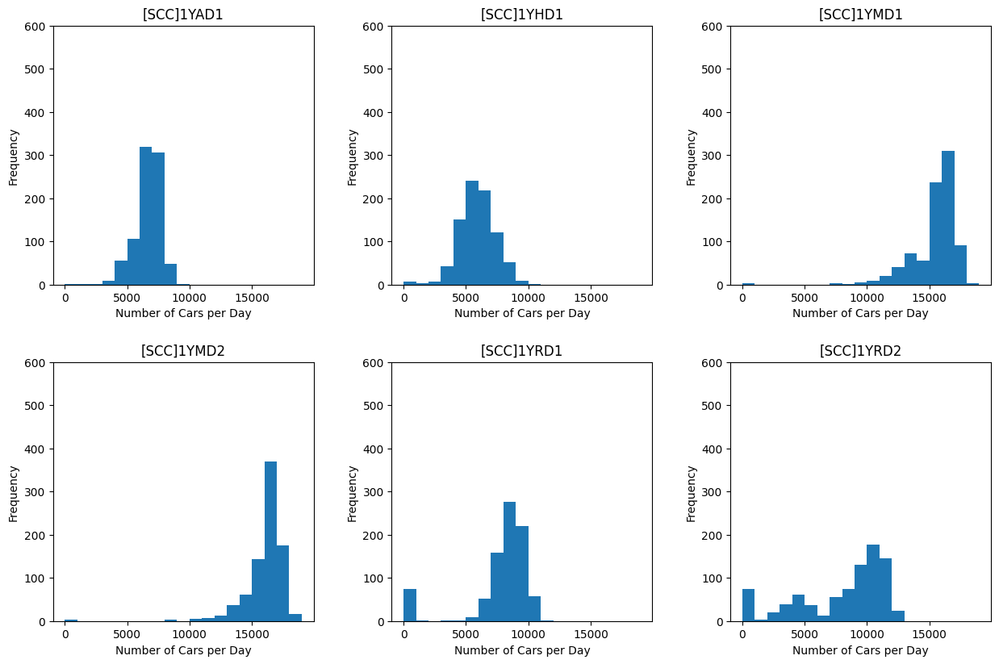

In [ ]:
n_plots = len(UKA00575_traffic_all)
names = list(UKA00575_traffic_all.keys())

fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], wspace=0.3, hspace=0.3)

for x in range(n_plots):
    plot_df = UKA00575_cars_per_day[names[x]]
    ax = plt.subplot(gs[x])
    ax.hist(plot_df["cars"], bins = np.arange(0,20000,1000))
    ax.set_ylim([0,600])
    ax.set_title(f"{names[x]}")
    ax.set_ylabel("Frequency")
    ax.set_xlabel("Number of Cars per Day")

#### UKA00622

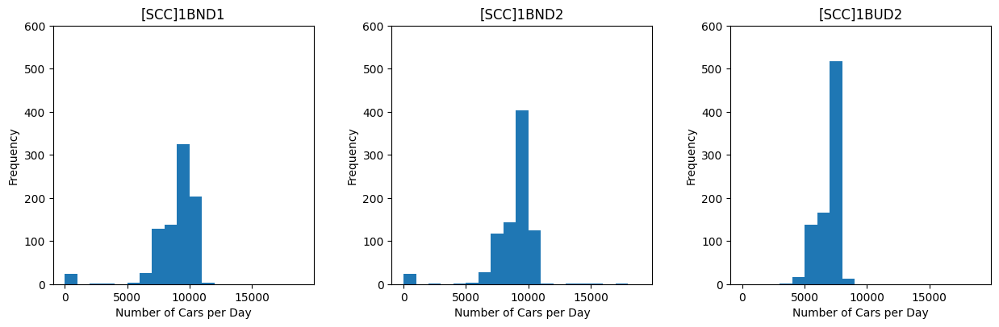

In [ ]:
n_plots = len(UKA00622_traffic_all)
names = list(UKA00622_traffic_all.keys())

fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], wspace=0.3, hspace=0.3)

for x in range(n_plots):
    plot_df = UKA00622_cars_per_day[names[x]]
    ax = plt.subplot(gs[x])
    ax.hist(plot_df["cars"], bins = np.arange(0,20000,1000))
    ax.set_ylim([0,600])
    ax.set_title(f"{names[x]}")
    ax.set_ylabel("Frequency")
    ax.set_xlabel("Number of Cars per Day")

#### UKA00181

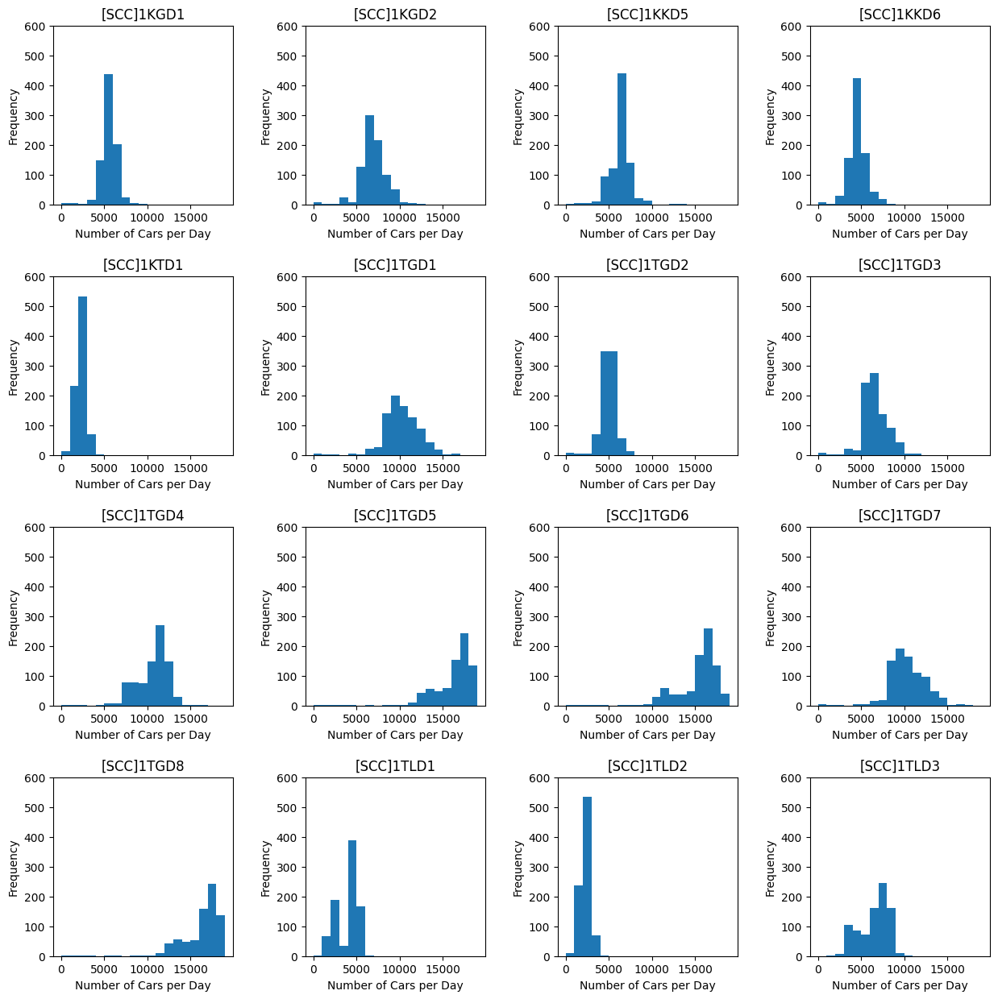

In [ ]:
n_plots = len(UKA00181_traffic_all)
names = list(UKA00181_traffic_all.keys())

fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(4, 4, width_ratios=[1, 1, 1,1], wspace=0.4, hspace=0.4)

for x in range(n_plots):
    plot_df = UKA00181_cars_per_day[names[x]]
    ax = plt.subplot(gs[x])
    ax.hist(plot_df["cars"], bins = np.arange(0,20000,1000))
    ax.set_ylim([0,600])
    ax.set_title(f"{names[x]}")
    ax.set_ylabel("Frequency")
    ax.set_xlabel("Number of Cars per Day")

### Descriptive Statistics

The same as AQ, we'll calcualte the descriptives for the sites

In [ ]:
# Descriptives Please
CAZ_date = datetime.datetime(2023,2,27)

#Dicts to store data
UKA00575_desc_dict = {}
UKA00622_desc_dict = {}
UKA00181_desc_dict = {}


def calc_desc(site, sensor):
    site_name = site + "_cars_per_day"
    df = globals()[site_name][sensor]
    df["date"] = pd.to_datetime(df["date"])
    df_pre = df[(df["date"]>=CAZ_date - pd.DateOffset(years =1)) & (df["date"]< CAZ_date)]
    df_post = df[(df["date"]>=CAZ_date) & (df["date"]< CAZ_date + pd.DateOffset(years =1)) ]

    pre_stats = df_pre["cars"].describe()
    pre_stats['variance'] = df_pre["cars"].var()
    pre_stats['skewness'] = df_pre["cars"].skew()
    pre_stats['kurtosis'] = df_pre["cars"].kurt()
    pre_stats['range'] = df_pre["cars"].max() - df_pre["cars"].min()
    pre_stats['iqr'] = df_pre["cars"].quantile(0.75) - df_pre["cars"].quantile(0.25)

    post_stats = df_post["cars"].describe()
    post_stats['variance'] = df_post["cars"].var()
    post_stats['skewness'] = df_post["cars"].skew()
    post_stats['kurtosis'] = df_post["cars"].kurt()
    post_stats['range'] = df_post["cars"].max() - df_post["cars"].min()
    post_stats['iqr'] = df_post["cars"].quantile(0.75) - df_post["cars"].quantile(0.25)

    stats_df = pd.DataFrame(list(pre_stats.items()), columns=['Statistic', 'Pre'])
    stats_df["Post"] = list(post_stats.values)
    return stats_df

for s_name in site_names["UKA00575"]:
    UKA00575_desc_dict[s_name] = calc_desc("UKA00575",s_name)

for s_name in site_names["UKA00622"]:
    UKA00622_desc_dict[s_name] = calc_desc("UKA00622",s_name)

for s_name in site_names["UKA00181"]:
    UKA00181_desc_dict[s_name] = calc_desc("UKA00181",s_name)



Now save the descriptives to an excel file

In [ ]:
#  Now save these stats to an excel file to make it easier to get them into word

file_path = folder_path + '/Data/Traffic_Descriptives.xlsx'

# List of dictionaries
dicts = [
    ("UKA00575_desc_dict", UKA00575_desc_dict),
    ("UKA00622_desc_dict", UKA00622_desc_dict),
    ("UKA00181_desc_dict", UKA00181_desc_dict)
]

# Create a new Excel writer object
with pd.ExcelWriter(file_path) as writer:
    # Iterate over the list of dictionary names and dictionaries
    for dict_name, desc_dict in dicts:
        # Iterate over the dictionary
        for sheet_name, df in desc_dict.items():
            # Create a save name combining dictionary name and sheet name
            save_name = f"{dict_name.split('_')[0]}_{sheet_name.split(']')[1]}"
            # Write each DataFrame to a separate sheet named after the save name
            df.to_excel(writer, sheet_name=save_name, index=False)


## Aggregating Values

We have multiple sensor surrounding each site, so we'll get a single value by aggregating the sites, we'll use the mean.

In [ ]:
#Now we caluclate the mean cars per day
#Column names for DF
col_list = ["date"]
col_list = col_list + site_names["UKA00575"]

loop_list = col_list[2:]

#Initialise
UKA00575_cars_per_day[col_list[1]]["date"] = pd.to_datetime(UKA00575_cars_per_day[col_list[1]]["date"])
UKA00575_total_traffic_mean = UKA00575_cars_per_day[col_list[1]]


x = 3
#Loop through the others and merge
for s_name in loop_list:
    UKA00575_cars_per_day[s_name]["date"] = pd.to_datetime(UKA00575_cars_per_day[s_name]["date"])
    UKA00575_total_traffic_mean = pd.merge(UKA00575_total_traffic_mean,UKA00575_cars_per_day[s_name], on = "date")
    names = col_list[0:x]

    UKA00575_total_traffic_mean.columns = names
    x += 1

UKA00575_total_traffic_mean['average_cars_pd'] = UKA00575_total_traffic_mean[col_list[1:-1]].median(axis=1)
daily_mean = UKA00575_total_traffic_mean[UKA00575_total_traffic_mean["average_cars_pd"] != 0]["average_cars_pd"].mean()
UKA00575_total_traffic_mean["average_cars_pd"] = UKA00575_total_traffic_mean["average_cars_pd"].replace(0,daily_mean)


#UKA00622
for s_name in site_names["UKA00622"]:
    UKA00622_traffic_all[s_name] = pd.read_pickle(traffic_path + s_name + "_20220201_20240601_flow")
    UKA00622_traffic_all[s_name]['date'] = UKA00622_traffic_all[s_name]['ISO_time'].dt.date

    #Now calculate the total cars per day
    UKA00622_traffic_all[s_name]['date'] = UKA00622_traffic_all[s_name]['ISO_time'].dt.date
    UKA00622_traffic_all[s_name]["time_diff"] = UKA00622_traffic_all[s_name]["ISO_time"].diff().dt.total_seconds()/60
    UKA00622_traffic_all[s_name]["time_diff"].iloc[0] = 0
    UKA00622_traffic_all[s_name]["cars"] = UKA00622_traffic_all[s_name]["flow"] * UKA00622_traffic_all[s_name]["time_diff"]

    mean_cars = UKA00622_traffic_all[s_name][UKA00622_traffic_all[s_name]["cars"] != 0]["cars"].mean()
    UKA00622_traffic_all[s_name]["cars"] = UKA00622_traffic_all[s_name]["cars"].replace(0,mean_cars)

    UKA00622_cars_per_day[s_name] = UKA00622_traffic_all[s_name].groupby("date")['cars'].sum().reset_index()

#Now we caluclate the mean cars per day
#Column names for DF
col_list = ["date"]
col_list = col_list + site_names["UKA00622"]

loop_list = col_list[2:]

#Initialise
UKA00622_cars_per_day[col_list[1]]["date"] = pd.to_datetime(UKA00622_cars_per_day[col_list[1]]["date"])
UKA00622_total_traffic_mean = UKA00622_cars_per_day[col_list[1]]

x = 3
#Loop through the others and merge
for s_name in loop_list:
    UKA00622_cars_per_day[s_name]["date"] = pd.to_datetime(UKA00622_cars_per_day[s_name]["date"])
    UKA00622_total_traffic_mean = pd.merge(UKA00622_total_traffic_mean,UKA00622_cars_per_day[s_name], on = "date")
    names = col_list[0:x]

    UKA00622_total_traffic_mean.columns = names
    x += 1

UKA00622_total_traffic_mean['average_cars_pd'] = UKA00622_total_traffic_mean[col_list[1:-1]].median(axis=1)
daily_mean = UKA00622_total_traffic_mean[UKA00622_total_traffic_mean["average_cars_pd"] != 0]["average_cars_pd"].mean()
UKA00622_total_traffic_mean["average_cars_pd"] = UKA00622_total_traffic_mean["average_cars_pd"].replace(0,daily_mean)

#UKA00181

for s_name in site_names["UKA00181"]:
    UKA00181_traffic_all[s_name] = pd.read_pickle(traffic_path + s_name + "_20220201_20240601_flow")
    UKA00181_traffic_all[s_name]['date'] = UKA00181_traffic_all[s_name]['ISO_time'].dt.date

    #Now calculate the total cars per day
    UKA00181_traffic_all[s_name]['date'] = UKA00181_traffic_all[s_name]['ISO_time'].dt.date
    UKA00181_traffic_all[s_name]["time_diff"] = UKA00181_traffic_all[s_name]["ISO_time"].diff().dt.total_seconds()/60
    UKA00181_traffic_all[s_name]["time_diff"].iloc[0] = 0
    UKA00181_traffic_all[s_name]["cars"] = UKA00181_traffic_all[s_name]["flow"] * UKA00181_traffic_all[s_name]["time_diff"]

    mean_cars = UKA00181_traffic_all[s_name][UKA00181_traffic_all[s_name]["cars"] != 0]["cars"].mean()
    UKA00181_traffic_all[s_name]["cars"] = UKA00181_traffic_all[s_name]["cars"].replace(0,mean_cars)

    UKA00181_cars_per_day[s_name] = UKA00181_traffic_all[s_name].groupby("date")['cars'].sum().reset_index()

#Now we caluclate the mean cars per day
#Column names for DF
col_list = ["date"]
col_list = col_list + site_names["UKA00181"]

loop_list = col_list[2:]

#Initialise
UKA00181_cars_per_day[col_list[1]]["date"] = pd.to_datetime(UKA00181_cars_per_day[col_list[1]]["date"])
UKA00181_total_traffic_mean = UKA00181_cars_per_day[col_list[1]]

x = 3
#Loop through the others and merge
for s_name in loop_list:
    UKA00181_cars_per_day[s_name]["date"] = pd.to_datetime(UKA00181_cars_per_day[s_name]["date"])
    UKA00181_total_traffic_mean = pd.merge(UKA00181_total_traffic_mean,UKA00181_cars_per_day[s_name], on = "date")
    names = col_list[0:x]

    UKA00181_total_traffic_mean.columns = names
    x += 1

UKA00181_total_traffic_mean['average_cars_pd'] = UKA00181_total_traffic_mean[col_list[1:-1]].median(axis=1)
daily_mean = UKA00181_total_traffic_mean[UKA00181_total_traffic_mean["average_cars_pd"] != 0]["average_cars_pd"].mean()
UKA00181_total_traffic_mean["average_cars_pd"] = UKA00181_total_traffic_mean["average_cars_pd"].replace(0,daily_mean)

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\4158616108.py:36: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  UKA00622_traffic_all[s_name]["time_diff"].iloc[0] = 0
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\4158616108.py:36: Setti

### Aggregated Histograms

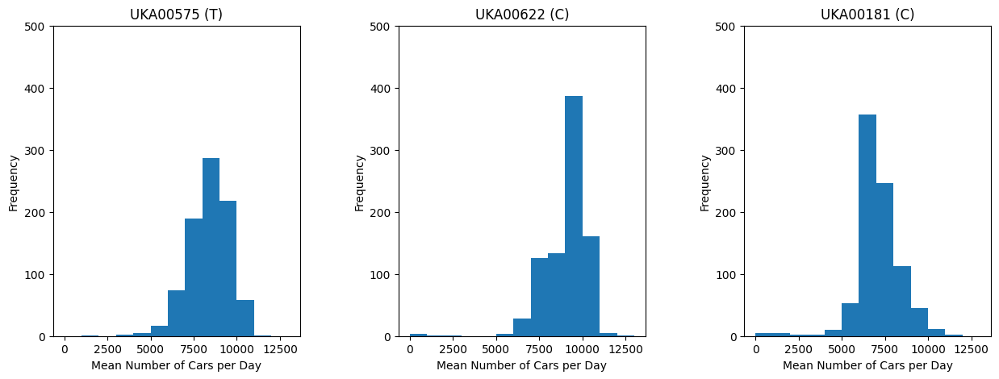

In [ ]:
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1], wspace=0.4, hspace=0.4)

xmax = 14000
step = 1000
ax1 = plt.subplot(gs[0])
ax1.hist(UKA00575_total_traffic_mean["average_cars_pd"], bins = np.arange(0,xmax,step))
ax1.set_ylim([0,500])
ax1.set_title(f"UKA00575 (T)")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("Mean Number of Cars per Day")

#UKA00622
ax2 = plt.subplot(gs[1])
ax2.hist(UKA00622_total_traffic_mean["average_cars_pd"],bins = np.arange(0,xmax,step))
ax2.set_ylim([0,500])
ax2.set_title(f"UKA00622 (C)")
ax2.set_ylabel("Frequency")
ax2.set_xlabel("Mean Number of Cars per Day")

#UKA00181
ax3 = plt.subplot(gs[2])
ax3.hist(UKA00181_total_traffic_mean["average_cars_pd"],bins = np.arange(0,xmax,step))
ax3.set_ylim([0,500])
ax3.set_title(f"UKA00181 (C)")
ax3.set_ylabel("Frequency")
ax3.set_xlabel("Mean Number of Cars per Day")

plt.show()

### Descriptives

In [ ]:
def calc_desc_mean(site):
    site_name = site + "_total_traffic_mean"
    df = globals()[site_name]

    df_pre = df[(df["date"]>=CAZ_date - pd.DateOffset(years =1)) & (df["date"]< CAZ_date)]
    df_post = df[(df["date"]>=CAZ_date) & (df["date"]< CAZ_date + pd.DateOffset(years =1)) ]

    pre_stats = df_pre["average_cars_pd"].describe()
    pre_stats['variance'] = df_pre["average_cars_pd"].var()
    pre_stats['skewness'] = df_pre["average_cars_pd"].skew()
    pre_stats['kurtosis'] = df_pre["average_cars_pd"].kurt()
    pre_stats['range'] = df_pre["average_cars_pd"].max() - df_pre["average_cars_pd"].min()
    pre_stats['iqr'] = df_pre["average_cars_pd"].quantile(0.75) - df_pre["average_cars_pd"].quantile(0.25)

    post_stats = df_post["average_cars_pd"].describe()
    post_stats['variance'] = df_post["average_cars_pd"].var()
    post_stats['skewness'] = df_post["average_cars_pd"].skew()
    post_stats['kurtosis'] = df_post["average_cars_pd"].kurt()
    post_stats['range'] = df_post["average_cars_pd"].max() - df_post["average_cars_pd"].min()
    post_stats['iqr'] = df_post["average_cars_pd"].quantile(0.75) - df_post["average_cars_pd"].quantile(0.25)

    stats_df = pd.DataFrame(list(pre_stats.items()), columns=['Statistic', 'Pre'])
    stats_df["Post"] = list(post_stats.values)
    return stats_df

descriptive_stats = {}
descriptive_stats["UKA00575"] = calc_desc_mean("UKA00575")
descriptive_stats["UKA00622"] = calc_desc_mean("UKA00622")
descriptive_stats["UKA00181"] = calc_desc_mean("UKA00181")

#  Now save these stats to an excel file to make it easier to get them into word
file_path = folder_path + '/Data/Traffic_Descriptives_agg.xlsx'

# Create a new Excel writer object
with pd.ExcelWriter(file_path) as writer:
    # Iterate over the dictionary
    for sheet_name, df in descriptive_stats.items():
        # Write each DataFrame to a separate sheet named after the key
        df.to_excel(writer, sheet_name=sheet_name, index=False)

Now for a boxplot of the mean cars per day

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1953378759.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax1.boxplot(traffic_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],


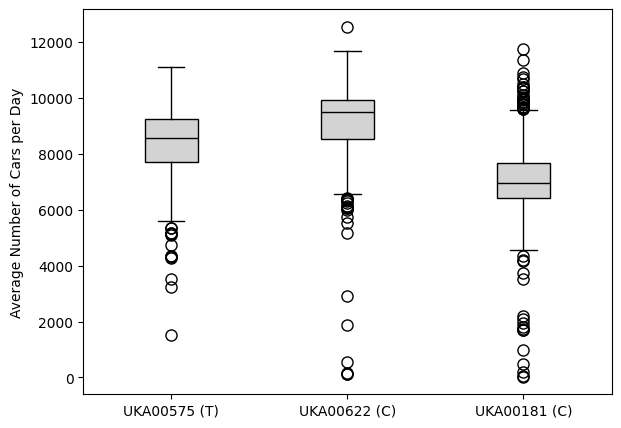

In [ ]:
# Extract NO2 values
DEFRA_traffic = [UKA00575_total_traffic_mean,UKA00622_total_traffic_mean,UKA00181_total_traffic_mean]
traffic_values = [df['average_cars_pd'] for df in DEFRA_traffic]



# Plotting
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1,2, width_ratios=[1, 1])

#NO2
ax1 = plt.subplot(gs[0])
box = ax1.boxplot(traffic_values, patch_artist=True, labels=["UKA00575 (T)", "UKA00622 (C)", "UKA00181 (C)"],
                  flierprops=dict(marker='o', color='red', markersize=8))

# Customize the boxplot
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(box[element], color='black')

for box_patch in box['boxes']:
    box_patch.set(facecolor='#D3D3D3')

# Set the y-label
ax1.set_ylabel("Average Number of Cars per Day")


plt.show()

#### KS Test

We'll also do a KS test, this will help us decide what test to use afterwards.

The null hypothesis is that the data is normally distributed. Alternative is that it is not normally distributed. If *p-vlaue* < 0.05 we reject the null, and accept the alternative. I.e. if p < 0.05 data is not normally distributed.

In [ ]:
#Standardise the data
for s_name in ["UKA00575","UKA00622","UKA00181"]:
    df_name = s_name + "_total_traffic_mean"
    average_cars_pd = globals()[df_name]['average_cars_pd']
    mean = np.mean(average_cars_pd)
    std = np.std(average_cars_pd)
    standardized_data = (average_cars_pd - mean) / std

    ks_statistic, p_value = stats.kstest(standardized_data,'norm')
    print(f"{s_name}")
    print(f"    KS Statistic: {ks_statistic}")
    print(f"    P-value: {p_value}")
    if(p_value < 0.05):
        print("    => Not Normally Distributed")

UKA00575
    KS Statistic: 0.04831709080371682
    P-value: 0.036388472499300994
    => Not Normally Distributed
UKA00622
    KS Statistic: 0.13823124802349968
    P-value: 1.2021330333849738e-14
    => Not Normally Distributed
UKA00181
    KS Statistic: 0.11166104773991312
    P-value: 1.0695295651195937e-09
    => Not Normally Distributed


None of the data are normally distributed we'll use a Wilcoxon Signed-Rank test, this is analogous to a paired t-test but for non-parametric

## Statistical Tests

We'll use A Wilcoxon Signed-Rank Test to determine if the mean of the cars per day has signifcantly changed after the CAZ. The null hypothesis is that the median difference between before and after is 0 and the alternative that the difference is not zero. If *p* < 0.05 we reject H0. I.e. if *p* < 0.05 then there has been a signfiicant change in traffic.

By default the test is two-tailed (change in either direction)

In [ ]:
test_res_list = []
#UKA00575

UKA00575_pre = UKA00575_total_traffic_mean[(UKA00575_total_traffic_mean["date"] < CAZ_date) & (UKA00575_total_traffic_mean["date"] >= CAZ_date - pd.DateOffset(years = 1))]
UKA00575_post = UKA00575_total_traffic_mean[(UKA00575_total_traffic_mean["date"] >= CAZ_date) & (UKA00575_total_traffic_mean["date"] < CAZ_date + pd.DateOffset(years = 1))]

test_df_pre = UKA00575_pre[["date","average_cars_pd"]].copy()
test_df_post = UKA00575_post[["date","average_cars_pd"]].copy()

statistic, p_value = stats.wilcoxon(test_df_pre["average_cars_pd"], test_df_post["average_cars_pd"])
differences = test_df_post.reset_index()["average_cars_pd"] - test_df_pre.reset_index()["average_cars_pd"]
test_res_list.append(["UKA00575",statistic,p_value,np.median(differences)])

#UKA00622
UKA00622_pre = UKA00622_total_traffic_mean[(UKA00622_total_traffic_mean["date"] < CAZ_date) & (UKA00622_total_traffic_mean["date"] >= CAZ_date - pd.DateOffset(years = 1))]
UKA00622_post = UKA00622_total_traffic_mean[(UKA00622_total_traffic_mean["date"] >= CAZ_date) & (UKA00622_total_traffic_mean["date"] < CAZ_date + pd.DateOffset(years = 1))]

test_df_pre = UKA00622_pre[["date","average_cars_pd"]].copy()
test_df_post = UKA00622_post[["date","average_cars_pd"]].copy()

statistic, p_value = stats.wilcoxon(test_df_pre["average_cars_pd"], test_df_post["average_cars_pd"])
differences = test_df_post.reset_index()["average_cars_pd"] - test_df_pre.reset_index()["average_cars_pd"]
test_res_list.append(["UKA00622",statistic,p_value,np.median(differences)])

#UKA00181
UKA00181_pre = UKA00181_total_traffic_mean[(UKA00181_total_traffic_mean["date"] < CAZ_date) & (UKA00181_total_traffic_mean["date"] >= CAZ_date - pd.DateOffset(years = 1))]
UKA00181_post = UKA00181_total_traffic_mean[(UKA00181_total_traffic_mean["date"] >= CAZ_date) & (UKA00181_total_traffic_mean["date"] < CAZ_date + pd.DateOffset(years = 1))]

test_df_pre = UKA00181_pre[["date","average_cars_pd"]].copy()
test_df_post = UKA00181_post[["date","average_cars_pd"]].copy()

statistic, p_value = stats.wilcoxon(test_df_pre["average_cars_pd"], test_df_post["average_cars_pd"])
differences = test_df_post.reset_index()["average_cars_pd"] - test_df_pre.reset_index()["average_cars_pd"]
test_res_list.append(["UKA00181",statistic,p_value,np.median(differences)])

test_res_df = pd.DataFrame(test_res_list, columns  = ["Site","statistic","p_value","med_diff"])
test_res_df

,Site,statistic,p_value,med_diff
0,UKA00575,20209.5,6.238425e-11,-618.628571
1,UKA00622,32281.0,5.799201e-01,96.084041
2,UKA00181,30769.0,1.925507e-01,93.054591


So in summary, there was no signficant difference in UKA00622 and UKA00181, but there was for UKA00575 (inside the CAZ). The median of differences tells us the majority trend. For the one significant one (UKA00575), the difference was negative implying that traffic post-CAZ was lower than pre-CAZ.

## Traffic Changes

We'll calcualte the total number of cars in a period of one year either side of the CAZ.

In [ ]:
UK00575_totals = [UKA00575_pre['average_cars_pd'].sum(),UKA00575_post['average_cars_pd'].sum()]
UK00622_totals = [UKA00622_pre['average_cars_pd'].sum(),UKA00622_post['average_cars_pd'].sum()]
UK00181_totals = [UKA00181_pre['average_cars_pd'].sum(),UKA00181_post['average_cars_pd'].sum()]

traffic_totals_list = [
    ['UKA00575', UK00575_totals[0],UK00575_totals[1]],
    ['UKA00622', UK00622_totals[0],UK00622_totals[1]],
    ['UKA00181', UK00181_totals[0],UK00181_totals[1]]
]

traffic_totals = pd.DataFrame(traffic_totals_list, columns = ["Site","Pre","Post"])
traffic_totals["abs_diff"] = traffic_totals["Post"] - traffic_totals["Pre"]
traffic_totals["pct_diff"] = 100*traffic_totals["abs_diff"]/traffic_totals["Pre"]
traffic_totals

,Site,Pre,Post,abs_diff,pct_diff
0,UKA00575,3.142491e+06,2.953353e+06,-189138.023377,-6.018730
1,UKA00622,3.285294e+06,3.321921e+06,36626.905494,1.114875
2,UKA00181,2.581818e+06,2.595856e+06,14037.538575,0.543708


We can plot those totals

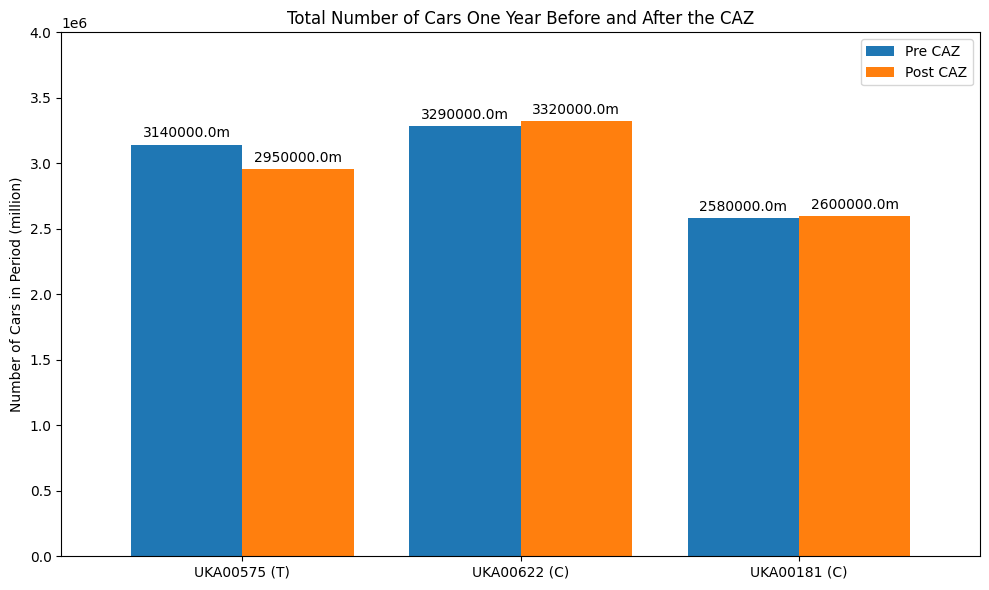

,index,Site,Pre,Post,abs_diff,pct_diff
0,0,UKA00575,3.142491e+06,2.953353e+06,-189138.023377,-6.018730
1,1,UKA00622,3.285294e+06,3.321921e+06,36626.905494,1.114875
2,2,UKA00181,2.581818e+06,2.595856e+06,14037.538575,0.543708


In [ ]:
# Set the site column as index (optional, for better plot labels)
traffic_totals.set_index('Site', inplace=False)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting both columns
#traffic_data_df.plot(kind='bar', ax=ax, width=0.8)
bars = traffic_totals[["Pre","Post"]].plot(kind='bar', ax=ax, width=0.8, legend=True)


# Customize the plot
ax.set_title('Total Number of Cars One Year Before and After the CAZ')
ax.set_ylabel('Number of Cars in Period (million)')
ax.set_ylim([0,4e6])
ax.legend(labels = ["Pre CAZ","Post CAZ"])

# Add data callouts
for container in bars.containers:
    for rect in container:
        height = rect.get_height()
        # Add a text label
        ax.annotate(f'{round(height,-4)}m',
                    xy=(rect.get_x() + rect.get_width() / 2, height),  # Position of the text
                    xytext=(0, 3),  # Offset of the text
                    textcoords="offset points",
                    ha='center', va='bottom')

# Display the plot
custom_labels = ["UKA00575 (T)","UKA00622 (C)","UKA00181 (C)"]
ax.set_xticks(ticks=range(len(custom_labels)), labels=custom_labels)
plt.xticks(rotation = 0)
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

traffic_totals.reset_index()

So the summary of this traffic analysis is:
- No significant difference in traffic pre and post CAZ for UKA00622 and UKA00181, but UKA00575 significantly reduced.
- Changes in total number of cars:
    - UKA00575 = -6%
    - UKA00622 = +1.11%
    - UKA00181 = +0.54%

- Note the last two are not statistically significantly different.

Next we'll be looking at correlations between traffic volume and air quality.

## Spillover

Spillover will be assessed by considering traffic at other locations. If these chagnes are also found to be non-significant then we can conclude that there has been no negative spillover effects.

First we need to get data from a series of other sensors surrounding the CAZ.

In [ ]:
#Sites we want
traffic_outer_sites = ["[SCC]1FKD1","[SCC]1FJD2","[SCC]1BCD1","[SCC]1BCD2","[SCC]1BCD3","[SCC]1XFD1","[SCC]1XFD2"]

#Coords of all sites within 2km of Peace Gardens
all_sites = SUFO_Traffic.locate_traffic_sites("53.38053145527386","-1.4695918832784804","2","2024-06-25T01:00:00","2024-06-26T01:00:00", add_distance=1)

#Coords of sites we want
traffic_outer_coords = {key: value for key, value in all_sites.items() if key in traffic_outer_sites}

all_sites_df = pd.DataFrame(all_sites).transpose()
all_sites_df.columns = ["coords","distance"]
all_sites_df.sort_values("distance")
#Dict with distances > 1
traffic_outer_coords = {key: value[0] for key, value in all_sites.items()if value[1] > 1.2}

### Site Map

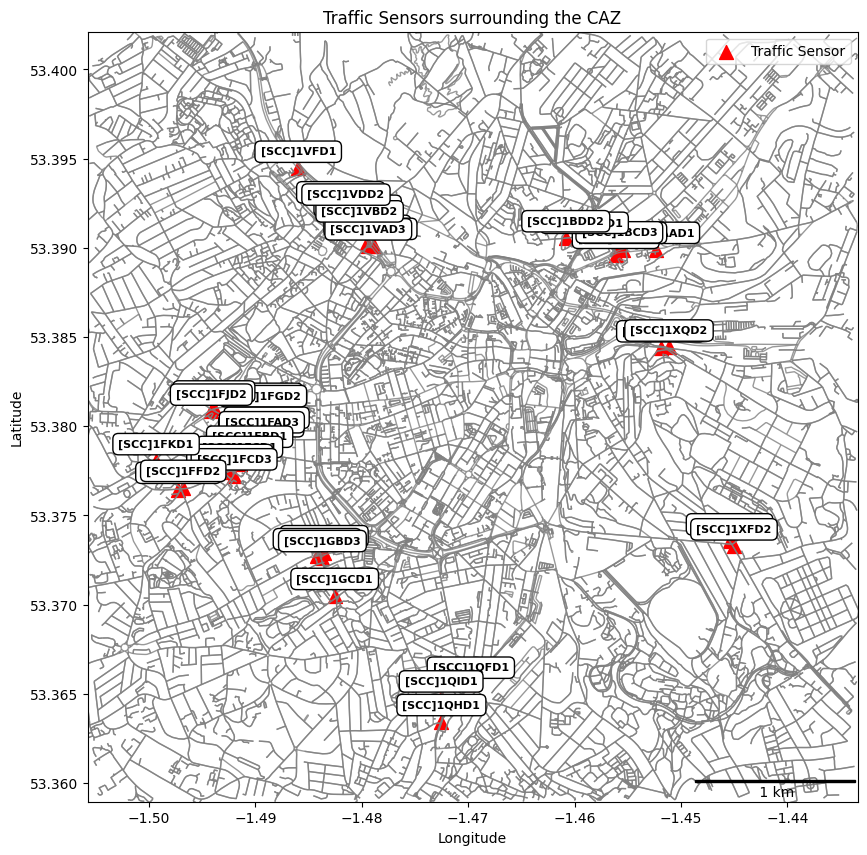

In [ ]:
#Map of sensors
lat  = "53.38053145527386"
long = "-1.4695918832784804"

#Coords of Traffic sites
sensor_names = list(traffic_outer_coords.keys())

# Define the bounding box coordinates (in this example, a small area in Sheffield)
north, east, south, west = SUFO_Traffic.calculate_bounding_box(lat, long, "2")

#Maps are saved as GraphML, load the correct one
filename = f"sheffield_{south}_{west}_{north}_{east}.graphml"
path = folder_path + "/Maps/"

#Now load
file_path = path + filename

# Check if the file exists
if os.path.exists(file_path):
    # Load the graph from the file
    graph = ox.load_graphml(filepath=file_path)
else:
    # If the file doesn't exist, download and save the graph as before
    graph = ox.graph_from_bbox(north, south, east, west, network_type='all')
    ox.save_graphml(graph, filepath=file_path)

# Convert the graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(graph)
# Create a GeoDataFrame for the main marker
main_marker = gpd.GeoDataFrame(geometry=[Point(long, lat)], crs="EPSG:4326")
main_marker = main_marker.to_crs(edges.crs)

additional_markers = gpd.GeoDataFrame(
    geometry=[Point(lon, lat) for lat, lon in traffic_outer_coords.values()],
    crs="EPSG:4326"
)

additional_markers = additional_markers.to_crs(edges.crs)
#ADD OTHER POINT
fig, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=1, edgecolor='gray', alpha = 0.8)

# Plot the main marker
# Plot the additional markers
additional_markers.plot(ax=ax, color='red', marker='^', markersize=100, label='Traffic Sensor', alpha = 1)

# Annotate each additional marker with text from sensor_names list
for idx, row in additional_markers.iterrows():
    sensor_name = sensor_names[idx] if idx < len(sensor_names) else 'Unnamed Sensor'
    ax.annotate(sensor_name, xy=(row['geometry'].x, row['geometry'].y), xytext=(0, 10),
                textcoords='offset points', ha='center', fontsize=8, color='black', fontweight = "bold",
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

#Add a scale bar
scale_bar_length = 0.015 # 0.015 = 1km

# Define the font properties for the scale bar label
fontprops = FontProperties(size=10)

# Create the scale bar
scalebar = AnchoredSizeBar(ax.transData,
                           scale_bar_length,   # length of the bar in data units (meters)
                           f'1 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=0.0001,
                           fontproperties=fontprops)

# Add the scale bar to the plot
ax.add_artist(scalebar)

# Set the extent of the plot
ax.set_xlim([west, east])
ax.set_ylim([south, north])

plt.title(f"Traffic Sensors surrounding the CAZ")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()
plt.show()

### Load Data
For those, retreive the data

In [ ]:
path = folder_path + "/Data/Raw/SUFO Traffic/"

outer_traffic_all = {}
outer_traffic_missing = {}
for s_name in sensor_names:
    #SUFO_Traffic.parse_sensor(s_name,"2022-02-01T01:00:00","2024-06-01T01:00:00","G:/My Drive/03 Semester 3/SUFO Data/Pickles/")
    outer_traffic_all[s_name] = pd.read_pickle(path + s_name + "_20220201_20240601_flow")
    outer_traffic_all[s_name]["flow"] =  outer_traffic_all[s_name]["flow"].apply(lambda x: np.where(x < -1000,np.nan,x))

    #Now calculate the total cars per day
    outer_traffic_all[s_name]['date'] = outer_traffic_all[s_name]['ISO_time'].dt.date
    outer_traffic_all[s_name]["time_diff"] = outer_traffic_all[s_name]["ISO_time"].diff().dt.total_seconds()/60
    outer_traffic_all[s_name]["time_diff"].iloc[0] = 0
    outer_traffic_all[s_name]["cars"] = outer_traffic_all[s_name]["flow"] * outer_traffic_all[s_name]["time_diff"]

     #Trim to the date range
    outer_traffic_all[s_name] = outer_traffic_all[s_name][(outer_traffic_all[s_name]["date"] < (CAZ_date + pd.DateOffset(years = 1)).date()) & (outer_traffic_all[s_name]["date"] >= (CAZ_date - pd.DateOffset(years = 1)).date())]

    #Missing data numbers
    outer_traffic_missing[s_name] = [outer_traffic_all[s_name]["cars"].isna().sum(),len(outer_traffic_all[s_name]["cars"])]

outer_traffic_missing_df = pd.DataFrame(outer_traffic_missing).transpose()
outer_traffic_missing_df.columns = ["n_missing","n_total"]
outer_traffic_missing_df["pct_missing"] = 100*(outer_traffic_missing_df["n_missing"]/outer_traffic_missing_df["n_total"])
outer_traffic_missing_df

C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1428415638.py:13: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  outer_traffic_all[s_name]["time_diff"].iloc[0] = 0
C:\Users\guto_\AppData\Local\Temp\ipykernel_29172\1428415638.py:13: SettingW

,n_missing,n_total,pct_missing
[SCC]1AAD1,855,35025,2.441113
[SCC]1BCD1,856,35025,2.443969
[SCC]1BCD2,856,35025,2.443969
[SCC]1BCD3,856,35025,2.443969
[SCC]1BDD1,856,35025,2.443969
[SCC]1BDD2,856,35025,2.443969
[SCC]1FAD1,1036,35025,2.957887
[SCC]1FAD2,856,35025,2.443969
[SCC]1FAD3,856,35025,2.443969
[SCC]1FBD1,856,35025,2.443969


Now plot the read flows

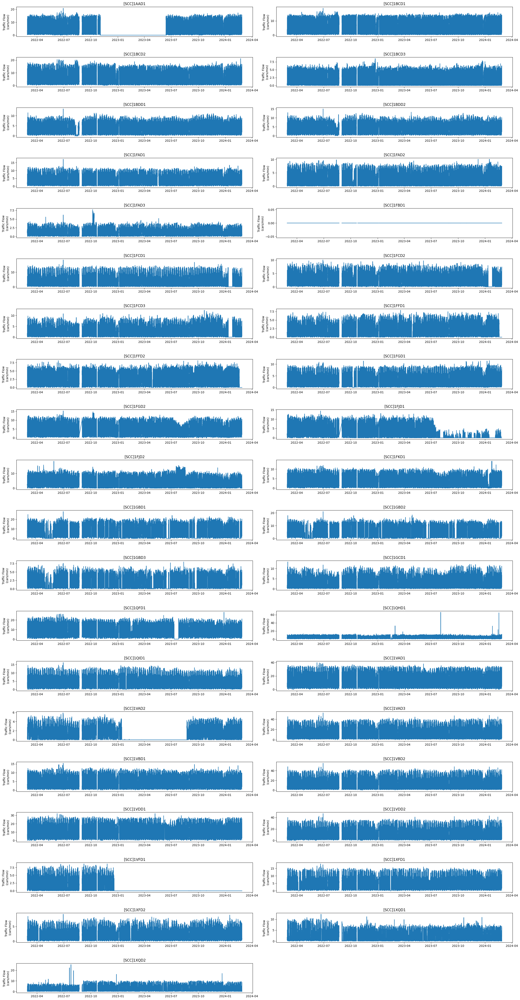

In [ ]:
fig = plt.figure(figsize=(30, 60))
gs = gridspec.GridSpec(20, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.7)
x = 0

for s_name in outer_traffic_all:
    ax = plt.subplot(gs[x])
    ax.plot(outer_traffic_all[s_name]["ISO_time"],outer_traffic_all[s_name]["flow"])
    ax.set_ylabel("Traffic Flow \n(cars/min)")
    ax.set_title(f"{s_name}")
    x += 1

So the stats say the maximum missing is 2.95%, however upon manual inspection we can see additional sensors need to be removed from analysis. These are sensors that are reporting 0 flow for extended periods of time (hence not missing, but is 0)

The sensors to be removed are:
- [SCC]1AAD1
- [SCC]1VAD2
- [SCC]1VFD1


The maximum missing is 3.2% so let's go on with using all of the sites, use median imputation for those missing values. Also calculate the number of cars per day and add a CAZ tag

### Impute Missing

In [ ]:
CAZ_date = datetime.date(2023,2,27)
outer_cars_per_day = {}
for s_name in sensor_names:
    outer_traffic_all[s_name]["cars"] = outer_traffic_all[s_name]["cars"].fillna(outer_traffic_all[s_name]["cars"].median())
    outer_cars_per_day[s_name] = outer_traffic_all[s_name].groupby("date")['cars'].sum().reset_index()
    outer_cars_per_day[s_name]["caz_time"] = outer_cars_per_day[s_name]["date"].apply(lambda x: "post" if x >= CAZ_date else "pre")

There is only one normally distributed, so we'll use a Wilcoxon Signed Rank Test for all the data

In [ ]:

sensor_names = list(traffic_outer_coords.keys())

#Some have poor data quality so remove those, others have too short a date ranfe
to_remove = [ "[SCC]1FBD1","[SCC]1FGD2","[SCC]1FJD1","[SCC]1AAD1","[SCC]1VAD2","[SCC]1VFD1"]
sensor_names = [elem for elem in sensor_names if elem not in to_remove]

spillover_stats = {}

for s_name in sensor_names:
    test_df = outer_cars_per_day[s_name]

    #Filter dates
    test_df_pre = test_df[(test_df["caz_time"] == "pre") & (test_df["date"] >= (CAZ_date - pd.DateOffset(years = 1)).date())]
    test_df_post = test_df[(test_df["caz_time"] == "post") & (test_df["date"] < (CAZ_date + pd.DateOffset(years = 1)).date())]

    #Do the test
    test_statistic, p_value = stats.wilcoxon(test_df_pre["cars"],test_df_post["cars"])

    #Calculate the median difference
    differences = test_df_post.reset_index()["cars"] - test_df_pre.reset_index()["cars"]
    spillover_stats[s_name] = [test_statistic,p_value,np.median(differences)]


#Significances
spillover_stats_df = pd.DataFrame(spillover_stats).transpose()
spillover_stats_df.columns = ["stat","p_value","m_diff"]
spillover_stats_df["sig"] = spillover_stats_df["p_value"].apply(lambda x: 0 if x >= 0.05 else 1) #1 is significance, 0 is not
spillover_stats_df["dir"] = spillover_stats_df["m_diff"].apply(lambda x: 1 if x >= 0 else -1) # Positive or negative change?

spillover_stats_df[["sig","p_value"]].groupby("sig").count()



,p_value
sig,
0,14
1,19


So 15 changes were not significant and 21 were. Of those significant ones, what direction did each one go?

In [ ]:
spillover_stats_df[["sig","dir"]][spillover_stats_df["sig"] == 1].groupby("dir").count()

,sig
dir,
-1,14
1,5


So of the 35 sites that were analysed, 21 of them showed significant changes in traffic volume, while 15 of them did not.

Of those 21 that did, 16 had reduced traffic volume, while 5 had increased traffic volume. Given that only 5 out of 35 (14%) of our sensors showed a signficant increase.

Now we'll save the output to an Excel file to include in the Appendix

In [ ]:
file_path = folder_path + '/Data/Spillover_Stats.xlsx'
spillover_stats_df["significant"] = spillover_stats_df["p_value"].apply(lambda x: "Yes" if x <= 0.05 else "No" )

spillover_stats_df[["stat","p_value","significant","m_diff"]].to_excel(file_path, index=True)



# 05 Traffic Correlation

This is the final section, the correlation between traffic and air quality. We'll use the Pearson Correlation and the Adjusted R-Squared coefficient to assees the association between pollutant concentration and traffic volume.

This correlation is only assessed surroundign the Primary AQ sites.

## Merging Data

We have all the data we need, we just need to manipulate them into the correct form.

In [ ]:
#NO2
#Normalised Pre
UKA00575_NO2_norm_merged = pd.merge(UKA00575_NO2_post_norm,UKA00575_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00622_NO2_norm_merged = pd.merge(UKA00622_NO2_post_norm,UKA00622_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00181_NO2_norm_merged = pd.merge(UKA00181_NO2_post_norm,UKA00181_total_traffic_mean[["date","average_cars_pd"]], on = "date")


#Non-Normalised Pre
UKA00575_NO2_merged = pd.merge(UKA00575_NO2_pre_norm_daily[["date","NO2"]],UKA00575_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00622_NO2_merged = pd.merge(UKA00622_NO2_pre_norm_daily[["date","NO2"]],UKA00622_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00181_NO2_merged = pd.merge(UKA00181_NO2_pre_norm_daily[["date","NO2"]],UKA00181_total_traffic_mean[["date","average_cars_pd"]], on = "date")

#PM25
#Normalised Pre
UKA00575_PM25_norm_merged = pd.merge(UKA00575_PM25_post_norm,UKA00575_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00622_PM25_norm_merged = pd.merge(UKA00622_PM25_post_norm,UKA00622_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00181_PM25_norm_merged = pd.merge(UKA00181_PM25_post_norm,UKA00181_total_traffic_mean[["date","average_cars_pd"]], on = "date")


#Non-Normalised Pre
UKA00575_PM25_merged = pd.merge(UKA00575_PM25_pre_norm_daily[["date","PM25"]],UKA00575_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00622_PM25_merged = pd.merge(UKA00622_PM25_pre_norm_daily[["date","PM25"]],UKA00622_total_traffic_mean[["date","average_cars_pd"]], on = "date")
UKA00181_PM25_merged = pd.merge(UKA00181_PM25_pre_norm_daily[["date","PM25"]],UKA00181_total_traffic_mean[["date","average_cars_pd"]], on = "date")



## Traffic Correlation

We have to manually define a function to get the Adjusted R-Squared

In [ ]:
#Function to calculate the Adjusted R-Squared.
def calc_rsq(df):
    # Define the independent variables and add a constant
    X = globals()[df]["average_cars_pd"]
    X = sm.add_constant(X)

    pol = df.split("_")[1]
    # Define the dependent variable
    y = globals()[df][pol]
    # Fit the regression model
    model = sm.OLS(y, X).fit()

    return model.rsquared_adj

### Non-Normalised

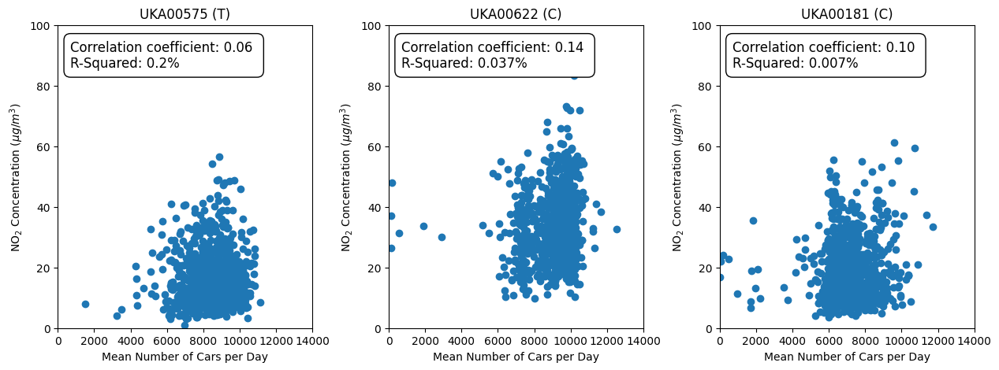

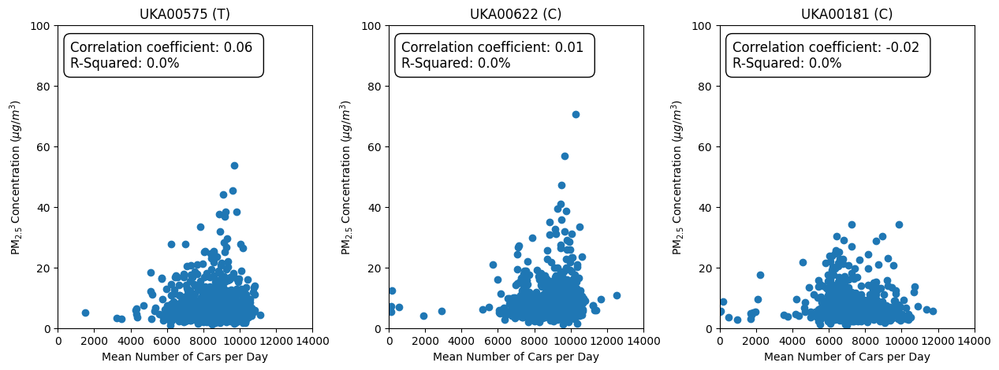

In [ ]:
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1], wspace=0.3, hspace=0.3)

ax1 = plt.subplot(gs[0])
ax1.scatter(UKA00575_NO2_merged["average_cars_pd"],UKA00575_NO2_merged["NO2"])
ax1.set_xlabel("Mean Number of Cars per Day")
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,100])
ax1.set_xlim([0,14000])
ax1.set_title("UKA00575 (T)")

# Add an annotation with the correlation coefficient
coeff, p_value = stats.pearsonr(UKA00575_NO2_merged["average_cars_pd"],UKA00575_NO2_merged["NO2"])
r = calc_rsq("UKA00575_NO2_merged")
textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*abs(r),3)}%'

props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax1.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax2 = plt.subplot(gs[1])
ax2.scatter(UKA00622_NO2_merged["average_cars_pd"],UKA00622_NO2_merged["NO2"])
ax2.set_xlabel("Mean Number of Cars per Day")
ax2.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,100])
ax2.set_xlim([0,14000])
ax2.set_title("UKA00622 (C)")

coeff, p_value = stats.pearsonr(UKA00622_NO2_merged["average_cars_pd"],UKA00622_NO2_merged["NO2"])
r = calc_rsq("UKA00622_NO2_merged")
textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax2.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax3 = plt.subplot(gs[2])
ax3.scatter(UKA00181_NO2_merged["average_cars_pd"],UKA00181_NO2_merged["NO2"])
ax3.set_xlabel("Mean Number of Cars per Day")
ax3.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,100])
ax3.set_xlim([0,14000])
ax3.set_title("UKA00181 (C)")

coeff, p_value = stats.pearsonr(UKA00181_NO2_merged["average_cars_pd"],UKA00181_NO2_merged["NO2"])
r = calc_rsq("UKA00181_NO2_merged")
textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(abs(r)**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax3.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

#Pm25
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1], wspace=0.3, hspace=0.3)

ax1 = plt.subplot(gs[0])
ax1.scatter(UKA00575_PM25_merged["average_cars_pd"],UKA00575_PM25_merged["PM25"])
ax1.set_xlabel("Mean Number of Cars per Day")
ax1.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,100])
ax1.set_xlim([0,14000])
ax1.set_title("UKA00575 (T)")

# Add an annotation with the correlation coefficient
coeff, p_value = stats.pearsonr(UKA00575_PM25_merged["average_cars_pd"],UKA00575_PM25_merged["PM25"])
r = calc_rsq("UKA00575_PM25_merged")
textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax1.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax2 = plt.subplot(gs[1])
ax2.scatter(UKA00622_PM25_merged["average_cars_pd"],UKA00622_PM25_merged["PM25"])
ax2.set_xlabel("Mean Number of Cars per Day")
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,100])
ax2.set_xlim([0,14000])
ax2.set_title("UKA00622 (C)")

coeff, p_value = stats.pearsonr(UKA00622_PM25_merged["average_cars_pd"],UKA00622_PM25_merged["PM25"])
r = calc_rsq("UKA00622_PM25_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax2.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax3 = plt.subplot(gs[2])
ax3.scatter(UKA00181_PM25_merged["average_cars_pd"],UKA00181_PM25_merged["PM25"])
ax3.set_xlabel("Mean Number of Cars per Day")
ax3.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,100])
ax3.set_xlim([0,14000])
ax3.set_title("UKA00181 (C)")

coeff, p_value = stats.pearsonr(UKA00181_PM25_merged["average_cars_pd"],UKA00181_PM25_merged["PM25"])
r = calc_rsq("UKA00181_PM25_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax3.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

plt.show()

### Weather Normalised

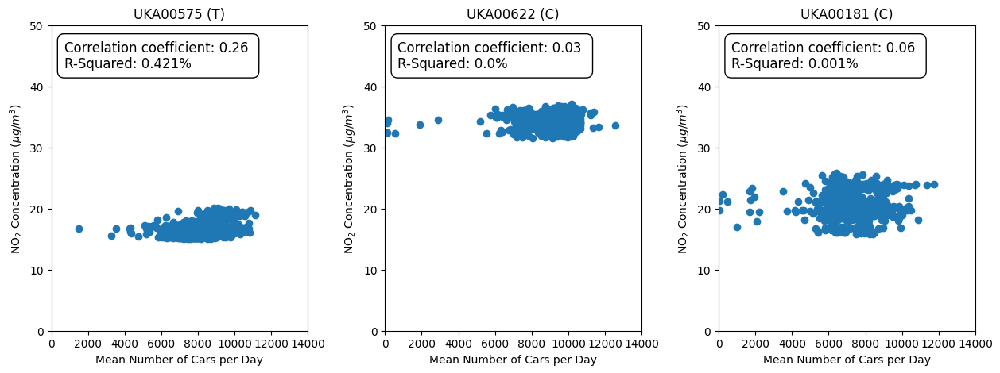

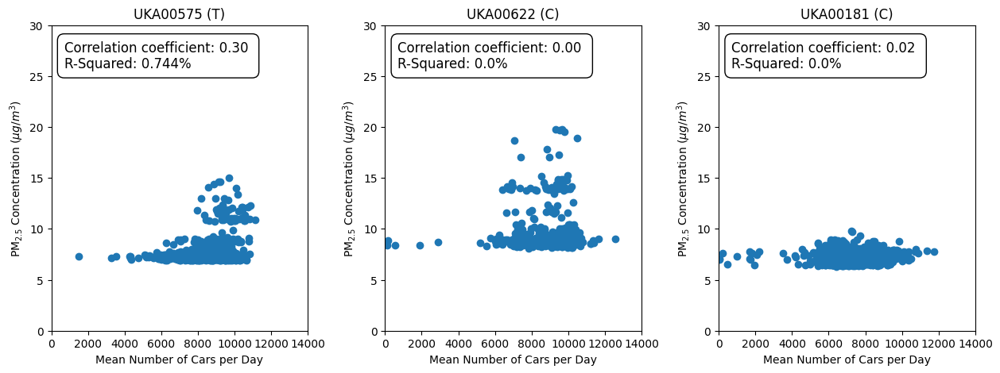

In [ ]:
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1], wspace=0.3, hspace=0.3)

ax1 = plt.subplot(gs[0])
ax1.scatter(UKA00575_NO2_norm_merged["average_cars_pd"],UKA00575_NO2_norm_merged["NO2"])
ax1.set_xlabel("Mean Number of Cars per Day")
ax1.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,50])
ax1.set_xlim([0,14000])
ax1.set_title("UKA00575 (T)")

# Add an annotation with the correlation coefficient
coeff, p_value = stats.pearsonr(UKA00575_NO2_norm_merged["average_cars_pd"],UKA00575_NO2_norm_merged["NO2"])
r = calc_rsq("UKA00575_NO2_norm_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax1.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax2 = plt.subplot(gs[1])
ax2.scatter(UKA00622_NO2_norm_merged["average_cars_pd"],UKA00622_NO2_norm_merged["NO2"])
ax2.set_xlabel("Mean Number of Cars per Day")
ax2.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,50])
ax2.set_xlim([0,14000])
ax2.set_title("UKA00622 (C)")

coeff, p_value = stats.pearsonr(UKA00622_NO2_norm_merged["average_cars_pd"],UKA00622_NO2_norm_merged["NO2"])
r = calc_rsq("UKA00622_NO2_norm_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax2.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax3 = plt.subplot(gs[2])
ax3.scatter(UKA00181_NO2_norm_merged["average_cars_pd"],UKA00181_NO2_norm_merged["NO2"])
ax3.set_xlabel("Mean Number of Cars per Day")
ax3.set_ylabel("NO$_2$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,50])
ax3.set_xlim([0,14000])
ax3.set_title("UKA00181 (C)")

coeff, p_value = stats.pearsonr(UKA00181_NO2_norm_merged["average_cars_pd"],UKA00181_NO2_norm_merged["NO2"])
r = calc_rsq("UKA00181_NO2_norm_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax3.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

#Pm25
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1], wspace=0.3, hspace=0.3)

ax1 = plt.subplot(gs[0])
ax1.scatter(UKA00575_PM25_norm_merged["average_cars_pd"],UKA00575_PM25_norm_merged["PM25"])
ax1.set_xlabel("Mean Number of Cars per Day")
ax1.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax1.set_ylim([0,30])
ax1.set_xlim([0,14000])
ax1.set_title("UKA00575 (T)")

# Add an annotation with the correlation coefficient
coeff, p_value = stats.pearsonr(UKA00575_PM25_norm_merged["average_cars_pd"],UKA00575_PM25_norm_merged["PM25"])
r = calc_rsq("UKA00575_PM25_norm_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax1.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax2 = plt.subplot(gs[1])
ax2.scatter(UKA00622_PM25_norm_merged["average_cars_pd"],UKA00622_PM25_norm_merged["PM25"])
ax2.set_xlabel("Mean Number of Cars per Day")
ax2.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax2.set_ylim([0,30])
ax2.set_xlim([0,14000])
ax2.set_title("UKA00622 (C)")

coeff, p_value = stats.pearsonr(UKA00622_PM25_norm_merged["average_cars_pd"],UKA00622_PM25_norm_merged["PM25"])
r = calc_rsq("UKA00622_PM25_norm_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax2.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

ax3 = plt.subplot(gs[2])
ax3.scatter(UKA00181_PM25_norm_merged["average_cars_pd"],UKA00181_PM25_norm_merged["PM25"])
ax3.set_xlabel("Mean Number of Cars per Day")
ax3.set_ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
ax3.set_ylim([0,30])
ax3.set_xlim([0,14000])
ax3.set_title("UKA00181 (C)")

coeff, p_value = stats.pearsonr(UKA00181_PM25_norm_merged["average_cars_pd"],UKA00181_PM25_norm_merged["PM25"])
r = calc_rsq("UKA00181_PM25_norm_merged")

textstr = f'Correlation coefficient: {coeff:.2f} \nR-Squared: {round(100*(r**2),3)}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black')
ax3.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12,
            bbox=props, verticalalignment='top')

plt.show()

The highest correlation there is 0.30 which is a weak correlation

# 06 Discussion Points

This is a small section to provide some plots and figures for points in the discussion.

Firs point is comparing UKA00575 and S0110 over the same time period.

In [ ]:

date_start = S0110_NO2_daily["date"].min()
date_end = S0110_NO2_daily["date"].max()

#NO2
UKA00575_NO2_filt = UKA00575_NO2_pre_norm_daily[(UKA00575_NO2_pre_norm_daily["date"] >= date_start) & (UKA00575_NO2_pre_norm_daily["date"] <= date_end)]
pre_mean_NO2 = UKA00575_NO2_filt[UKA00575_NO2_filt["caz_time"] == "pre"]["NO2"].mean()
post_mean_NO2 = UKA00575_NO2_filt[UKA00575_NO2_filt["caz_time"] == "post"]["NO2"].mean()
pct_change_NO2 = 100*(post_mean_NO2 - pre_mean_NO2) / pre_mean_NO2

#PM25
UKA00575_PM25_filt = UKA00575_PM25_pre_norm_daily[(UKA00575_PM25_pre_norm_daily["date"] >= date_start) & (UKA00575_PM25_pre_norm_daily["date"] <= date_end)]
pre_mean_PM25 = UKA00575_PM25_filt[UKA00575_PM25_filt["caz_time"] == "pre"]["PM25"].mean()
post_mean_PM25 = UKA00575_PM25_filt[UKA00575_PM25_filt["caz_time"] == "post"]["PM25"].mean()
pct_change_PM25= 100*(post_mean_PM25 - pre_mean_PM25) / pre_mean_PM25

print(["NO2",pre_mean_NO2,post_mean_NO2,pct_change_NO2])
print(["PM25",pre_mean_PM25,post_mean_PM25,pct_change_PM25])

['NO2', 19.382734713699076, 12.553900084657531, -35.231533268704084]
['PM25', 7.4431148097826085, 6.7997779304029295, -8.643382452385802]


Now we'll look at S0110 and the PM25 concentration there

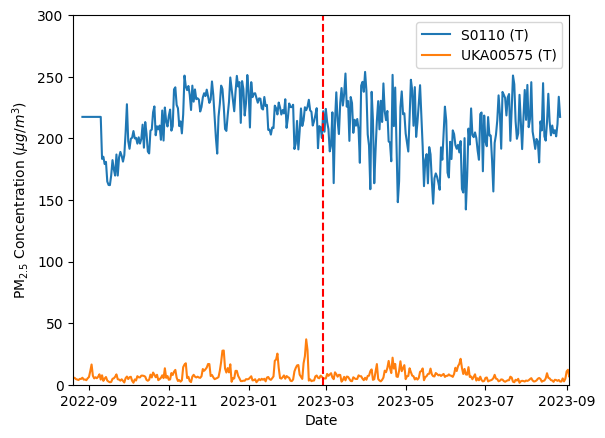

In [ ]:
plt.plot(S0110_PM25_daily["date"],S0110_PM25_daily["PM25"])
plt.plot(UKA00575_PM25_pre_norm_daily["date"],UKA00575_PM25_pre_norm_daily["PM25"])
plt.ylim([0,300])
plt.xlim([date_start - pd.DateOffset(days = 7),date_end + pd.DateOffset(days = 7)])
plt.ylabel("PM$_{2.5}$ Concentration ($µg/m^3$)")
plt.xlabel("Date")
plt.legend(labels = ["S0110 (T)","UKA00575 (T)"])
#Now add a vertical line and shading
plt.axvline(x=caz_vdate, color='red', linestyle='--', label='CAZ Introduction')
plt.show()

